# Import 



In [8]:
## etc.
import os
os.environ['CUDA_VISIBLE_DEVICES'] = "7"

import pandas as pd
from sklearn.model_selection import train_test_split

# torch unet
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F 
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from tqdm import tqdm
import torchvision.models as models


'''# model & optimize
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

import tensorflow as tf
#from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy
from tensorflow.keras.metrics import AUC
# metric loss
from keras import backend as K

# customer object of loss func.
import keras.losses

# Gen - open-data
from keras.preprocessing.image import ImageDataGenerator'''

# polygon
import cv2 
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


import torch.nn.functional as F
import segmentation_models_pytorch as smp
import segmentation_models_pytorch.utils as utils

# Polygons

In [7]:
def Polygons(img,
             epls=0,
             min_=0.1):

    # แปลงรูปภาพเป็นภาพขาว-ดำ (binary image)
    #gray_image = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    _, binary_image = cv2.threshold(img, min_, 255, cv2.THRESH_BINARY)
    binary_image = binary_image.astype(np.uint8)
    #binary_mask = (predicted_mask * 255)

    # Find contours in the binary mask
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Find the vertices of each contour and draw polylines
    polygons = []
    for contour in contours:
        # Convert contours to polygon approximation
        epsilon = epls * cv2.arcLength(contour, True)
        approx_polygon = cv2.approxPolyDP(contour, epsilon, True)
        
        polygons.append(approx_polygon)
        
    return cv2.polylines(img,polygons,isClosed=True, color=(255,0,0) ,thickness = 2)

def history_plot(train,val,metric):
    
    plt.figure(figsize=(12, 6))
    plt.plot(train)
    plt.plot(val)
    plt.title('log')
    plt.ylabel(metric)
    plt.xlabel('epoch')
    plt.legend(['train', 'validate'], loc='upper left')
    plt.show()

# Func.

In [3]:
# class นำเข้ารูปภาพเป็น array สำหรับ DataLoader ของ pytorch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset

# for unet

def validate(model, dataloader, device):
    model.eval()  # Set the model to evaluation mode
    running_loss = 0.0
    running_dice_coefficient = 0.0
    running_iou = 0.0
    total_samples = 0

    with torch.no_grad():  # Disable gradient calculation during validation
        for inputs, targets in tqdm(dataloader, desc="Validation"):
            inputs, targets = inputs.to(device), targets.to(device)

            # Forward pass
            outputs = model(inputs)

            # Calculate loss
            loss = criterion(outputs, targets)
            dice_coeff = DiceCoefficient()(outputs, targets)
            iou = smp.utils.metrics.IoU(threshold=0.5)(outputs, targets)
            
            running_loss += loss.item()
            running_dice_coefficient += dice_coeff.item()
            running_iou += iou.item()

    # average loss and metrics all index of trainset
    val_loss = running_loss / len(dataloader)
    val_dice_coefficient = running_dice_coefficient / len(dataloader)
    val_iou = running_iou / len(dataloader)
    
    return val_loss, val_dice_coefficient, val_iou


class CustomDataset(Dataset):
    
    def __init__(self, dataframe , transform=None):
        
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        
        return len(self.dataframe)

    def __getitem__(self, idx):
        
        img_path = self.dataframe.iloc[idx, 0]
        #img_path = os.path.join(self.image_folder, img_name)
        image = Image.open(img_path).convert('RGB')  # สำหรับ grayscale ให้ใช้ 'L' แทน 'RGB'

        mask_path = self.dataframe.iloc[idx, 1]
        #mask_path = os.path.join(self.mask_folder, mask_name)
        mask = Image.open(mask_path).convert('L')  # ให้ใช้ 'RGB' หาก mask เป็นภาพสี

        if self.transform:
            
            image = self.transform(image)
            mask = self.transform(mask)

        return image, mask
    

# จัดเรียงข้อมูลให้อยู่ใน ทีละ batch และแปลงข้อมูลให้เป็นรูปแบบ tensor เพื่อให้เข้ากับ framework เวลาฝึกโมเดล Pytorch
def custom_collate(batch):
    
    images, masks = zip(*batch)
    images = [torch.tensor(np.array(img)) for img in images]
    masks = [torch.tensor(np.array(mask)) for mask in masks]
    
    return torch.stack(images), torch.stack(masks)

# metric 

class DiceLoss(torch.nn.Module):
    def __init__(self, smooth=1):
        super(DiceLoss, self).__init__()
        self.smooth = smooth

    def forward(self, prediction, target):
        intersection = (prediction * target).sum()
        union = prediction.sum() + target.sum() + self.smooth

        dice_coefficient = (2.0 * intersection + self.smooth) / union
        loss = 1.0 - dice_coefficient

        return loss
    
class DiceCoefficient(nn.Module):
    
    def __init__(self, smooth=1e-5):
        super(DiceCoefficient, self).__init__()
        self.smooth = smooth

    def forward(self, predicted, target):
        intersection = (predicted * target).sum(dim=(2, 3))  # Sum along spatial dimensions
        union = predicted.sum(dim=(2, 3)) + target.sum(dim=(2, 3)) + self.smooth

        dice = (2.0 * intersection + self.smooth) / union
        return dice.mean()  # Take the mean over the batch dimensio
    
def visual_image (exam,rows=3,columns=3,target_size=(256,256)):
    
    plt.rcParams['axes.grid']=True
    fig = plt.figure(figsize=(12, 10))
    
    for i in range(1, rows * columns + 1):
    
        fig.add_subplot(rows, columns, i)
        img_path = exam.iloc[i,0]
        mask_path = exam.iloc[i,1]
    
        image_ = cv2.imread(img_path)
        image_ = cv2.resize(image_, target_size)
        mask_ = cv2.imread(mask_path)
        mask_ = cv2.resize(mask_, target_size)

        plt.imshow(image_)
        plt.imshow(cv2.cvtColor(mask_, cv2.COLOR_BGR2GRAY),alpha=0.2)
        plt.title(exam.iloc[i,2])
        #plt.imshow(Polygons(mask_),alpha=0.3)
    plt.show()
    
def tensor_visual_image (tensor,i_ter=1,rows=1,columns=1):

    plt.rcParams['axes.grid']=True
    fig = plt.figure(figsize=(12, 10))

    for i in range(1, rows * columns + 1):
        
        plt.imshow(image.permute(1, 2, 0))
        plt.imshow(mask.permute(1, 2, 0) ,alpha=0.2)
        plt.title(exam.iloc[i,2])
        #plt.imshow(Polygons(mask_),alpha=0.3)
    
    plt.show()
    
# เพิ่ม . 
def add_dot(df):
    cols = ['filename','mask_filename']
    for i in cols :
        #df[i] = df[i].apply(lambda x: '.' + x[1:])
        df[i] = df[i].str.replace('./dataset', '../dataset')
    return df

def visualize(image, cars_mask=None):
    
    plt.figure(figsize=(12, 6))

    images = [image]
    titles = ['Image']

    if cars_mask is not None:
        images.append(cars_mask)
        titles.append('Cars Mask')

    for i, (img, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        plt.imshow(np.transpose(img, (1, 2, 0)))  # Transpose to (height, width, channels)
        plt.title(title)
        plt.axis('off')

    plt.show()
    
class DiceCoefficientMetric(smp.utils.base.Metric):
    
    def __init__(self, activation=None, smooth=1e-5):
        super(DiceCoefficientMetric, self).__init__(name='dice_coefficient')
        self.activation = activation
        self.smooth = smooth

    def forward(self, y_pred, y_true):
        if self.activation is not None:
            y_pred = self.activation(y_pred)

        intersection = torch.sum(y_true * y_pred)
        union = torch.sum(y_true) + torch.sum(y_pred)

        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        return dice
    
def history_plot(train,val,metric):
    
    plt.figure(figsize=(12, 6))
    plt.plot(train)
    plt.plot(val)
    plt.title('log')
    plt.ylabel(metric)
    plt.xlabel('epoch')
    plt.legend(['train', 'validate'], loc='upper left')
    plt.show()
    
  
# for classification resnet-50
from torchvision.datasets import ImageFolder
from sklearn.metrics import roc_auc_score
import numpy as np

class CustomGenerator(torch.utils.data.Dataset):
    
    def __init__(self, dataframe, transform=None):
        
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        
        return len(self.dataframe)

    def __getitem__(self, index):
        
        annotation = self.dataframe.iloc[index, 0]
        image = Image.open(annotation).convert('RGB')
        label = label = torch.tensor(int(self.dataframe.iloc[index, 3]))
        
        if self.transform:
            image = self.transform(image)
            
        return (image,label)
    

def accuracy(outputs, targets):
    """
    Compute the accuracy given predicted outputs and true targets.

    Args:
    - outputs (torch.Tensor): Predicted outputs from the model
    - targets (torch.Tensor): True labels

    Returns:
    - float: Accuracy
    """
    _, predicted = torch.max(outputs, 1)
    correct = (predicted == targets).sum().item()
    total = targets.size(0)
    accuracy = correct / total
    return accuracy

def encoder_class(dataframe):
    
    encoder = {'benign':1, 'malignant':2, 'normal':0}
    dataframe['class'] = [encoder[i] for i in dataframe['category']]
    
    return dataframe

def validation_step(valid_dl, model, loss_fn):
    
    total_accuracy = 0.0
    total_samples = 0
    
    for image, label in valid_dl:
        
        image ,label = image.to(DEVICE) ,label.to(DEVICE)
        
        out = model(image)
        loss = loss_fn(out, label)
        acc = accuracy(out, label)
        #auc = multiclass_auc(out, label)

        #total_auc += auc * targets.size(0)
        total_samples += targets.size(0)
        total_accuracy += acc * targets.size(0)

    # Compute overall accuracy
    overall_accuracy = total_accuracy / total_samples
    #overall_auc = total_auc / total_samples
    
    return {"val_loss": loss, "val_acc": overall_accuracy} #,"val_auc": overall_auc}


# **Input dataframe**

train: (2535, 3) 
test: (726, 3) 
validate: (363, 3)


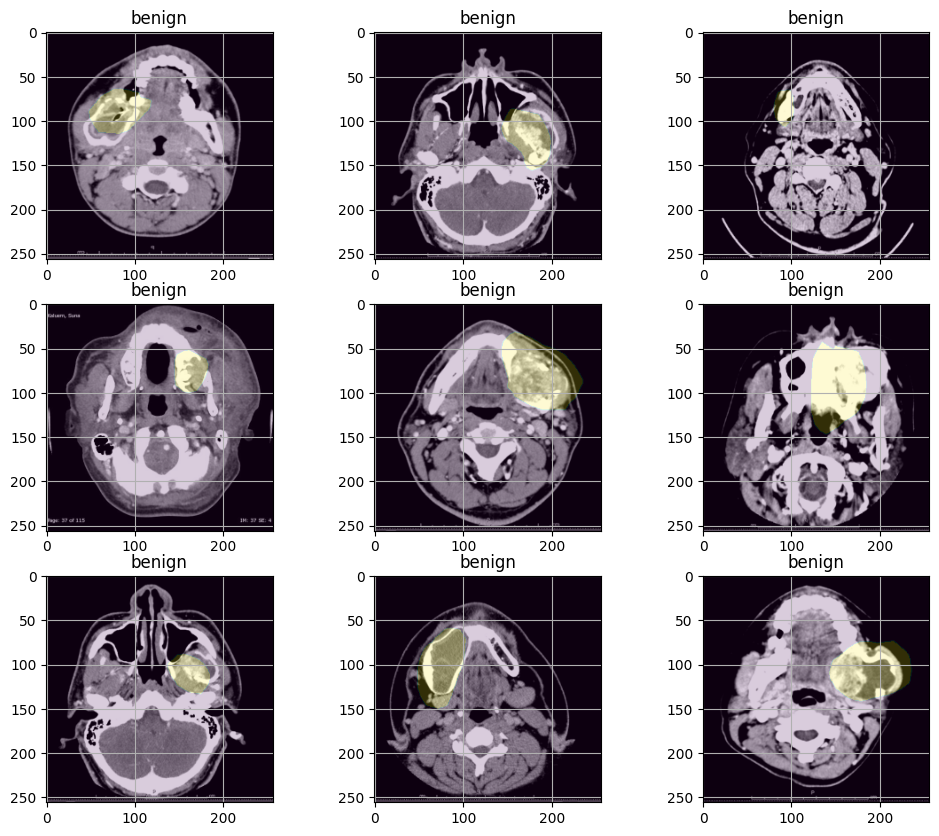

In [4]:
train_path = '../dataset/unet/dataset-train-augment.csv'
train_df = pd.read_csv(train_path)
train_df = add_dot(train_df)

val_path = '../dataset/unet/dataset-validate-augment.csv'
val_df = pd.read_csv(val_path)
val_df = add_dot(val_df)

test_path = '../dataset/unet/dataset-test-augment.csv'
test_df = pd.read_csv(test_path)
test_df = add_dot(test_df)

print('train:',train_df.shape,'\ntest:',test_df.shape,'\nvalidate:',val_df.shape)
visual_image(train_df)

# **Build Unet**

https://github.com/qubvel/segmentation_models.pytorch#encoders

In [4]:
import torch
import numpy as np
import segmentation_models_pytorch as smp
from torchsummary import summary

DEVICE = 'cuda'
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['Tumors']
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
).to(DEVICE)

#preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)
print(model)

Unet(
  (encoder): ResNetEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
      

In [5]:
# prepare dataset
batch_size = 32

# สร้าง transforms สำหรับการทำ Data Augmentation
transform = transforms.Compose([transforms.Resize((256, 256)),
                                transforms.ToTensor(),])

train_set = CustomDataset(train_df,transform=transform)
val_set = CustomDataset(val_df,transform=transform)

#train_set = Dataset(train_df['filename'], train_df['mask_filename'],len(train_df),transform)
#val_set = Dataset(val_df['filename'], val_df['mask_filename'],len(val_df),transform)

train_loader = DataLoader(train_set, 
                          batch_size=batch_size, 
                          shuffle=True,
                          collate_fn=custom_collate,
                          pin_memory=True)

valid_loader = DataLoader(val_set, 
                          batch_size=batch_size, 
                          shuffle=True,
                          collate_fn=custom_collate,
                          pin_memory=True)

loss = smp.utils.losses.DiceLoss()
metrics = [smp.utils.metrics.IoU(threshold=0.5),DiceCoefficientMetric(activation=torch.nn.Sigmoid())]#DiceCoefficient(),]
optimizer = torch.optim.Adam([dict(params=model.parameters(), lr=0.00025),])

# create epoch runners 
# it is a simple loop of iterating over dataloader`s samples
#train_epoch = smp.utils.train.TrainEpoch(model, loss=loss, metrics=metrics, optimizer=optimizer,device=DEVICE,verbose=True,)
#valid_epoch = smp.utils.train.ValidEpoch(model, loss=loss, metrics=metrics, device=DEVICE,verbose=True,)

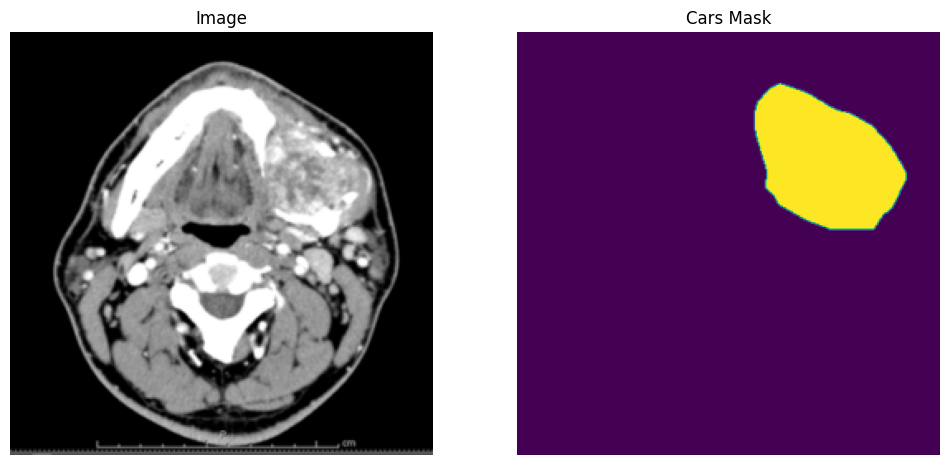

torch.Size([3, 256, 256])

In [7]:
image, mask = train_set[5] # get some sample
visualize(
    image=image, 
    cars_mask=mask,
)
image.shape

In [7]:
os.environ['CUDA_VISIBLE_DEVICES'] = "7"

import time

optimizer = torch.optim.Adam([dict(params=model.parameters(), lr=0.00025),])
num_epochs = 200

max_score = 0

train_loss_history = []
val_loss_history = []
train_dicecoeff_history = []
val_dicecoeff_history = []
train_iou_history = []
val_iou_history = []

for epoch in range(num_epochs):
    
    t0 = time.time()
    
    model.train()
    
    running_loss = 0.0
    running_dice_coefficient = 0.0
    running_iou = 0.0
    
    loop = tqdm(train_loader)
    
    # train model epoch = i
    for inputs, targets in loop:
        
        # define all data in gpu
        inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
        
        # forward
        outputs = model(inputs)
        
        loss = smp.utils.losses.DiceLoss()(outputs, targets)
        dice_coeff = DiceCoefficient()(outputs, targets)
        iou = smp.utils.metrics.IoU(threshold=0.5)(outputs, targets)
        
        # backward
        optimizer.zero_grad()
        loss.backward()
        
        # gradient or adam step
        optimizer.step()
        
        # progress bar
        loop.set_description(f'Epoch [{epoch}/{num_epochs}]')
        loop.set_postfix(loss=loss.item(),dice_coeff=dice_coeff.item(),iou=iou.item())
        
        # sum result
        running_loss += loss.item()
        running_dice_coefficient += dice_coeff.item()
        running_iou += iou.item()
    
    # average loss and metrics all index of trainset
    train_loss = running_loss / len(train_loader)
    train_dice_coefficient = running_dice_coefficient / len(train_loader)
    train_iou = running_iou / len(train_loader)
    
    # validate model epochs = i
    val_loss,val_dice_coefficient,val_iou = validate(model, valid_loader, DEVICE)
    
    # append result
    train_loss_history.append(train_loss)
    val_loss_history.append(val_loss)
    train_dicecoeff_history.append(train_dice_coefficient)
    val_dicecoeff_history.append(val_dice_coefficient)
    train_iou_history.append(train_iou)
    val_iou_history.append(val_iou)
    
    # do something (save model, change lr, etc.)
    if  max_score < val_iou_history[epoch] :
        max_score = val_iou_history[epoch]
        torch.save(model, './resnet50.pth')
        print('Model saved!')
        
    if epoch == 100:
        optimizer.param_groups[0]['lr'] = 0.00001
        print('Decrease decoder learning rate to 0.0001')

        
    print(f"Epoch {epoch + 1}/{num_epochs}\nTrain Loss: {train_loss:.4f},Train dice_coeff: {train_dice_coefficient:.4f} ,Train iou: {train_iou:.4f},\nValidation Loss: {val_loss:.4f} ,Validation dice_coeff:{val_dice_coefficient:.4f},Validation iou:{val_iou:.4f}\nepoch time: {time.time()-t0:.4f}")
    print("---"*30)
    

val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Model saved!
Epoch 1/200
Train Loss: 0.7262,Train dice_coeff: 0.2111 ,Train iou: 0.3871,
Validation Loss: 0.6207 ,Validation dice_coeff:0.2715,Validation iou:0.4344
epoch time: 45.4681
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Model saved!
Epoch 2/200
Train Loss: 0.4333,Train dice_coeff: 0.3750 ,Train iou: 0.6174,
Validation Loss: 0.3930 ,Validation dice_coeff:0.4052,Validation iou:0.5373
epoch time: 44.3195
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Model saved!
Epoch 3/200
Train Loss: 0.2704,Train dice_coeff: 0.4607 ,Train iou: 0.6840,
Validation Loss: 0.2410 ,Validation dice_coeff:0.4779,Validation iou:0.6884
epoch time: 44.9040
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 4/200
Train Loss: 0.1910,Train dice_coeff: 0.5126 ,Train iou: 0.7422,
Validation Loss: 0.2340 ,Validation dice_coeff:0.4728,Validation iou:0.6631
epoch time: 44.2738
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Model saved!
Epoch 5/200
Train Loss: 0.1547,Train dice_coeff: 0.5378 ,Train iou: 0.7715,
Validation Loss: 0.1937 ,Validation dice_coeff:0.4958,Validation iou:0.7086
epoch time: 45.7323
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Model saved!
Epoch 6/200
Train Loss: 0.1346,Train dice_coeff: 0.5519 ,Train iou: 0.7904,
Validation Loss: 0.1828 ,Validation dice_coeff:0.5238,Validation iou:0.7102
epoch time: 45.1577
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.99it/s]


Model saved!
Epoch 7/200
Train Loss: 0.1246,Train dice_coeff: 0.5604 ,Train iou: 0.7992,
Validation Loss: 0.1776 ,Validation dice_coeff:0.5137,Validation iou:0.7139
epoch time: 44.4638
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 8/200
Train Loss: 0.1212,Train dice_coeff: 0.5636 ,Train iou: 0.7997,
Validation Loss: 0.1913 ,Validation dice_coeff:0.4930,Validation iou:0.6922
epoch time: 44.5064
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Model saved!
Epoch 9/200
Train Loss: 0.1116,Train dice_coeff: 0.5721 ,Train iou: 0.8119,
Validation Loss: 0.1567 ,Validation dice_coeff:0.5288,Validation iou:0.7393
epoch time: 44.0051
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Model saved!
Epoch 10/200
Train Loss: 0.1014,Train dice_coeff: 0.5787 ,Train iou: 0.8265,
Validation Loss: 0.1394 ,Validation dice_coeff:0.5605,Validation iou:0.7634
epoch time: 45.0713
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Model saved!
Epoch 11/200
Train Loss: 0.0898,Train dice_coeff: 0.5862 ,Train iou: 0.8443,
Validation Loss: 0.1329 ,Validation dice_coeff:0.5584,Validation iou:0.7725
epoch time: 45.1487
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.99it/s]


Epoch 12/200
Train Loss: 0.0832,Train dice_coeff: 0.5925 ,Train iou: 0.8546,
Validation Loss: 0.1619 ,Validation dice_coeff:0.5314,Validation iou:0.7275
epoch time: 44.1568
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 13/200
Train Loss: 0.0839,Train dice_coeff: 0.5938 ,Train iou: 0.8519,
Validation Loss: 0.1351 ,Validation dice_coeff:0.5584,Validation iou:0.7677
epoch time: 44.7311
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.81it/s]


Epoch 14/200
Train Loss: 0.0784,Train dice_coeff: 0.5974 ,Train iou: 0.8606,
Validation Loss: 0.1485 ,Validation dice_coeff:0.5513,Validation iou:0.7462
epoch time: 45.2779
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.82it/s]


Epoch 15/200
Train Loss: 0.0738,Train dice_coeff: 0.6017 ,Train iou: 0.8679,
Validation Loss: 0.1333 ,Validation dice_coeff:0.5476,Validation iou:0.7697
epoch time: 45.2628
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 16/200
Train Loss: 0.0685,Train dice_coeff: 0.6051 ,Train iou: 0.8767,
Validation Loss: 0.1471 ,Validation dice_coeff:0.5449,Validation iou:0.7480
epoch time: 44.9948
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.99it/s]


Epoch 17/200
Train Loss: 0.0679,Train dice_coeff: 0.6058 ,Train iou: 0.8772,
Validation Loss: 0.1509 ,Validation dice_coeff:0.5512,Validation iou:0.7414
epoch time: 44.6008
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 18/200
Train Loss: 0.0656,Train dice_coeff: 0.6110 ,Train iou: 0.8808,
Validation Loss: 0.1363 ,Validation dice_coeff:0.5518,Validation iou:0.7633
epoch time: 44.3970
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 19/200
Train Loss: 0.0612,Train dice_coeff: 0.6140 ,Train iou: 0.8883,
Validation Loss: 0.1348 ,Validation dice_coeff:0.5528,Validation iou:0.7655
epoch time: 44.7295
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.05it/s]


Epoch 20/200
Train Loss: 0.0585,Train dice_coeff: 0.6164 ,Train iou: 0.8928,
Validation Loss: 0.1340 ,Validation dice_coeff:0.5484,Validation iou:0.7666
epoch time: 42.0923
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 21/200
Train Loss: 0.0588,Train dice_coeff: 0.6155 ,Train iou: 0.8920,
Validation Loss: 0.1418 ,Validation dice_coeff:0.5477,Validation iou:0.7540
epoch time: 43.2601
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.15it/s]


Epoch 22/200
Train Loss: 0.0570,Train dice_coeff: 0.6159 ,Train iou: 0.8949,
Validation Loss: 0.1397 ,Validation dice_coeff:0.5418,Validation iou:0.7572
epoch time: 43.6386
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.99it/s]


Epoch 23/200
Train Loss: 0.0542,Train dice_coeff: 0.6208 ,Train iou: 0.8998,
Validation Loss: 0.1384 ,Validation dice_coeff:0.5394,Validation iou:0.7586
epoch time: 43.9392
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.05it/s]


Epoch 24/200
Train Loss: 0.0522,Train dice_coeff: 0.6226 ,Train iou: 0.9034,
Validation Loss: 0.1410 ,Validation dice_coeff:0.5433,Validation iou:0.7546
epoch time: 43.5486
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 25/200
Train Loss: 0.0604,Train dice_coeff: 0.6138 ,Train iou: 0.8885,
Validation Loss: 0.1675 ,Validation dice_coeff:0.5107,Validation iou:0.7153
epoch time: 43.5119
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 26/200
Train Loss: 0.0580,Train dice_coeff: 0.6122 ,Train iou: 0.8925,
Validation Loss: 0.1641 ,Validation dice_coeff:0.5278,Validation iou:0.7197
epoch time: 43.8892
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.01it/s]


Epoch 27/200
Train Loss: 0.0566,Train dice_coeff: 0.6177 ,Train iou: 0.8949,
Validation Loss: 0.1324 ,Validation dice_coeff:0.5625,Validation iou:0.7677
epoch time: 44.2341
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 28/200
Train Loss: 0.0489,Train dice_coeff: 0.6233 ,Train iou: 0.9086,
Validation Loss: 0.1303 ,Validation dice_coeff:0.5542,Validation iou:0.7713
epoch time: 44.4104
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.03it/s]


Epoch 29/200
Train Loss: 0.0437,Train dice_coeff: 0.6255 ,Train iou: 0.9180,
Validation Loss: 0.1312 ,Validation dice_coeff:0.5616,Validation iou:0.7702
epoch time: 43.5756
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.02it/s]


Epoch 30/200
Train Loss: 0.0407,Train dice_coeff: 0.6306 ,Train iou: 0.9236,
Validation Loss: 0.1298 ,Validation dice_coeff:0.5567,Validation iou:0.7717
epoch time: 44.0019
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.85it/s]


Epoch 31/200
Train Loss: 0.0412,Train dice_coeff: 0.6303 ,Train iou: 0.9225,
Validation Loss: 0.1335 ,Validation dice_coeff:0.5506,Validation iou:0.7655
epoch time: 43.9456
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 32/200
Train Loss: 0.0403,Train dice_coeff: 0.6296 ,Train iou: 0.9240,
Validation Loss: 0.1362 ,Validation dice_coeff:0.5580,Validation iou:0.7618
epoch time: 44.0098
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.98it/s]


Epoch 33/200
Train Loss: 0.0388,Train dice_coeff: 0.6321 ,Train iou: 0.9268,
Validation Loss: 0.1363 ,Validation dice_coeff:0.5571,Validation iou:0.7613
epoch time: 44.1308
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 34/200
Train Loss: 0.0365,Train dice_coeff: 0.6309 ,Train iou: 0.9311,
Validation Loss: 0.1335 ,Validation dice_coeff:0.5597,Validation iou:0.7660
epoch time: 43.9786
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 35/200
Train Loss: 0.0361,Train dice_coeff: 0.6300 ,Train iou: 0.9317,
Validation Loss: 0.1369 ,Validation dice_coeff:0.5550,Validation iou:0.7602
epoch time: 44.5473
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.04it/s]


Epoch 36/200
Train Loss: 0.0356,Train dice_coeff: 0.6345 ,Train iou: 0.9325,
Validation Loss: 0.1363 ,Validation dice_coeff:0.5645,Validation iou:0.7612
epoch time: 44.2584
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 37/200
Train Loss: 0.0344,Train dice_coeff: 0.6338 ,Train iou: 0.9347,
Validation Loss: 0.1342 ,Validation dice_coeff:0.5507,Validation iou:0.7643
epoch time: 44.0703
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 38/200
Train Loss: 0.0355,Train dice_coeff: 0.6333 ,Train iou: 0.9327,
Validation Loss: 0.1344 ,Validation dice_coeff:0.5556,Validation iou:0.7640
epoch time: 44.5724
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 39/200
Train Loss: 0.0338,Train dice_coeff: 0.6333 ,Train iou: 0.9357,
Validation Loss: 0.1320 ,Validation dice_coeff:0.5648,Validation iou:0.7678
epoch time: 43.9201
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 40/200
Train Loss: 0.0324,Train dice_coeff: 0.6359 ,Train iou: 0.9384,
Validation Loss: 0.1338 ,Validation dice_coeff:0.5643,Validation iou:0.7647
epoch time: 44.7302
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 41/200
Train Loss: 0.0318,Train dice_coeff: 0.6363 ,Train iou: 0.9394,
Validation Loss: 0.1466 ,Validation dice_coeff:0.5435,Validation iou:0.7452
epoch time: 44.7369
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 42/200
Train Loss: 0.0323,Train dice_coeff: 0.6346 ,Train iou: 0.9385,
Validation Loss: 0.1354 ,Validation dice_coeff:0.5561,Validation iou:0.7623
epoch time: 44.1856
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 43/200
Train Loss: 0.0310,Train dice_coeff: 0.6393 ,Train iou: 0.9408,
Validation Loss: 0.1401 ,Validation dice_coeff:0.5627,Validation iou:0.7555
epoch time: 44.3014
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 44/200
Train Loss: 0.0301,Train dice_coeff: 0.6347 ,Train iou: 0.9426,
Validation Loss: 0.1436 ,Validation dice_coeff:0.5414,Validation iou:0.7498
epoch time: 44.5959
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 45/200
Train Loss: 0.0300,Train dice_coeff: 0.6377 ,Train iou: 0.9428,
Validation Loss: 0.1359 ,Validation dice_coeff:0.5524,Validation iou:0.7619
epoch time: 44.5974
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 46/200
Train Loss: 0.0285,Train dice_coeff: 0.6399 ,Train iou: 0.9454,
Validation Loss: 0.1394 ,Validation dice_coeff:0.5404,Validation iou:0.7561
epoch time: 44.5602
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 47/200
Train Loss: 0.0279,Train dice_coeff: 0.6402 ,Train iou: 0.9465,
Validation Loss: 0.1377 ,Validation dice_coeff:0.5429,Validation iou:0.7586
epoch time: 44.1927
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 48/200
Train Loss: 0.0276,Train dice_coeff: 0.6405 ,Train iou: 0.9471,
Validation Loss: 0.1387 ,Validation dice_coeff:0.5459,Validation iou:0.7574
epoch time: 43.3063
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 49/200
Train Loss: 0.0279,Train dice_coeff: 0.6363 ,Train iou: 0.9465,
Validation Loss: 0.1428 ,Validation dice_coeff:0.5395,Validation iou:0.7511
epoch time: 44.6069
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 50/200
Train Loss: 0.0270,Train dice_coeff: 0.6411 ,Train iou: 0.9482,
Validation Loss: 0.1343 ,Validation dice_coeff:0.5582,Validation iou:0.7639
epoch time: 43.1739
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 51/200
Train Loss: 0.0268,Train dice_coeff: 0.6372 ,Train iou: 0.9486,
Validation Loss: 0.1462 ,Validation dice_coeff:0.5456,Validation iou:0.7468
epoch time: 44.1040
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 52/200
Train Loss: 0.0263,Train dice_coeff: 0.6375 ,Train iou: 0.9496,
Validation Loss: 0.1357 ,Validation dice_coeff:0.5422,Validation iou:0.7620
epoch time: 44.7543
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 53/200
Train Loss: 0.0320,Train dice_coeff: 0.6344 ,Train iou: 0.9390,
Validation Loss: 0.1378 ,Validation dice_coeff:0.5618,Validation iou:0.7589
epoch time: 44.5957
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 54/200
Train Loss: 0.0299,Train dice_coeff: 0.6362 ,Train iou: 0.9427,
Validation Loss: 0.1499 ,Validation dice_coeff:0.5419,Validation iou:0.7410
epoch time: 44.4552
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 55/200
Train Loss: 0.0279,Train dice_coeff: 0.6363 ,Train iou: 0.9464,
Validation Loss: 0.1336 ,Validation dice_coeff:0.5442,Validation iou:0.7651
epoch time: 44.8138
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.18it/s]


Epoch 56/200
Train Loss: 0.0275,Train dice_coeff: 0.6357 ,Train iou: 0.9472,
Validation Loss: 0.1451 ,Validation dice_coeff:0.5432,Validation iou:0.7477
epoch time: 43.1865
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 57/200
Train Loss: 0.0267,Train dice_coeff: 0.6373 ,Train iou: 0.9487,
Validation Loss: 0.1408 ,Validation dice_coeff:0.5452,Validation iou:0.7539
epoch time: 44.6466
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.14it/s]


Epoch 58/200
Train Loss: 0.0262,Train dice_coeff: 0.6389 ,Train iou: 0.9495,
Validation Loss: 0.1424 ,Validation dice_coeff:0.5460,Validation iou:0.7514
epoch time: 44.0193
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 59/200
Train Loss: 0.0245,Train dice_coeff: 0.6386 ,Train iou: 0.9527,
Validation Loss: 0.1360 ,Validation dice_coeff:0.5471,Validation iou:0.7617
epoch time: 41.9979
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 60/200
Train Loss: 0.0248,Train dice_coeff: 0.6397 ,Train iou: 0.9522,
Validation Loss: 0.1404 ,Validation dice_coeff:0.5469,Validation iou:0.7542
epoch time: 44.2630
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 61/200
Train Loss: 0.0248,Train dice_coeff: 0.6414 ,Train iou: 0.9522,
Validation Loss: 0.1404 ,Validation dice_coeff:0.5349,Validation iou:0.7544
epoch time: 44.5501
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 62/200
Train Loss: 0.0238,Train dice_coeff: 0.6420 ,Train iou: 0.9541,
Validation Loss: 0.1353 ,Validation dice_coeff:0.5476,Validation iou:0.7622
epoch time: 44.1433
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.85it/s]


Epoch 63/200
Train Loss: 0.0236,Train dice_coeff: 0.6410 ,Train iou: 0.9546,
Validation Loss: 0.1379 ,Validation dice_coeff:0.5512,Validation iou:0.7585
epoch time: 44.5550
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 64/200
Train Loss: 0.0240,Train dice_coeff: 0.6408 ,Train iou: 0.9537,
Validation Loss: 0.1437 ,Validation dice_coeff:0.5347,Validation iou:0.7495
epoch time: 43.1549
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 65/200
Train Loss: 0.0238,Train dice_coeff: 0.6434 ,Train iou: 0.9541,
Validation Loss: 0.2373 ,Validation dice_coeff:0.5267,Validation iou:0.6195
epoch time: 44.5522
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 66/200
Train Loss: 0.0622,Train dice_coeff: 0.6098 ,Train iou: 0.8861,
Validation Loss: 0.5392 ,Validation dice_coeff:0.2617,Validation iou:0.3017
epoch time: 44.5583
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 67/200
Train Loss: 0.1297,Train dice_coeff: 0.5531 ,Train iou: 0.7720,
Validation Loss: 0.1525 ,Validation dice_coeff:0.5343,Validation iou:0.7363
epoch time: 42.6577
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.19it/s]


Epoch 68/200
Train Loss: 0.0733,Train dice_coeff: 0.5997 ,Train iou: 0.8640,
Validation Loss: 0.1982 ,Validation dice_coeff:0.4736,Validation iou:0.6702
epoch time: 41.3913
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.16it/s]


Epoch 69/200
Train Loss: 0.0578,Train dice_coeff: 0.6118 ,Train iou: 0.8914,
Validation Loss: 0.1433 ,Validation dice_coeff:0.5383,Validation iou:0.7502
epoch time: 43.3119
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 70/200
Train Loss: 0.0460,Train dice_coeff: 0.6283 ,Train iou: 0.9126,
Validation Loss: 0.1408 ,Validation dice_coeff:0.5353,Validation iou:0.7538
epoch time: 44.3552
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 71/200
Train Loss: 0.0347,Train dice_coeff: 0.6366 ,Train iou: 0.9334,
Validation Loss: 0.1398 ,Validation dice_coeff:0.5439,Validation iou:0.7552
epoch time: 44.4377
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 72/200
Train Loss: 0.0287,Train dice_coeff: 0.6375 ,Train iou: 0.9448,
Validation Loss: 0.1421 ,Validation dice_coeff:0.5498,Validation iou:0.7520
epoch time: 44.5203
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 73/200
Train Loss: 0.0267,Train dice_coeff: 0.6390 ,Train iou: 0.9485,
Validation Loss: 0.1362 ,Validation dice_coeff:0.5486,Validation iou:0.7611
epoch time: 42.8692
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 74/200
Train Loss: 0.0240,Train dice_coeff: 0.6435 ,Train iou: 0.9536,
Validation Loss: 0.1387 ,Validation dice_coeff:0.5364,Validation iou:0.7574
epoch time: 43.9283
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 75/200
Train Loss: 0.0224,Train dice_coeff: 0.6449 ,Train iou: 0.9567,
Validation Loss: 0.1411 ,Validation dice_coeff:0.5363,Validation iou:0.7532
epoch time: 44.0610
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.10it/s]


Epoch 76/200
Train Loss: 0.0217,Train dice_coeff: 0.6431 ,Train iou: 0.9579,
Validation Loss: 0.1431 ,Validation dice_coeff:0.5502,Validation iou:0.7504
epoch time: 42.8730
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.08it/s]


Epoch 77/200
Train Loss: 0.0210,Train dice_coeff: 0.6423 ,Train iou: 0.9592,
Validation Loss: 0.1385 ,Validation dice_coeff:0.5350,Validation iou:0.7573
epoch time: 43.5916
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 78/200
Train Loss: 0.0218,Train dice_coeff: 0.6446 ,Train iou: 0.9580,
Validation Loss: 0.1404 ,Validation dice_coeff:0.5534,Validation iou:0.7546
epoch time: 44.3400
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.15it/s]


Epoch 79/200
Train Loss: 0.0204,Train dice_coeff: 0.6456 ,Train iou: 0.9604,
Validation Loss: 0.1385 ,Validation dice_coeff:0.5431,Validation iou:0.7574
epoch time: 43.0814
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 80/200
Train Loss: 0.0202,Train dice_coeff: 0.6447 ,Train iou: 0.9609,
Validation Loss: 0.1434 ,Validation dice_coeff:0.5448,Validation iou:0.7495
epoch time: 44.3413
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.20it/s]


Epoch 81/200
Train Loss: 0.0197,Train dice_coeff: 0.6490 ,Train iou: 0.9618,
Validation Loss: 0.1427 ,Validation dice_coeff:0.5436,Validation iou:0.7508
epoch time: 43.8265
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 82/200
Train Loss: 0.0197,Train dice_coeff: 0.6490 ,Train iou: 0.9617,
Validation Loss: 0.1434 ,Validation dice_coeff:0.5433,Validation iou:0.7499
epoch time: 43.3469
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.19it/s]


Epoch 83/200
Train Loss: 0.0197,Train dice_coeff: 0.6450 ,Train iou: 0.9618,
Validation Loss: 0.1397 ,Validation dice_coeff:0.5565,Validation iou:0.7557
epoch time: 42.3562
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 84/200
Train Loss: 0.0197,Train dice_coeff: 0.6451 ,Train iou: 0.9616,
Validation Loss: 0.1394 ,Validation dice_coeff:0.5451,Validation iou:0.7556
epoch time: 43.8673
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.01it/s]


Epoch 85/200
Train Loss: 0.0197,Train dice_coeff: 0.6464 ,Train iou: 0.9618,
Validation Loss: 0.1394 ,Validation dice_coeff:0.5563,Validation iou:0.7557
epoch time: 43.6326
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 86/200
Train Loss: 0.0193,Train dice_coeff: 0.6439 ,Train iou: 0.9625,
Validation Loss: 0.1431 ,Validation dice_coeff:0.5479,Validation iou:0.7500
epoch time: 44.0952
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 87/200
Train Loss: 0.0193,Train dice_coeff: 0.6495 ,Train iou: 0.9625,
Validation Loss: 0.1437 ,Validation dice_coeff:0.5488,Validation iou:0.7494
epoch time: 44.4267
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]


Epoch 88/200
Train Loss: 0.0196,Train dice_coeff: 0.6452 ,Train iou: 0.9619,
Validation Loss: 0.1434 ,Validation dice_coeff:0.5481,Validation iou:0.7495
epoch time: 44.3843
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 89/200
Train Loss: 0.0201,Train dice_coeff: 0.6464 ,Train iou: 0.9611,
Validation Loss: 0.1381 ,Validation dice_coeff:0.5464,Validation iou:0.7583
epoch time: 43.7811
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 90/200
Train Loss: 0.0192,Train dice_coeff: 0.6454 ,Train iou: 0.9626,
Validation Loss: 0.1439 ,Validation dice_coeff:0.5525,Validation iou:0.7492
epoch time: 44.1695
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 91/200
Train Loss: 0.0194,Train dice_coeff: 0.6480 ,Train iou: 0.9623,
Validation Loss: 0.1392 ,Validation dice_coeff:0.5468,Validation iou:0.7563
epoch time: 44.1205
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.07it/s]


Epoch 92/200
Train Loss: 0.0189,Train dice_coeff: 0.6455 ,Train iou: 0.9631,
Validation Loss: 0.1405 ,Validation dice_coeff:0.5493,Validation iou:0.7542
epoch time: 43.1394
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.09it/s]


Epoch 93/200
Train Loss: 0.0193,Train dice_coeff: 0.6481 ,Train iou: 0.9625,
Validation Loss: 0.1428 ,Validation dice_coeff:0.5528,Validation iou:0.7507
epoch time: 44.1935
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 94/200
Train Loss: 0.0189,Train dice_coeff: 0.6469 ,Train iou: 0.9632,
Validation Loss: 0.1420 ,Validation dice_coeff:0.5410,Validation iou:0.7516
epoch time: 43.8281
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 95/200
Train Loss: 0.0192,Train dice_coeff: 0.6456 ,Train iou: 0.9627,
Validation Loss: 0.1414 ,Validation dice_coeff:0.5474,Validation iou:0.7525
epoch time: 43.5149
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.87it/s]


Epoch 96/200
Train Loss: 0.0191,Train dice_coeff: 0.6465 ,Train iou: 0.9628,
Validation Loss: 0.1408 ,Validation dice_coeff:0.5500,Validation iou:0.7535
epoch time: 44.4608
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 97/200
Train Loss: 0.0192,Train dice_coeff: 0.6428 ,Train iou: 0.9627,
Validation Loss: 0.1513 ,Validation dice_coeff:0.5335,Validation iou:0.7386
epoch time: 44.4585
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 98/200
Train Loss: 0.0201,Train dice_coeff: 0.6429 ,Train iou: 0.9610,
Validation Loss: 0.1457 ,Validation dice_coeff:0.5383,Validation iou:0.7463
epoch time: 44.3889
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 99/200
Train Loss: 0.0188,Train dice_coeff: 0.6469 ,Train iou: 0.9633,
Validation Loss: 0.1441 ,Validation dice_coeff:0.5431,Validation iou:0.7484
epoch time: 43.1161
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 100/200
Train Loss: 0.0199,Train dice_coeff: 0.6463 ,Train iou: 0.9613,
Validation Loss: 0.1430 ,Validation dice_coeff:0.5566,Validation iou:0.7503
epoch time: 44.1171
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Decrease decoder learning rate to 0.0001
Epoch 101/200
Train Loss: 0.0197,Train dice_coeff: 0.6450 ,Train iou: 0.9616,
Validation Loss: 0.1403 ,Validation dice_coeff:0.5412,Validation iou:0.7550
epoch time: 44.1189
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 102/200
Train Loss: 0.0193,Train dice_coeff: 0.6457 ,Train iou: 0.9625,
Validation Loss: 0.1414 ,Validation dice_coeff:0.5457,Validation iou:0.7527
epoch time: 44.1829
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 103/200
Train Loss: 0.0181,Train dice_coeff: 0.6504 ,Train iou: 0.9647,
Validation Loss: 0.1420 ,Validation dice_coeff:0.5415,Validation iou:0.7518
epoch time: 44.6447
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 104/200
Train Loss: 0.0177,Train dice_coeff: 0.6493 ,Train iou: 0.9654,
Validation Loss: 0.1403 ,Validation dice_coeff:0.5374,Validation iou:0.7542
epoch time: 44.6939
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 105/200
Train Loss: 0.0175,Train dice_coeff: 0.6468 ,Train iou: 0.9659,
Validation Loss: 0.1399 ,Validation dice_coeff:0.5459,Validation iou:0.7550
epoch time: 43.2471
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 106/200
Train Loss: 0.0172,Train dice_coeff: 0.6484 ,Train iou: 0.9665,
Validation Loss: 0.1379 ,Validation dice_coeff:0.5519,Validation iou:0.7582
epoch time: 43.9960
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 107/200
Train Loss: 0.0171,Train dice_coeff: 0.6471 ,Train iou: 0.9666,
Validation Loss: 0.1416 ,Validation dice_coeff:0.5426,Validation iou:0.7527
epoch time: 44.2361
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 108/200
Train Loss: 0.0167,Train dice_coeff: 0.6459 ,Train iou: 0.9673,
Validation Loss: 0.1422 ,Validation dice_coeff:0.5388,Validation iou:0.7516
epoch time: 44.4304
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]


Epoch 109/200
Train Loss: 0.0167,Train dice_coeff: 0.6488 ,Train iou: 0.9674,
Validation Loss: 0.1414 ,Validation dice_coeff:0.5477,Validation iou:0.7532
epoch time: 44.1929
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.02it/s]


Epoch 110/200
Train Loss: 0.0164,Train dice_coeff: 0.6475 ,Train iou: 0.9681,
Validation Loss: 0.1408 ,Validation dice_coeff:0.5434,Validation iou:0.7536
epoch time: 44.0407
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 111/200
Train Loss: 0.0161,Train dice_coeff: 0.6490 ,Train iou: 0.9686,
Validation Loss: 0.1385 ,Validation dice_coeff:0.5482,Validation iou:0.7572
epoch time: 44.7019
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  3.00it/s]


Epoch 112/200
Train Loss: 0.0163,Train dice_coeff: 0.6490 ,Train iou: 0.9683,
Validation Loss: 0.1407 ,Validation dice_coeff:0.5466,Validation iou:0.7537
epoch time: 44.4510
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 113/200
Train Loss: 0.0165,Train dice_coeff: 0.6450 ,Train iou: 0.9679,
Validation Loss: 0.1443 ,Validation dice_coeff:0.5497,Validation iou:0.7485
epoch time: 43.7787
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 114/200
Train Loss: 0.0163,Train dice_coeff: 0.6450 ,Train iou: 0.9682,
Validation Loss: 0.1386 ,Validation dice_coeff:0.5397,Validation iou:0.7570
epoch time: 43.8196
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 115/200
Train Loss: 0.0158,Train dice_coeff: 0.6479 ,Train iou: 0.9692,
Validation Loss: 0.1405 ,Validation dice_coeff:0.5551,Validation iou:0.7543
epoch time: 44.2859
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.22it/s]


Epoch 116/200
Train Loss: 0.0162,Train dice_coeff: 0.6479 ,Train iou: 0.9684,
Validation Loss: 0.1433 ,Validation dice_coeff:0.5423,Validation iou:0.7498
epoch time: 43.6083
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 117/200
Train Loss: 0.0159,Train dice_coeff: 0.6479 ,Train iou: 0.9691,
Validation Loss: 0.1383 ,Validation dice_coeff:0.5435,Validation iou:0.7575
epoch time: 42.6584
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 118/200
Train Loss: 0.0156,Train dice_coeff: 0.6480 ,Train iou: 0.9696,
Validation Loss: 0.1385 ,Validation dice_coeff:0.5487,Validation iou:0.7572
epoch time: 44.4208
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 119/200
Train Loss: 0.0159,Train dice_coeff: 0.6508 ,Train iou: 0.9691,
Validation Loss: 0.1434 ,Validation dice_coeff:0.5458,Validation iou:0.7500
epoch time: 42.3006
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.09it/s]


Epoch 120/200
Train Loss: 0.0159,Train dice_coeff: 0.6522 ,Train iou: 0.9690,
Validation Loss: 0.1397 ,Validation dice_coeff:0.5526,Validation iou:0.7558
epoch time: 42.6319
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.86it/s]


Epoch 121/200
Train Loss: 0.0156,Train dice_coeff: 0.6468 ,Train iou: 0.9695,
Validation Loss: 0.1428 ,Validation dice_coeff:0.5373,Validation iou:0.7504
epoch time: 44.2719
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 122/200
Train Loss: 0.0156,Train dice_coeff: 0.6509 ,Train iou: 0.9696,
Validation Loss: 0.1416 ,Validation dice_coeff:0.5469,Validation iou:0.7526
epoch time: 44.8162
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 123/200
Train Loss: 0.0155,Train dice_coeff: 0.6482 ,Train iou: 0.9697,
Validation Loss: 0.1393 ,Validation dice_coeff:0.5517,Validation iou:0.7562
epoch time: 43.8554
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 124/200
Train Loss: 0.0157,Train dice_coeff: 0.6468 ,Train iou: 0.9694,
Validation Loss: 0.1469 ,Validation dice_coeff:0.5419,Validation iou:0.7449
epoch time: 44.2095
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.84it/s]


Epoch 125/200
Train Loss: 0.0155,Train dice_coeff: 0.6482 ,Train iou: 0.9697,
Validation Loss: 0.1388 ,Validation dice_coeff:0.5399,Validation iou:0.7566
epoch time: 43.2291
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 126/200
Train Loss: 0.0156,Train dice_coeff: 0.6496 ,Train iou: 0.9695,
Validation Loss: 0.1411 ,Validation dice_coeff:0.5511,Validation iou:0.7532
epoch time: 43.9764
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.22it/s]


Epoch 127/200
Train Loss: 0.0157,Train dice_coeff: 0.6510 ,Train iou: 0.9695,
Validation Loss: 0.1485 ,Validation dice_coeff:0.5263,Validation iou:0.7430
epoch time: 42.9207
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.17it/s]


Epoch 128/200
Train Loss: 0.0154,Train dice_coeff: 0.6456 ,Train iou: 0.9700,
Validation Loss: 0.1403 ,Validation dice_coeff:0.5419,Validation iou:0.7546
epoch time: 41.3427
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 129/200
Train Loss: 0.0156,Train dice_coeff: 0.6469 ,Train iou: 0.9696,
Validation Loss: 0.1396 ,Validation dice_coeff:0.5526,Validation iou:0.7554
epoch time: 44.1032
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  3.00it/s]


Epoch 130/200
Train Loss: 0.0154,Train dice_coeff: 0.6484 ,Train iou: 0.9700,
Validation Loss: 0.1388 ,Validation dice_coeff:0.5452,Validation iou:0.7566
epoch time: 44.0158
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 131/200
Train Loss: 0.0155,Train dice_coeff: 0.6511 ,Train iou: 0.9699,
Validation Loss: 0.1414 ,Validation dice_coeff:0.5469,Validation iou:0.7527
epoch time: 44.1259
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 132/200
Train Loss: 0.0154,Train dice_coeff: 0.6525 ,Train iou: 0.9700,
Validation Loss: 0.1419 ,Validation dice_coeff:0.5481,Validation iou:0.7520
epoch time: 44.1618
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.98it/s]


Epoch 133/200
Train Loss: 0.0154,Train dice_coeff: 0.6470 ,Train iou: 0.9700,
Validation Loss: 0.1399 ,Validation dice_coeff:0.5477,Validation iou:0.7552
epoch time: 44.3777
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.03it/s]


Epoch 134/200
Train Loss: 0.0153,Train dice_coeff: 0.6484 ,Train iou: 0.9703,
Validation Loss: 0.1420 ,Validation dice_coeff:0.5434,Validation iou:0.7521
epoch time: 43.8320
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 135/200
Train Loss: 0.0151,Train dice_coeff: 0.6512 ,Train iou: 0.9705,
Validation Loss: 0.1413 ,Validation dice_coeff:0.5485,Validation iou:0.7528
epoch time: 43.2008
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 136/200
Train Loss: 0.0152,Train dice_coeff: 0.6526 ,Train iou: 0.9705,
Validation Loss: 0.1393 ,Validation dice_coeff:0.5489,Validation iou:0.7564
epoch time: 43.8987
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 137/200
Train Loss: 0.0152,Train dice_coeff: 0.6485 ,Train iou: 0.9704,
Validation Loss: 0.1388 ,Validation dice_coeff:0.5355,Validation iou:0.7566
epoch time: 43.5982
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 138/200
Train Loss: 0.0151,Train dice_coeff: 0.6526 ,Train iou: 0.9705,
Validation Loss: 0.1404 ,Validation dice_coeff:0.5517,Validation iou:0.7545
epoch time: 44.5227
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 139/200
Train Loss: 0.0153,Train dice_coeff: 0.6471 ,Train iou: 0.9701,
Validation Loss: 0.1409 ,Validation dice_coeff:0.5480,Validation iou:0.7536
epoch time: 44.4202
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 140/200
Train Loss: 0.0153,Train dice_coeff: 0.6485 ,Train iou: 0.9702,
Validation Loss: 0.1396 ,Validation dice_coeff:0.5351,Validation iou:0.7558
epoch time: 44.4202
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 141/200
Train Loss: 0.0155,Train dice_coeff: 0.6471 ,Train iou: 0.9698,
Validation Loss: 0.1385 ,Validation dice_coeff:0.5489,Validation iou:0.7575
epoch time: 44.1848
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 142/200
Train Loss: 0.0150,Train dice_coeff: 0.6499 ,Train iou: 0.9707,
Validation Loss: 0.1392 ,Validation dice_coeff:0.5390,Validation iou:0.7561
epoch time: 44.2554
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 143/200
Train Loss: 0.0153,Train dice_coeff: 0.6485 ,Train iou: 0.9703,
Validation Loss: 0.1381 ,Validation dice_coeff:0.5411,Validation iou:0.7581
epoch time: 44.2031
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 144/200
Train Loss: 0.0151,Train dice_coeff: 0.6513 ,Train iou: 0.9706,
Validation Loss: 0.1410 ,Validation dice_coeff:0.5568,Validation iou:0.7539
epoch time: 44.5732
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]


Epoch 145/200
Train Loss: 0.0153,Train dice_coeff: 0.6472 ,Train iou: 0.9702,
Validation Loss: 0.1417 ,Validation dice_coeff:0.5478,Validation iou:0.7524
epoch time: 44.1632
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 146/200
Train Loss: 0.0151,Train dice_coeff: 0.6500 ,Train iou: 0.9706,
Validation Loss: 0.1376 ,Validation dice_coeff:0.5661,Validation iou:0.7587
epoch time: 44.2552
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 147/200
Train Loss: 0.0150,Train dice_coeff: 0.6485 ,Train iou: 0.9708,
Validation Loss: 0.1414 ,Validation dice_coeff:0.5523,Validation iou:0.7525
epoch time: 43.8594
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 148/200
Train Loss: 0.0150,Train dice_coeff: 0.6513 ,Train iou: 0.9707,
Validation Loss: 0.1413 ,Validation dice_coeff:0.5412,Validation iou:0.7529
epoch time: 44.2780
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 149/200
Train Loss: 0.0150,Train dice_coeff: 0.6513 ,Train iou: 0.9707,
Validation Loss: 0.1424 ,Validation dice_coeff:0.5514,Validation iou:0.7513
epoch time: 44.0289
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 150/200
Train Loss: 0.0152,Train dice_coeff: 0.6513 ,Train iou: 0.9703,
Validation Loss: 0.1441 ,Validation dice_coeff:0.5415,Validation iou:0.7486
epoch time: 44.2689
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 151/200
Train Loss: 0.0149,Train dice_coeff: 0.6500 ,Train iou: 0.9709,
Validation Loss: 0.1410 ,Validation dice_coeff:0.5499,Validation iou:0.7536
epoch time: 44.3864
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 152/200
Train Loss: 0.0151,Train dice_coeff: 0.6486 ,Train iou: 0.9705,
Validation Loss: 0.1407 ,Validation dice_coeff:0.5518,Validation iou:0.7538
epoch time: 44.8105
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 153/200
Train Loss: 0.0149,Train dice_coeff: 0.6472 ,Train iou: 0.9708,
Validation Loss: 0.1403 ,Validation dice_coeff:0.5560,Validation iou:0.7545
epoch time: 44.4355
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 154/200
Train Loss: 0.0146,Train dice_coeff: 0.6486 ,Train iou: 0.9714,
Validation Loss: 0.1426 ,Validation dice_coeff:0.5517,Validation iou:0.7511
epoch time: 44.3730
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 155/200
Train Loss: 0.0149,Train dice_coeff: 0.6487 ,Train iou: 0.9708,
Validation Loss: 0.1552 ,Validation dice_coeff:0.5343,Validation iou:0.7350
epoch time: 43.9601
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 156/200
Train Loss: 0.0153,Train dice_coeff: 0.6473 ,Train iou: 0.9702,
Validation Loss: 0.1377 ,Validation dice_coeff:0.5491,Validation iou:0.7588
epoch time: 44.3485
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.19it/s]


Epoch 157/200
Train Loss: 0.0149,Train dice_coeff: 0.6487 ,Train iou: 0.9709,
Validation Loss: 0.1415 ,Validation dice_coeff:0.5461,Validation iou:0.7525
epoch time: 42.4506
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.11it/s]


Epoch 158/200
Train Loss: 0.0149,Train dice_coeff: 0.6528 ,Train iou: 0.9709,
Validation Loss: 0.1428 ,Validation dice_coeff:0.5557,Validation iou:0.7508
epoch time: 42.7414
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 159/200
Train Loss: 0.0148,Train dice_coeff: 0.6487 ,Train iou: 0.9712,
Validation Loss: 0.1425 ,Validation dice_coeff:0.5437,Validation iou:0.7512
epoch time: 44.0222
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.96it/s]


Epoch 160/200
Train Loss: 0.0149,Train dice_coeff: 0.6487 ,Train iou: 0.9709,
Validation Loss: 0.1443 ,Validation dice_coeff:0.5460,Validation iou:0.7485
epoch time: 43.6697
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 161/200
Train Loss: 0.0149,Train dice_coeff: 0.6487 ,Train iou: 0.9710,
Validation Loss: 0.1391 ,Validation dice_coeff:0.5579,Validation iou:0.7566
epoch time: 43.2512
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]


Epoch 162/200
Train Loss: 0.0150,Train dice_coeff: 0.6514 ,Train iou: 0.9707,
Validation Loss: 0.1389 ,Validation dice_coeff:0.5434,Validation iou:0.7570
epoch time: 44.1902
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.98it/s]


Epoch 163/200
Train Loss: 0.0149,Train dice_coeff: 0.6487 ,Train iou: 0.9709,
Validation Loss: 0.1449 ,Validation dice_coeff:0.5340,Validation iou:0.7482
epoch time: 44.1874
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 164/200
Train Loss: 0.0148,Train dice_coeff: 0.6501 ,Train iou: 0.9712,
Validation Loss: 0.1444 ,Validation dice_coeff:0.5483,Validation iou:0.7483
epoch time: 44.1063
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 165/200
Train Loss: 0.0148,Train dice_coeff: 0.6501 ,Train iou: 0.9711,
Validation Loss: 0.1486 ,Validation dice_coeff:0.5342,Validation iou:0.7429
epoch time: 44.5574
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 166/200
Train Loss: 0.0152,Train dice_coeff: 0.6487 ,Train iou: 0.9704,
Validation Loss: 0.1453 ,Validation dice_coeff:0.5298,Validation iou:0.7470
epoch time: 44.3767
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 167/200
Train Loss: 0.0150,Train dice_coeff: 0.6501 ,Train iou: 0.9708,
Validation Loss: 0.1405 ,Validation dice_coeff:0.5457,Validation iou:0.7542
epoch time: 44.6283
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 168/200
Train Loss: 0.0148,Train dice_coeff: 0.6501 ,Train iou: 0.9711,
Validation Loss: 0.1476 ,Validation dice_coeff:0.5415,Validation iou:0.7438
epoch time: 43.8468
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.21it/s]


Epoch 169/200
Train Loss: 0.0147,Train dice_coeff: 0.6501 ,Train iou: 0.9712,
Validation Loss: 0.1439 ,Validation dice_coeff:0.5455,Validation iou:0.7495
epoch time: 43.6851
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 170/200
Train Loss: 0.0147,Train dice_coeff: 0.6501 ,Train iou: 0.9713,
Validation Loss: 0.1434 ,Validation dice_coeff:0.5544,Validation iou:0.7497
epoch time: 43.9729
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.19it/s]


Epoch 171/200
Train Loss: 0.0148,Train dice_coeff: 0.6515 ,Train iou: 0.9711,
Validation Loss: 0.1439 ,Validation dice_coeff:0.5337,Validation iou:0.7489
epoch time: 42.9869
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 172/200
Train Loss: 0.0148,Train dice_coeff: 0.6501 ,Train iou: 0.9711,
Validation Loss: 0.1454 ,Validation dice_coeff:0.5493,Validation iou:0.7469
epoch time: 42.1521
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 173/200
Train Loss: 0.0148,Train dice_coeff: 0.6501 ,Train iou: 0.9712,
Validation Loss: 0.1404 ,Validation dice_coeff:0.5434,Validation iou:0.7543
epoch time: 44.0506
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.04it/s]


Epoch 174/200
Train Loss: 0.0148,Train dice_coeff: 0.6474 ,Train iou: 0.9711,
Validation Loss: 0.1406 ,Validation dice_coeff:0.5658,Validation iou:0.7542
epoch time: 43.2739
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 175/200
Train Loss: 0.0155,Train dice_coeff: 0.6499 ,Train iou: 0.9699,
Validation Loss: 0.1399 ,Validation dice_coeff:0.5468,Validation iou:0.7549
epoch time: 43.9892
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 176/200
Train Loss: 0.0150,Train dice_coeff: 0.6474 ,Train iou: 0.9707,
Validation Loss: 0.1392 ,Validation dice_coeff:0.5436,Validation iou:0.7562
epoch time: 44.1700
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.84it/s]


Epoch 177/200
Train Loss: 0.0148,Train dice_coeff: 0.6515 ,Train iou: 0.9711,
Validation Loss: 0.1387 ,Validation dice_coeff:0.5426,Validation iou:0.7570
epoch time: 44.5945
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.11it/s]


Epoch 178/200
Train Loss: 0.0150,Train dice_coeff: 0.6474 ,Train iou: 0.9708,
Validation Loss: 0.1403 ,Validation dice_coeff:0.5467,Validation iou:0.7549
epoch time: 43.5525
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 179/200
Train Loss: 0.0148,Train dice_coeff: 0.6488 ,Train iou: 0.9712,
Validation Loss: 0.1393 ,Validation dice_coeff:0.5396,Validation iou:0.7559
epoch time: 44.0388
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 180/200
Train Loss: 0.0148,Train dice_coeff: 0.6488 ,Train iou: 0.9711,
Validation Loss: 0.1390 ,Validation dice_coeff:0.5511,Validation iou:0.7565
epoch time: 43.4341
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.93it/s]


Epoch 181/200
Train Loss: 0.0146,Train dice_coeff: 0.6474 ,Train iou: 0.9714,
Validation Loss: 0.1412 ,Validation dice_coeff:0.5458,Validation iou:0.7535
epoch time: 44.2676
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.97it/s]


Epoch 182/200
Train Loss: 0.0148,Train dice_coeff: 0.6461 ,Train iou: 0.9712,
Validation Loss: 0.1422 ,Validation dice_coeff:0.5423,Validation iou:0.7515
epoch time: 42.9674
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 183/200
Train Loss: 0.0147,Train dice_coeff: 0.6488 ,Train iou: 0.9712,
Validation Loss: 0.1423 ,Validation dice_coeff:0.5452,Validation iou:0.7513
epoch time: 43.6898
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 184/200
Train Loss: 0.0149,Train dice_coeff: 0.6502 ,Train iou: 0.9709,
Validation Loss: 0.1417 ,Validation dice_coeff:0.5382,Validation iou:0.7520
epoch time: 44.2811
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.90it/s]


Epoch 185/200
Train Loss: 0.0146,Train dice_coeff: 0.6475 ,Train iou: 0.9714,
Validation Loss: 0.1436 ,Validation dice_coeff:0.5462,Validation iou:0.7496
epoch time: 44.2331
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 186/200
Train Loss: 0.0146,Train dice_coeff: 0.6488 ,Train iou: 0.9715,
Validation Loss: 0.1428 ,Validation dice_coeff:0.5541,Validation iou:0.7506
epoch time: 43.6906
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]


Epoch 187/200
Train Loss: 0.0148,Train dice_coeff: 0.6516 ,Train iou: 0.9711,
Validation Loss: 0.1436 ,Validation dice_coeff:0.5453,Validation iou:0.7497
epoch time: 44.3355
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 188/200
Train Loss: 0.0153,Train dice_coeff: 0.6475 ,Train iou: 0.9702,
Validation Loss: 0.1432 ,Validation dice_coeff:0.5425,Validation iou:0.7501
epoch time: 43.9294
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.89it/s]


Epoch 189/200
Train Loss: 0.0149,Train dice_coeff: 0.6530 ,Train iou: 0.9710,
Validation Loss: 0.1443 ,Validation dice_coeff:0.5456,Validation iou:0.7482
epoch time: 44.1527
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.24it/s]


Epoch 190/200
Train Loss: 0.0148,Train dice_coeff: 0.6516 ,Train iou: 0.9711,
Validation Loss: 0.1443 ,Validation dice_coeff:0.5435,Validation iou:0.7484
epoch time: 43.4724
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 191/200
Train Loss: 0.0151,Train dice_coeff: 0.6502 ,Train iou: 0.9705,
Validation Loss: 0.1417 ,Validation dice_coeff:0.5387,Validation iou:0.7523
epoch time: 43.3095
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]


Epoch 192/200
Train Loss: 0.0149,Train dice_coeff: 0.6489 ,Train iou: 0.9709,
Validation Loss: 0.1455 ,Validation dice_coeff:0.5381,Validation iou:0.7467
epoch time: 43.3608
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.92it/s]


Epoch 193/200
Train Loss: 0.0146,Train dice_coeff: 0.6502 ,Train iou: 0.9716,
Validation Loss: 0.1407 ,Validation dice_coeff:0.5463,Validation iou:0.7536
epoch time: 44.1049
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 194/200
Train Loss: 0.0150,Train dice_coeff: 0.6475 ,Train iou: 0.9707,
Validation Loss: 0.1418 ,Validation dice_coeff:0.5508,Validation iou:0.7525
epoch time: 43.6311
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.23it/s]


Epoch 195/200
Train Loss: 0.0149,Train dice_coeff: 0.6503 ,Train iou: 0.9710,
Validation Loss: 0.1389 ,Validation dice_coeff:0.5392,Validation iou:0.7572
epoch time: 43.7016
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.11it/s]


Epoch 196/200
Train Loss: 0.0154,Train dice_coeff: 0.6489 ,Train iou: 0.9701,
Validation Loss: 0.1420 ,Validation dice_coeff:0.5478,Validation iou:0.7521
epoch time: 41.4460
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


Epoch 197/200
Train Loss: 0.0147,Train dice_coeff: 0.6489 ,Train iou: 0.9712,
Validation Loss: 0.1424 ,Validation dice_coeff:0.5495,Validation iou:0.7513
epoch time: 44.3598
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:03<00:00,  3.19it/s]


Epoch 198/200
Train Loss: 0.0146,Train dice_coeff: 0.6475 ,Train iou: 0.9715,
Validation Loss: 0.1454 ,Validation dice_coeff:0.5404,Validation iou:0.7472
epoch time: 43.9386
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.88it/s]


Epoch 199/200
Train Loss: 0.0147,Train dice_coeff: 0.6489 ,Train iou: 0.9713,
Validation Loss: 0.1481 ,Validation dice_coeff:0.5434,Validation iou:0.7427
epoch time: 42.7170
------------------------------------------------------------------------------------------


val: 100%|██████████| 12/12 [00:04<00:00,  2.95it/s]

Epoch 200/200
Train Loss: 0.0148,Train dice_coeff: 0.6516 ,Train iou: 0.9710,
Validation Loss: 0.1429 ,Validation dice_coeff:0.5496,Validation iou:0.7505
epoch time: 43.5707
------------------------------------------------------------------------------------------


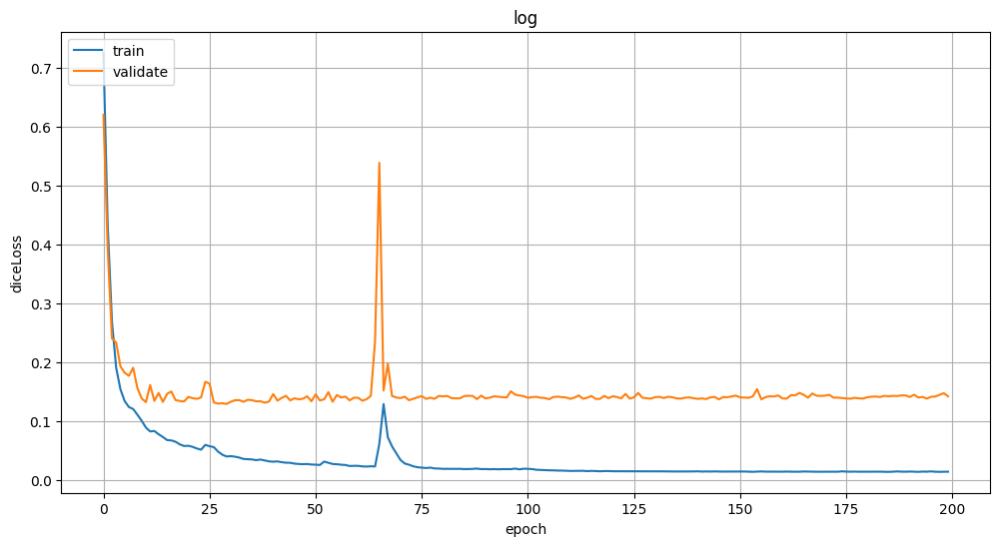

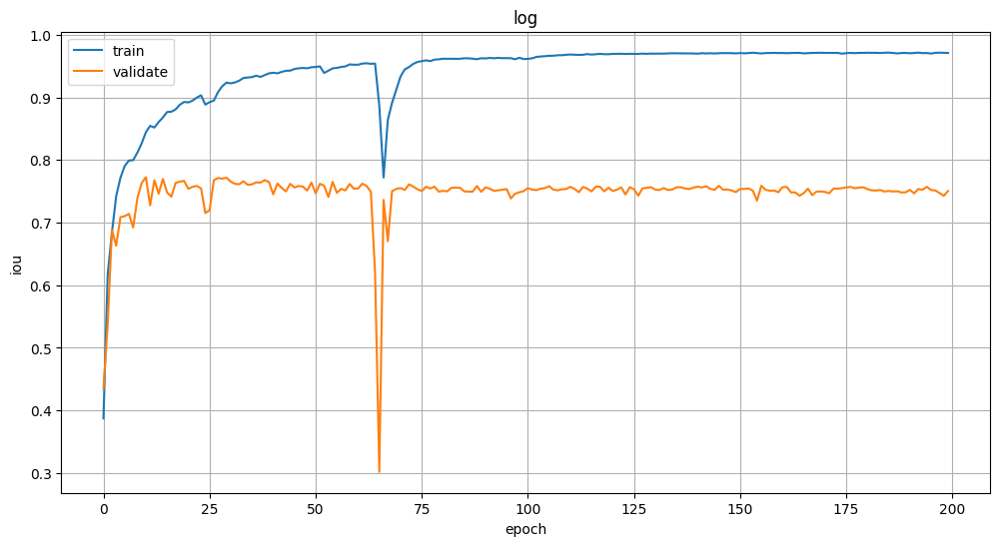

In [10]:
history_plot(train_loss_history,val_loss_history,'diceLoss')
history_plot(train_iou_history,val_iou_history,'iou')

**test eval**

In [9]:
model = torch.load('resnet50-200epoch.pth')

In [7]:
transform = transforms.Compose([transforms.Resize((256, 256)),
                                transforms.ToTensor(),])

batch_size = 32 
DEVICE = 'cuda'
os.environ['CUDA_VISIBLE_DEVICES'] = "7"

test_set = CustomDataset(test_df,transform=transform)
test_loader = DataLoader(test_set, 
                         batch_size=batch_size, 
                         shuffle=True,
                         collate_fn=custom_collate,
                         pin_memory=True)

#data_iter = iter(test_loader)
#inputs, targets = next(data_iter)
#val_loss,val_dice_coefficient,val_iou = validate(model, test_loader, DEVICE)
#print(f'Evaluate---\nDiceLoss:{val_loss}\nDice Coefficient:{val_dice_coefficient}\nIoU:{val_iou}')

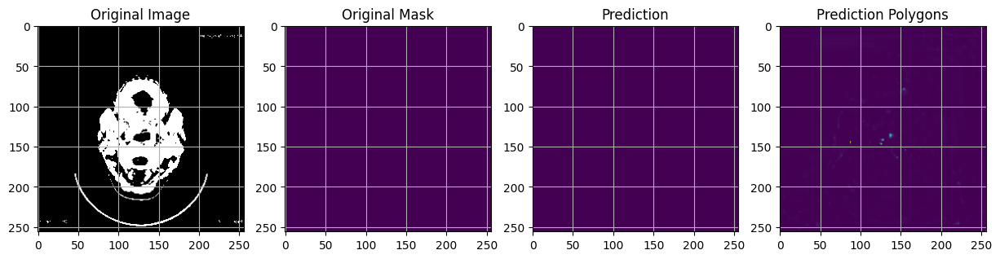

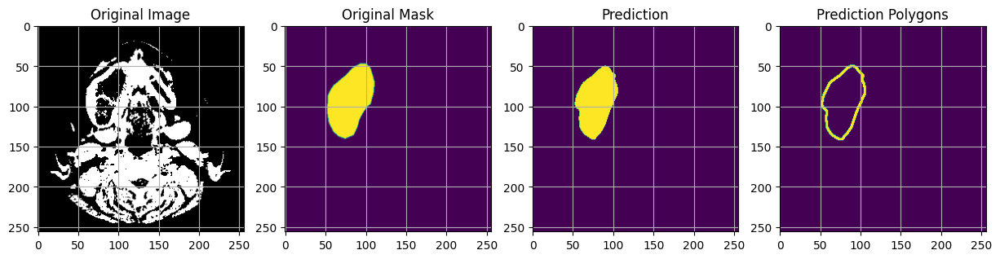

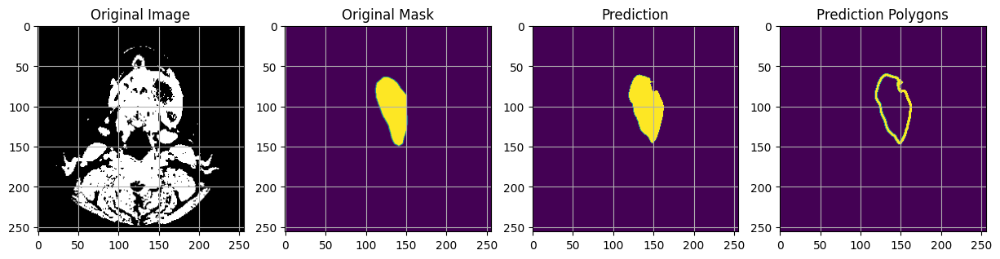

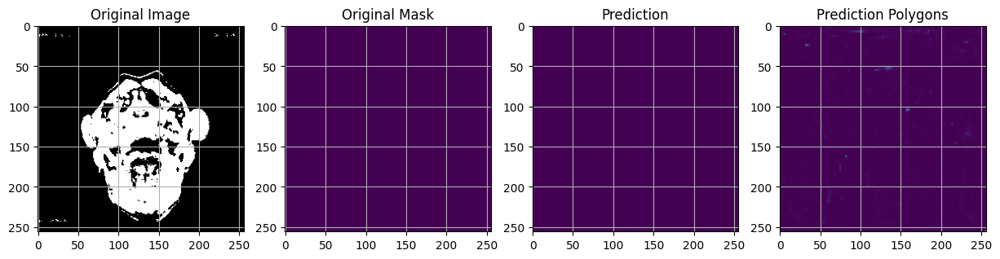

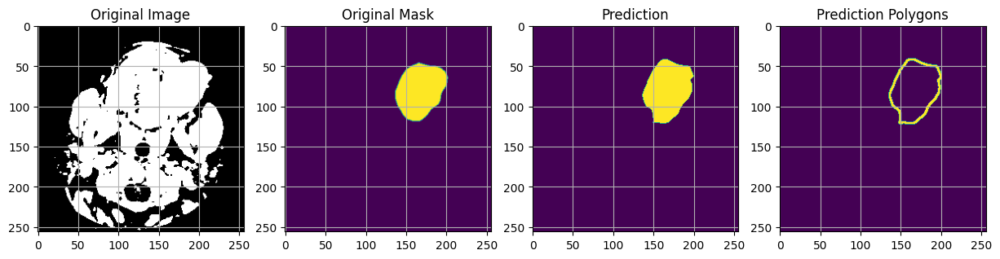

...

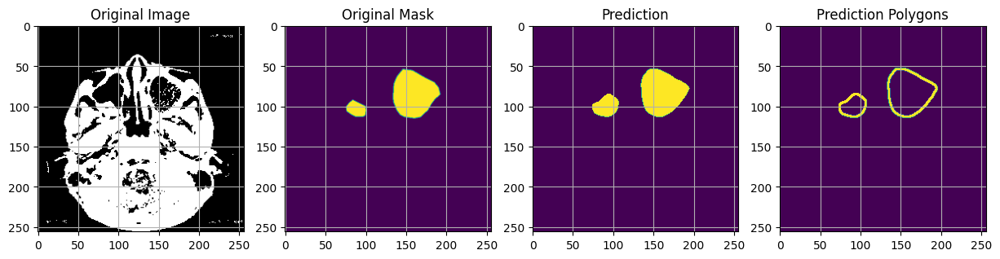

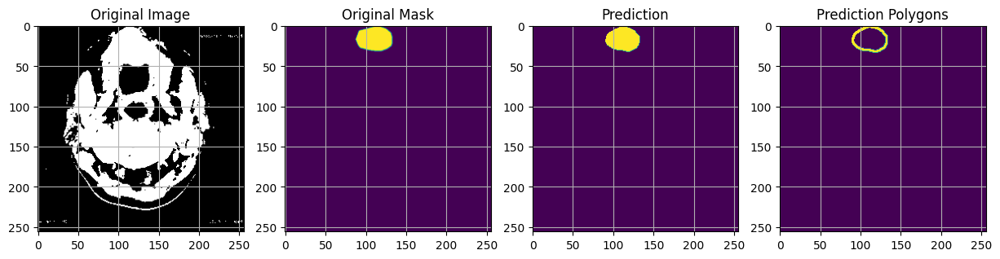

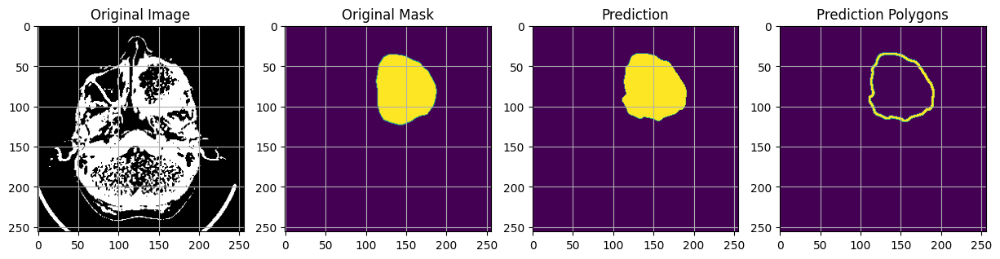

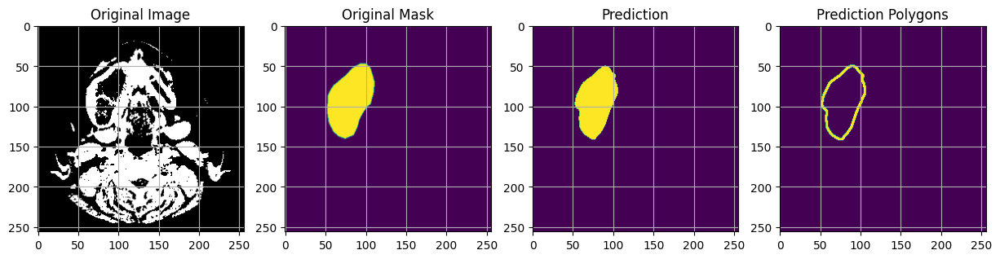

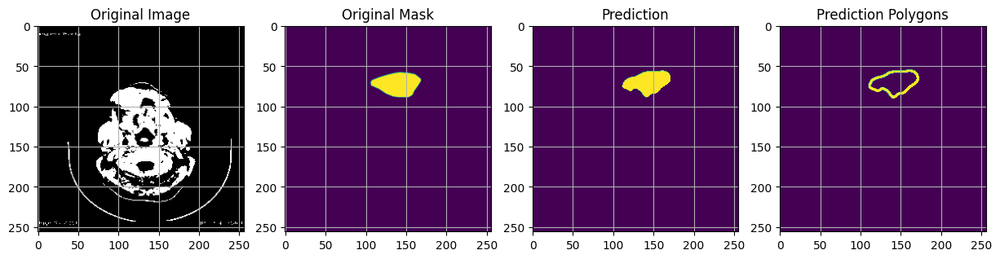

In [12]:
# Visual Mask check

img_height = 256
example = 20
test = test_df.sample(example)

for i in range(example):
    
    test_set = CustomDataset(test,transform=transform)
    test_loader = DataLoader(test_set, 
                             batch_size=batch_size, 
                             shuffle=True,
                             collate_fn=custom_collate,
                             pin_memory=True)

    data_iter = iter(test_loader)
    inputs, targets = next(data_iter)
    inputs,targets= inputs.to(DEVICE), targets.to(DEVICE)
    
    predicted_img = model(inputs)
    
    single_input = inputs[0]
    single_target = targets[0]
    predicted_img = predicted_img[0]

    plt.figure(figsize=(15, 12))
    
    plt.subplot(1, 4, 1)
    plt.imshow(single_input.cpu().numpy().transpose(1, 2, 0).round())
    plt.title('Original Image')

    plt.subplot(1, 4, 2)
    plt.imshow(np.squeeze(single_target.cpu().numpy()))
    plt.title('Original Mask')

    plt.subplot(1, 4, 3)
    plt.imshow(np.squeeze(predicted_img.cpu().detach().numpy()) > 0.5)
    plt.title('Prediction')
    
    plt.subplot(1, 4, 4)
    plt.imshow(Polygons(np.squeeze(predicted_img.cpu().detach().numpy()),0.0,0.01))
    plt.title('Prediction Polygons')
    
    plt.show()

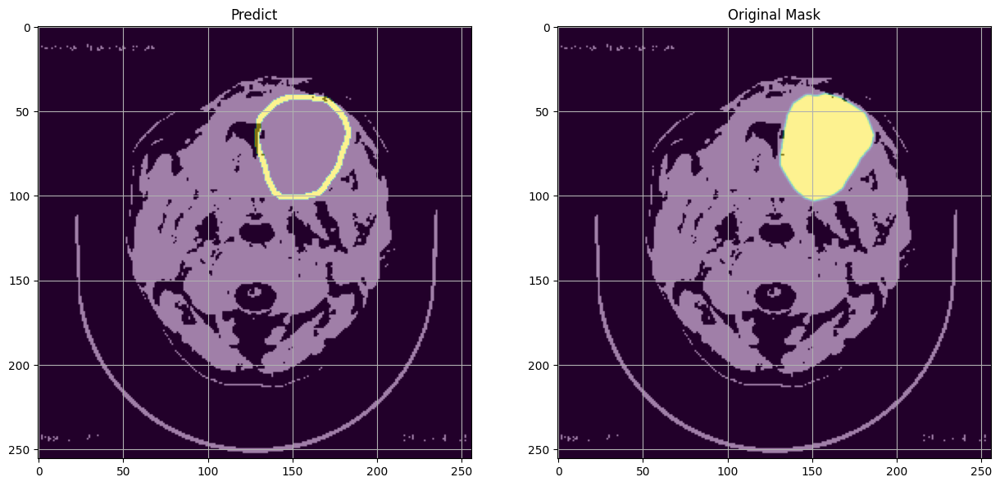

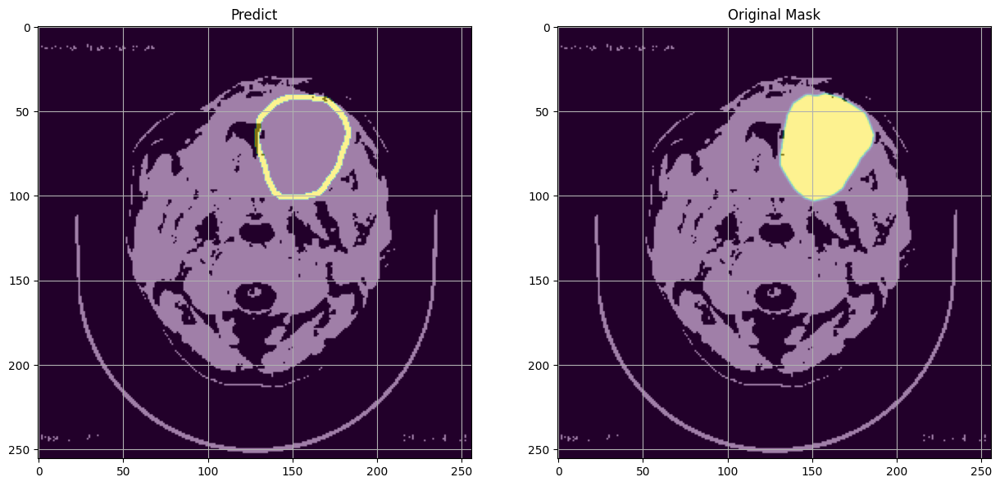

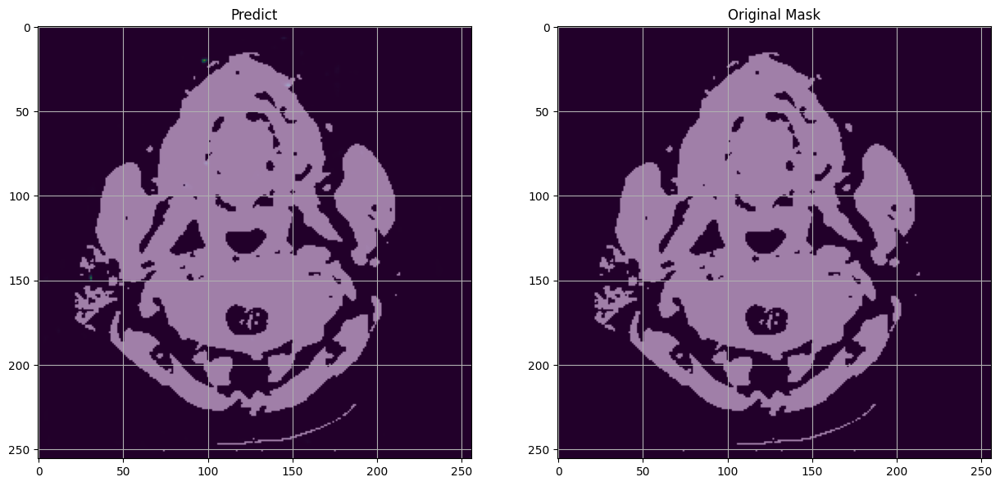

In [13]:
# Visual Predict

img_height = 256
example = 3
test = test_df.sample(example)

for i in range(example):
    
    test_set = CustomDataset(test,transform=transform)
    test_loader = DataLoader(test_set, 
                             batch_size=batch_size, 
                             shuffle=True,
                             collate_fn=custom_collate,
                             pin_memory=True)

    data_iter = iter(test_loader)
    inputs, targets = next(data_iter)
    inputs,targets= inputs.to(DEVICE), targets.to(DEVICE)
    
    predicted_img = model(inputs)
    
    single_input = inputs[0]
    single_target = targets[0]
    predicted_img = predicted_img[0]

    plt.figure(figsize=(15, 12))
    
    plt.subplot(1, 2, 1)
    plt.title('Predict')
    plt.imshow(Polygons(np.squeeze(predicted_img.cpu().detach().numpy()),0.0,0.01))
    plt.imshow(single_input.cpu().numpy().transpose(1, 2, 0).round(),alpha=0.5)
    
    plt.subplot(1, 2, 2)
    plt.title('Original Mask')
    plt.imshow(np.squeeze(single_target.cpu().numpy()))
    plt.imshow(single_input.cpu().numpy().transpose(1, 2, 0).round(),alpha=0.5)
    

    plt.show()

# **Build ResNet50 Classifier**

In [5]:
from torchvision.datasets import ImageFolder
from sklearn.metrics import roc_auc_score
import numpy as np

class CustomGenerator(torch.utils.data.Dataset):
    
    def __init__(self, dataframe, transform=None):
        
        self.dataframe = dataframe
        self.transform = transform

    def __len__(self):
        
        return len(self.dataframe)

    def __getitem__(self, index):
        
        annotation = self.dataframe.iloc[index, 0]
        image = Image.open(annotation).convert('RGB')
        label = label = torch.tensor(int(self.dataframe.iloc[index, 3]))
        
        if self.transform:
            image = self.transform(image)
            
        return (image,label)
    

def accuracy(outputs, targets):
    """
    Compute the accuracy given predicted outputs and true targets.

    Args:
    - outputs (torch.Tensor): Predicted outputs from the model
    - targets (torch.Tensor): True labels

    Returns:
    - float: Accuracy
    """
    _, predicted = torch.max(outputs, 1)
    correct = (predicted == targets).sum().item()
    total = targets.size(0)
    accuracy = correct / total
    return accuracy

def encoder_class(dataframe):
    
    encoder = {'benign':1, 'malignant':2, 'normal':0}
    dataframe['class'] = [encoder[i] for i in dataframe['category']]
    
    return dataframe

def validation_step(valid_dl, model, loss_fn):
    
    total_accuracy = 0.0
    total_samples = 0
    
    for image, label in valid_dl:
        
        image ,label = image.to(DEVICE) ,label.to(DEVICE)
        
        out = model(image)
        loss = loss_fn(out, label)
        acc = accuracy(out, label)
        #auc = multiclass_auc(out, label)

        #total_auc += auc * targets.size(0)
        total_samples += targets.size(0)
        total_accuracy += acc * targets.size(0)

    # Compute overall accuracy
    overall_accuracy = total_accuracy / total_samples
    #overall_auc = total_auc / total_samples
    
    return {"val_loss": loss, "val_acc": overall_accuracy} #,"val_auc": overall_auc}


In [6]:
print(val_df['category'].value_counts())
print(val_df['category'].value_counts().index.tolist())
val_df.sample(6)

category
benign       121
malignant    121
normal       121
Name: count, dtype: int64
['benign', 'malignant', 'normal']


,filename,mask_filename,category
128,../dataset/image-all/e06e07f2-0316.png,../dataset/unet/images-mark/e06e07f2-0316.png,malignant
33,../dataset/image-all/24c607c6-kd.png,../dataset/unet/images-mark/24c607c6-kd.png,benign
328,../dataset/image-all/normal-20316-78c09..png,../dataset/unet/images-mark/normal-20316-78c09...,normal
223,../dataset/image-all/9b4ee0b0-0125.png,../dataset/unet/images-mark/9b4ee0b0-0125.png,malignant
80,../dataset/image-all/a5bc8362-ei.png,../dataset/unet/images-mark/a5bc8362-ei.png,benign
309,../dataset/image-all/normal-7116-c37c6..png,../dataset/unet/images-mark/normal-7116-c37c6....,normal


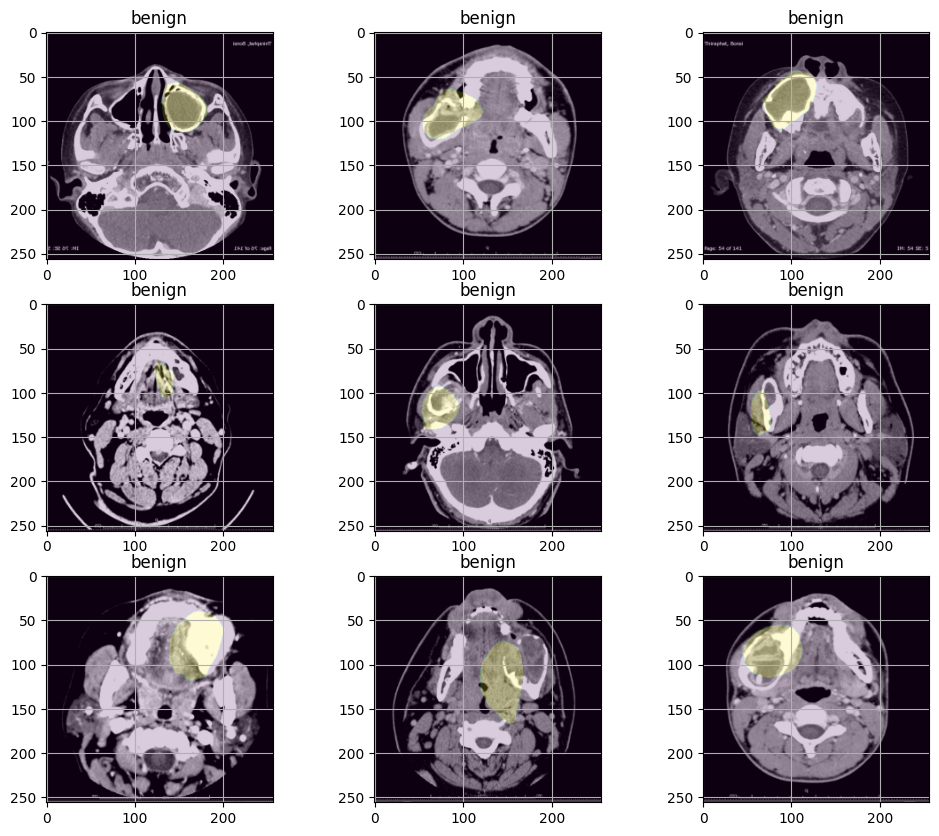

In [14]:
visual_image(val_df,3,3)

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2535 entries, 0 to 2534
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   filename       2535 non-null   object
 1   mask_filename  2535 non-null   object
 2   category       2535 non-null   object
dtypes: object(3)
memory usage: 59.5+ KB


In [8]:
# label encoder

train_df = encoder_class(train_df)
val_df = encoder_class(val_df)

print(train_df['category'].value_counts())
print(train_df['class'].value_counts())
print(val_df['category'].value_counts())
print(val_df['class'].value_counts())

category
benign       845
malignant    845
normal       845
Name: count, dtype: int64
class
1    845
2    845
0    845
Name: count, dtype: int64
category
benign       121
malignant    121
normal       121
Name: count, dtype: int64
class
1    121
2    121
0    121
Name: count, dtype: int64


In [9]:
# input & prepare data
from torch.utils.data import DataLoader

DEVICE = 'cuda'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

train_dataset = CustomGenerator(train_df, transform=transform)
val_dataset = CustomGenerator(val_df, transform=transform)

# สร้าง DataLoader
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# prepare model & optimize
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet18', pretrained=True).to(DEVICE)
criterion = nn.CrossEntropyLoss(reduction='sum')
optimizer = optim.Adam(model.parameters(), lr=0.0001)
print(model)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [11]:
os.environ['CUDA_VISIBLE_DEVICES'] = "7"

import time
import torch.nn.functional as F

num_epochs = 100

max_score = 0

log_loss_train = []
log_loss_val = []

log_acc_train = []
log_acc_val = []

log_auc_train = []
log_auc_val = []

for epoch in range(num_epochs):
    
    t0 = time.time()
    
    model.train()
    
    running_loss = 0.0
    
    loop = tqdm(train_loader)
    
    # train model epoch = i
    for inputs, targets in loop:
        
        # define all data in gpu
        inputs ,targets = inputs.to(DEVICE) ,targets.to(DEVICE)
        
        # forward
        outputs = model(inputs)
        loss = criterion(outputs, targets)

        # backward
        optimizer.zero_grad()
        loss.backward()
        
        # gradient or adam step
        optimizer.step()
        
        # progress bar
        loop.set_description(f'Epoch [{epoch}/{num_epochs}]')
        loop.set_postfix(loss=loss.item())
        
        # sum result
        running_loss += loss.item()

    # average loss and metrics all index of trainset
    train_loss = running_loss / len(train_loader)

    
    
    model.eval()
    # Set the model to evaluation mode
    val = validation_step(val_loader, model, criterion)
    
    # append result
    log_loss_train.append(train_loss)
    log_loss_val.append(val['val_loss'])
    log_acc_val.append(val['val_acc'])
    #log_auc_val.append(val['val_auc'])
    

    # do something (save model, change lr, etc.)
    if  max_score < val['val_acc'] :
        max_score = val['val_acc']
        torch.save(model, './bestmodel-resnet50-classification.pth')
        print('Model saved!')
        
    if epoch == 50:
        optimizer.param_groups[0]['lr'] = 0.00001
        print('Decrease decoder learning rate to 0.0001')

        
    print(f"Epoch {epoch + 1}/{num_epochs}\nTrain Loss: {train_loss:.4f},\nValidation Loss: {val['val_loss']:.4f} ,\nValidation acc:{val['val_acc']:.4f},\nepoch time: {time.time()-t0:.4f}")
    print("---"*30) 

Epoch [0/100]: 100%|██████████| 80/80 [00:16<00:00,  4.72it/s, loss=1.85]  


Model saved!
Epoch 1/100
Train Loss: 1.0917,
Validation Loss: 0.1450 ,
Validation acc:0.9922,
epoch time: 19.1459
------------------------------------------------------------------------------------------


Epoch [1/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=4.4]   


Epoch 2/100
Train Loss: 0.8135,
Validation Loss: 0.0861 ,
Validation acc:0.9922,
epoch time: 18.7729
------------------------------------------------------------------------------------------


Epoch [2/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.0102]


Epoch 3/100
Train Loss: 0.6137,
Validation Loss: 0.0655 ,
Validation acc:0.9922,
epoch time: 18.7474
------------------------------------------------------------------------------------------


Epoch [3/100]: 100%|██████████| 80/80 [00:16<00:00,  4.91it/s, loss=0.000706]


Epoch 4/100
Train Loss: 0.4720,
Validation Loss: 0.0259 ,
Validation acc:0.9922,
epoch time: 18.4002
------------------------------------------------------------------------------------------


Epoch [4/100]: 100%|██████████| 80/80 [00:16<00:00,  4.87it/s, loss=0.00247]


Epoch 5/100
Train Loss: 0.2245,
Validation Loss: 0.0186 ,
Validation acc:0.9896,
epoch time: 18.5587
------------------------------------------------------------------------------------------


Epoch [5/100]: 100%|██████████| 80/80 [00:16<00:00,  4.77it/s, loss=0.0706] 


Epoch 6/100
Train Loss: 0.5166,
Validation Loss: 0.0730 ,
Validation acc:0.9896,
epoch time: 18.9209
------------------------------------------------------------------------------------------


Epoch [6/100]: 100%|██████████| 80/80 [00:16<00:00,  4.75it/s, loss=0.0109] 


Model saved!
Epoch 7/100
Train Loss: 0.3487,
Validation Loss: 0.0042 ,
Validation acc:0.9974,
epoch time: 19.0373
------------------------------------------------------------------------------------------


Epoch [7/100]: 100%|██████████| 80/80 [00:16<00:00,  4.86it/s, loss=1.95]   


Epoch 8/100
Train Loss: 0.2137,
Validation Loss: 0.0186 ,
Validation acc:0.9896,
epoch time: 18.4891
------------------------------------------------------------------------------------------


Epoch [8/100]: 100%|██████████| 80/80 [00:16<00:00,  4.74it/s, loss=0.00298]


Epoch 9/100
Train Loss: 0.1525,
Validation Loss: 0.0123 ,
Validation acc:0.9948,
epoch time: 19.0420
------------------------------------------------------------------------------------------


Epoch [9/100]: 100%|██████████| 80/80 [00:16<00:00,  4.74it/s, loss=2.24]   


Epoch 10/100
Train Loss: 0.1470,
Validation Loss: 0.0294 ,
Validation acc:0.9948,
epoch time: 19.0199
------------------------------------------------------------------------------------------


Epoch [10/100]: 100%|██████████| 80/80 [00:16<00:00,  4.86it/s, loss=0.0275] 


Epoch 11/100
Train Loss: 0.6212,
Validation Loss: 0.0202 ,
Validation acc:0.9818,
epoch time: 18.5276
------------------------------------------------------------------------------------------


Epoch [11/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=2.17]   


Epoch 12/100
Train Loss: 1.2211,
Validation Loss: 0.0395 ,
Validation acc:0.9635,
epoch time: 18.4083
------------------------------------------------------------------------------------------


Epoch [12/100]: 100%|██████████| 80/80 [00:16<00:00,  4.93it/s, loss=4.45]  


Epoch 13/100
Train Loss: 1.0021,
Validation Loss: 0.0080 ,
Validation acc:0.9948,
epoch time: 18.2452
------------------------------------------------------------------------------------------


Epoch [13/100]: 100%|██████████| 80/80 [00:16<00:00,  4.93it/s, loss=8.29]   


Epoch 14/100
Train Loss: 0.5922,
Validation Loss: 0.0408 ,
Validation acc:0.9896,
epoch time: 18.3201
------------------------------------------------------------------------------------------


Epoch [14/100]: 100%|██████████| 80/80 [00:16<00:00,  4.97it/s, loss=0.107]  


Epoch 15/100
Train Loss: 0.7125,
Validation Loss: 0.0084 ,
Validation acc:0.9922,
epoch time: 18.2467
------------------------------------------------------------------------------------------


Epoch [15/100]: 100%|██████████| 80/80 [00:16<00:00,  4.74it/s, loss=0.088]  


Epoch 16/100
Train Loss: 0.3311,
Validation Loss: 0.0045 ,
Validation acc:0.9974,
epoch time: 19.0433
------------------------------------------------------------------------------------------


Epoch [16/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.0134] 


Epoch 17/100
Train Loss: 0.3332,
Validation Loss: 0.0107 ,
Validation acc:0.9974,
epoch time: 18.6350
------------------------------------------------------------------------------------------


Epoch [17/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=1.08]   


Epoch 18/100
Train Loss: 0.1310,
Validation Loss: 0.0151 ,
Validation acc:0.9948,
epoch time: 18.8908
------------------------------------------------------------------------------------------


Epoch [18/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=3.88]   


Epoch 19/100
Train Loss: 0.2387,
Validation Loss: 0.2198 ,
Validation acc:0.9922,
epoch time: 18.8004
------------------------------------------------------------------------------------------


Epoch [19/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.0136] 


Epoch 20/100
Train Loss: 1.1511,
Validation Loss: 0.0272 ,
Validation acc:0.9922,
epoch time: 18.7887
------------------------------------------------------------------------------------------


Epoch [20/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.0709] 


Epoch 21/100
Train Loss: 0.6282,
Validation Loss: 0.0018 ,
Validation acc:0.9922,
epoch time: 18.8528
------------------------------------------------------------------------------------------


Epoch [21/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.00124]


Epoch 22/100
Train Loss: 0.3623,
Validation Loss: 0.0026 ,
Validation acc:0.9974,
epoch time: 19.0558
------------------------------------------------------------------------------------------


Epoch [22/100]: 100%|██████████| 80/80 [00:16<00:00,  4.85it/s, loss=0.000144]


Epoch 23/100
Train Loss: 0.1551,
Validation Loss: 0.0008 ,
Validation acc:0.9974,
epoch time: 18.5785
------------------------------------------------------------------------------------------


Epoch [23/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00101] 


Epoch 24/100
Train Loss: 0.1041,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.7650
------------------------------------------------------------------------------------------


Epoch [24/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00166]


Epoch 25/100
Train Loss: 0.0631,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.6500
------------------------------------------------------------------------------------------


Epoch [25/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=0.000419]


Epoch 26/100
Train Loss: 0.0506,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.7465
------------------------------------------------------------------------------------------


Epoch [26/100]: 100%|██████████| 80/80 [00:16<00:00,  4.89it/s, loss=1.51]    


Epoch 27/100
Train Loss: 0.2183,
Validation Loss: 0.0016 ,
Validation acc:0.9948,
epoch time: 18.4753
------------------------------------------------------------------------------------------


Epoch [27/100]: 100%|██████████| 80/80 [00:16<00:00,  4.91it/s, loss=0.027]  


Epoch 28/100
Train Loss: 0.1654,
Validation Loss: 0.0012 ,
Validation acc:0.9948,
epoch time: 18.3892
------------------------------------------------------------------------------------------


Epoch [28/100]: 100%|██████████| 80/80 [00:16<00:00,  4.99it/s, loss=0.000123]


Epoch 29/100
Train Loss: 0.1003,
Validation Loss: 0.0031 ,
Validation acc:0.9948,
epoch time: 18.1048
------------------------------------------------------------------------------------------


Epoch [29/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.000245]


Epoch 30/100
Train Loss: 0.1388,
Validation Loss: 0.0020 ,
Validation acc:0.9974,
epoch time: 18.6956
------------------------------------------------------------------------------------------


Epoch [30/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.00167] 


Epoch 31/100
Train Loss: 0.0693,
Validation Loss: 0.0012 ,
Validation acc:0.9974,
epoch time: 18.6664
------------------------------------------------------------------------------------------


Epoch [31/100]: 100%|██████████| 80/80 [00:16<00:00,  4.89it/s, loss=0.0173]  


Epoch 32/100
Train Loss: 0.0569,
Validation Loss: 0.0017 ,
Validation acc:0.9974,
epoch time: 18.4410
------------------------------------------------------------------------------------------


Epoch [32/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.00171] 


Epoch 33/100
Train Loss: 0.0794,
Validation Loss: 0.0009 ,
Validation acc:0.9974,
epoch time: 18.7632
------------------------------------------------------------------------------------------


Epoch [33/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.000353]


Epoch 34/100
Train Loss: 0.0690,
Validation Loss: 0.0011 ,
Validation acc:0.9974,
epoch time: 18.8618
------------------------------------------------------------------------------------------


Epoch [34/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00913] 


Epoch 35/100
Train Loss: 0.0774,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.7376
------------------------------------------------------------------------------------------


Epoch [35/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.0012]  


Epoch 36/100
Train Loss: 0.0529,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.8540
------------------------------------------------------------------------------------------


Epoch [36/100]: 100%|██████████| 80/80 [00:16<00:00,  4.76it/s, loss=0.131]   


Epoch 37/100
Train Loss: 0.0602,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.9306
------------------------------------------------------------------------------------------


Epoch [37/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=5.63e-5] 


Epoch 38/100
Train Loss: 0.0590,
Validation Loss: 0.0014 ,
Validation acc:0.9974,
epoch time: 18.7526
------------------------------------------------------------------------------------------


Epoch [38/100]: 100%|██████████| 80/80 [00:16<00:00,  4.77it/s, loss=0.0017]  


Epoch 39/100
Train Loss: 0.0683,
Validation Loss: 0.0018 ,
Validation acc:0.9974,
epoch time: 18.9038
------------------------------------------------------------------------------------------


Epoch [39/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.024]   


Epoch 40/100
Train Loss: 0.0780,
Validation Loss: 0.0010 ,
Validation acc:0.9974,
epoch time: 18.8601
------------------------------------------------------------------------------------------


Epoch [40/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.00136] 


Epoch 41/100
Train Loss: 0.0654,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.9168
------------------------------------------------------------------------------------------


Epoch [41/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.000626]


Epoch 42/100
Train Loss: 0.0579,
Validation Loss: 0.0009 ,
Validation acc:0.9974,
epoch time: 18.8586
------------------------------------------------------------------------------------------


Epoch [42/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.0119]  


Epoch 43/100
Train Loss: 0.0586,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.7201
------------------------------------------------------------------------------------------


Epoch [43/100]: 100%|██████████| 80/80 [00:16<00:00,  4.85it/s, loss=0.00111] 


Epoch 44/100
Train Loss: 0.0756,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.6515
------------------------------------------------------------------------------------------


Epoch [44/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.542]   


Epoch 45/100
Train Loss: 0.0607,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.7461
------------------------------------------------------------------------------------------


Epoch [45/100]: 100%|██████████| 80/80 [00:16<00:00,  4.84it/s, loss=8.45e-5]


Epoch 46/100
Train Loss: 0.5316,
Validation Loss: 7.9499 ,
Validation acc:0.9643,
epoch time: 18.6668
------------------------------------------------------------------------------------------


Epoch [46/100]: 100%|██████████| 80/80 [00:16<00:00,  4.84it/s, loss=0.273]  


Epoch 47/100
Train Loss: 1.6885,
Validation Loss: 11.2485 ,
Validation acc:0.9486,
epoch time: 18.6209
------------------------------------------------------------------------------------------


Epoch [47/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=2.71]   


Model saved!
Epoch 48/100
Train Loss: 0.4763,
Validation Loss: 0.1092 ,
Validation acc:1.0000,
epoch time: 19.5524
------------------------------------------------------------------------------------------


Epoch [48/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=2.43]   


Epoch 49/100
Train Loss: 0.7887,
Validation Loss: 1.4069 ,
Validation acc:0.9796,
epoch time: 18.8754
------------------------------------------------------------------------------------------


Epoch [49/100]: 100%|██████████| 80/80 [00:16<00:00,  4.76it/s, loss=3.82]    


Epoch 50/100
Train Loss: 0.6198,
Validation Loss: 0.0043 ,
Validation acc:0.9948,
epoch time: 18.9239
------------------------------------------------------------------------------------------


Epoch [50/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.0102] 


Decrease decoder learning rate to 0.0001
Epoch 51/100
Train Loss: 0.2117,
Validation Loss: 0.0014 ,
Validation acc:0.9974,
epoch time: 18.7920
------------------------------------------------------------------------------------------


Epoch [51/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=6.13e-5] 


Epoch 52/100
Train Loss: 0.0966,
Validation Loss: 0.0016 ,
Validation acc:0.9974,
epoch time: 18.8440
------------------------------------------------------------------------------------------


Epoch [52/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.000706]


Epoch 53/100
Train Loss: 0.0684,
Validation Loss: 0.0013 ,
Validation acc:0.9974,
epoch time: 18.8579
------------------------------------------------------------------------------------------


Epoch [53/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.0321]  


Epoch 54/100
Train Loss: 0.0629,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.9158
------------------------------------------------------------------------------------------


Epoch [54/100]: 100%|██████████| 80/80 [00:16<00:00,  4.73it/s, loss=0.000499]


Epoch 55/100
Train Loss: 0.0630,
Validation Loss: 0.0010 ,
Validation acc:0.9974,
epoch time: 19.0893
------------------------------------------------------------------------------------------


Epoch [55/100]: 100%|██████████| 80/80 [00:16<00:00,  4.81it/s, loss=0.000618]


Epoch 56/100
Train Loss: 0.0636,
Validation Loss: 0.0010 ,
Validation acc:0.9974,
epoch time: 18.7956
------------------------------------------------------------------------------------------


Epoch [56/100]: 100%|██████████| 80/80 [00:16<00:00,  4.77it/s, loss=2.9]     


Epoch 57/100
Train Loss: 0.0923,
Validation Loss: 0.0015 ,
Validation acc:0.9974,
epoch time: 18.9146
------------------------------------------------------------------------------------------


Epoch [57/100]: 100%|██████████| 80/80 [00:16<00:00,  4.76it/s, loss=0.000965]


Epoch 58/100
Train Loss: 0.0506,
Validation Loss: 0.0017 ,
Validation acc:0.9974,
epoch time: 18.8236
------------------------------------------------------------------------------------------


Epoch [58/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.000436]


Epoch 59/100
Train Loss: 0.0377,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.7955
------------------------------------------------------------------------------------------


Epoch [59/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=0.000516]


Epoch 60/100
Train Loss: 0.0569,
Validation Loss: 0.0014 ,
Validation acc:0.9974,
epoch time: 18.3541
------------------------------------------------------------------------------------------


Epoch [60/100]: 100%|██████████| 80/80 [00:16<00:00,  4.85it/s, loss=4.06]    


Epoch 61/100
Train Loss: 0.0950,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.6504
------------------------------------------------------------------------------------------


Epoch [61/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.00306] 


Epoch 62/100
Train Loss: 0.0536,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.8291
------------------------------------------------------------------------------------------


Epoch [62/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.00313] 


Epoch 63/100
Train Loss: 0.0482,
Validation Loss: 0.0005 ,
Validation acc:0.9974,
epoch time: 18.8115
------------------------------------------------------------------------------------------


Epoch [63/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00115] 


Epoch 64/100
Train Loss: 0.0546,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.7509
------------------------------------------------------------------------------------------


Epoch [64/100]: 100%|██████████| 80/80 [00:16<00:00,  4.73it/s, loss=0.00301] 


Epoch 65/100
Train Loss: 0.0417,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 19.0409
------------------------------------------------------------------------------------------


Epoch [65/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=0.000408]


Epoch 66/100
Train Loss: 0.0342,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.7871
------------------------------------------------------------------------------------------


Epoch [66/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=9.38e-5] 


Epoch 67/100
Train Loss: 0.0519,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.7079
------------------------------------------------------------------------------------------


Epoch [67/100]: 100%|██████████| 80/80 [00:16<00:00,  4.84it/s, loss=0.00254] 


Epoch 68/100
Train Loss: 0.0542,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.6065
------------------------------------------------------------------------------------------


Epoch [68/100]: 100%|██████████| 80/80 [00:16<00:00,  4.99it/s, loss=0.000759]


Epoch 69/100
Train Loss: 0.0356,
Validation Loss: 0.0012 ,
Validation acc:0.9974,
epoch time: 17.9983
------------------------------------------------------------------------------------------


Epoch [69/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=0.0157]  


Epoch 70/100
Train Loss: 0.0453,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.8220
------------------------------------------------------------------------------------------


Epoch [70/100]: 100%|██████████| 80/80 [00:16<00:00,  4.85it/s, loss=0.000584]


Epoch 71/100
Train Loss: 0.0501,
Validation Loss: 0.0005 ,
Validation acc:0.9974,
epoch time: 18.5751
------------------------------------------------------------------------------------------


Epoch [71/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.106]   


Epoch 72/100
Train Loss: 0.0525,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.6796
------------------------------------------------------------------------------------------


Epoch [72/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.000503]


Epoch 73/100
Train Loss: 0.0455,
Validation Loss: 0.0011 ,
Validation acc:0.9974,
epoch time: 18.6820
------------------------------------------------------------------------------------------


Epoch [73/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00056] 


Epoch 74/100
Train Loss: 0.0367,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.7529
------------------------------------------------------------------------------------------


Epoch [74/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=0.0652]  


Epoch 75/100
Train Loss: 0.0450,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.4721
------------------------------------------------------------------------------------------


Epoch [75/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=0.000952]


Epoch 76/100
Train Loss: 0.0426,
Validation Loss: 0.0005 ,
Validation acc:0.9974,
epoch time: 18.7896
------------------------------------------------------------------------------------------


Epoch [76/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.00136] 


Epoch 77/100
Train Loss: 0.0464,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.8996
------------------------------------------------------------------------------------------


Epoch [77/100]: 100%|██████████| 80/80 [00:16<00:00,  4.75it/s, loss=0.00962] 


Epoch 78/100
Train Loss: 0.0542,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 19.0070
------------------------------------------------------------------------------------------


Epoch [78/100]: 100%|██████████| 80/80 [00:16<00:00,  4.77it/s, loss=3.76]    


Epoch 79/100
Train Loss: 0.0898,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.9342
------------------------------------------------------------------------------------------


Epoch [79/100]: 100%|██████████| 80/80 [00:16<00:00,  4.83it/s, loss=0.0108]  


Epoch 80/100
Train Loss: 0.0397,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.5760
------------------------------------------------------------------------------------------


Epoch [80/100]: 100%|██████████| 80/80 [00:16<00:00,  4.82it/s, loss=0.00132] 


Epoch 81/100
Train Loss: 0.0502,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.7577
------------------------------------------------------------------------------------------


Epoch [81/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.00469] 


Epoch 82/100
Train Loss: 0.0524,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.8189
------------------------------------------------------------------------------------------


Epoch [82/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.000109]


Epoch 83/100
Train Loss: 0.0487,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.8480
------------------------------------------------------------------------------------------


Epoch [83/100]: 100%|██████████| 80/80 [00:16<00:00,  4.89it/s, loss=5.96e-5] 


Epoch 84/100
Train Loss: 0.0511,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.3717
------------------------------------------------------------------------------------------


Epoch [84/100]: 100%|██████████| 80/80 [00:16<00:00,  4.84it/s, loss=0.0021]  


Epoch 85/100
Train Loss: 0.0364,
Validation Loss: 0.0005 ,
Validation acc:0.9974,
epoch time: 18.6633
------------------------------------------------------------------------------------------


Epoch [85/100]: 100%|██████████| 80/80 [00:16<00:00,  4.79it/s, loss=0.000522]


Epoch 86/100
Train Loss: 0.0312,
Validation Loss: 0.0002 ,
Validation acc:0.9974,
epoch time: 18.8486
------------------------------------------------------------------------------------------


Epoch [86/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.133]   


Epoch 87/100
Train Loss: 0.0410,
Validation Loss: 0.0006 ,
Validation acc:0.9974,
epoch time: 18.8482
------------------------------------------------------------------------------------------


Epoch [87/100]: 100%|██████████| 80/80 [00:16<00:00,  4.86it/s, loss=0.00307] 


Epoch 88/100
Train Loss: 0.0457,
Validation Loss: 0.0007 ,
Validation acc:0.9974,
epoch time: 18.4930
------------------------------------------------------------------------------------------


Epoch [88/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=0.000369]


Epoch 89/100
Train Loss: 0.0477,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.4205
------------------------------------------------------------------------------------------


Epoch [89/100]: 100%|██████████| 80/80 [00:16<00:00,  4.90it/s, loss=0.00308] 


Epoch 90/100
Train Loss: 0.0454,
Validation Loss: 0.0005 ,
Validation acc:0.9974,
epoch time: 18.3895
------------------------------------------------------------------------------------------


Epoch [90/100]: 100%|██████████| 80/80 [00:16<00:00,  4.94it/s, loss=0.00651] 


Epoch 91/100
Train Loss: 0.0495,
Validation Loss: 0.0002 ,
Validation acc:0.9974,
epoch time: 18.3186
------------------------------------------------------------------------------------------


Epoch [91/100]: 100%|██████████| 80/80 [00:16<00:00,  4.77it/s, loss=0.00121] 


Epoch 92/100
Train Loss: 0.0392,
Validation Loss: 0.0010 ,
Validation acc:0.9974,
epoch time: 18.9071
------------------------------------------------------------------------------------------


Epoch [92/100]: 100%|██████████| 80/80 [00:16<00:00,  4.88it/s, loss=0.317]   


Epoch 93/100
Train Loss: 0.0455,
Validation Loss: 0.0002 ,
Validation acc:0.9974,
epoch time: 18.4944
------------------------------------------------------------------------------------------


Epoch [93/100]: 100%|██████████| 80/80 [00:16<00:00,  4.86it/s, loss=0.194]   


Epoch 94/100
Train Loss: 0.0447,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.6122
------------------------------------------------------------------------------------------


Epoch [94/100]: 100%|██████████| 80/80 [00:16<00:00,  4.74it/s, loss=0.00142] 


Epoch 95/100
Train Loss: 0.0428,
Validation Loss: 0.0004 ,
Validation acc:0.9974,
epoch time: 18.9132
------------------------------------------------------------------------------------------


Epoch [95/100]: 100%|██████████| 80/80 [00:15<00:00,  5.03it/s, loss=0.00048] 


Epoch 96/100
Train Loss: 0.0328,
Validation Loss: 0.0009 ,
Validation acc:0.9974,
epoch time: 17.9489
------------------------------------------------------------------------------------------


Epoch [96/100]: 100%|██████████| 80/80 [00:16<00:00,  4.87it/s, loss=0.527]   


Epoch 97/100
Train Loss: 0.0560,
Validation Loss: 0.0003 ,
Validation acc:0.9974,
epoch time: 18.4375
------------------------------------------------------------------------------------------


Epoch [97/100]: 100%|██████████| 80/80 [00:16<00:00,  4.88it/s, loss=7.46e-5] 


Epoch 98/100
Train Loss: 0.0442,
Validation Loss: 0.0002 ,
Validation acc:0.9974,
epoch time: 18.5114
------------------------------------------------------------------------------------------


Epoch [98/100]: 100%|██████████| 80/80 [00:16<00:00,  4.78it/s, loss=0.0527]  


Epoch 99/100
Train Loss: 0.0474,
Validation Loss: 0.0013 ,
Validation acc:0.9948,
epoch time: 18.8916
------------------------------------------------------------------------------------------


Epoch [99/100]: 100%|██████████| 80/80 [00:16<00:00,  4.80it/s, loss=0.00943] 


Epoch 100/100
Train Loss: 0.0465,
Validation Loss: 0.0002 ,
Validation acc:0.9974,
epoch time: 18.8115
------------------------------------------------------------------------------------------


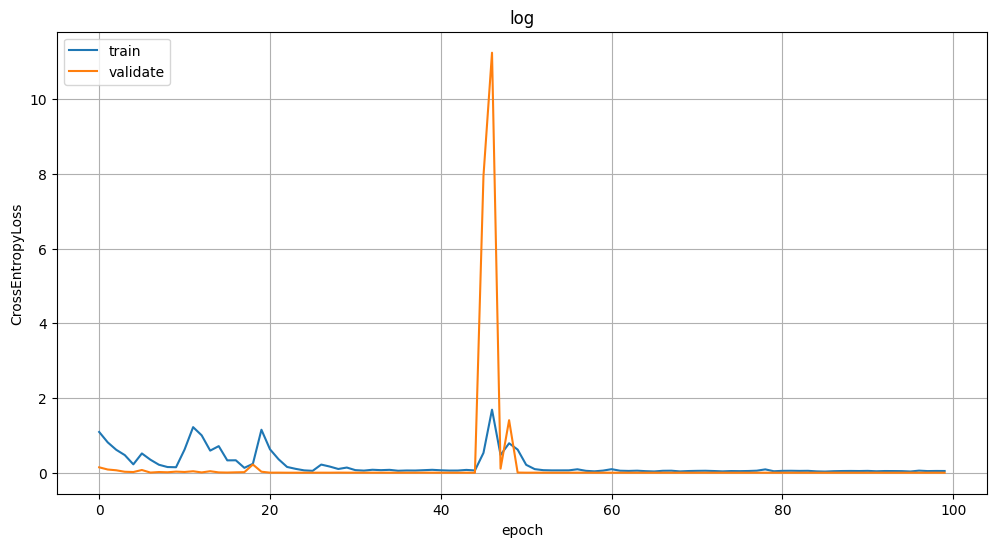

In [48]:
val_loss = [torch.tensor(log_loss_val, device='cuda:0', requires_grad=True)[i].item() for i in range(100)]
history_plot(log_loss_train,val_loss,'CrossEntropyLoss')

In [72]:
# Evaluate
test_df = encoder_class(test_df)

In [ ]:
print(test_df.info())
test_df['category'].value_counts()

In [220]:
from sklearn.metrics import confusion_matrix
import seaborn as sn

test_dataset = CustomGenerator(test_df, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

total_samples = 0
total_accuracy = 0  

y_true = []
y_pred = []

for image, label in test_loader:
        
    image ,label = image.to(DEVICE) ,label.to(DEVICE)
        
    out = model(image)
    loss = criterion(out, label)
    acc = accuracy(out, label)
    output = (torch.max(torch.exp(out), 1)[1]).data.cpu().numpy()
    y_pred.extend(output) 
        
    labels = label.data.cpu().numpy()
    y_true.extend(labels) 
    
    total_samples += targets.size(0)
    total_accuracy += acc * targets.size(0)

overall_accuracy = total_accuracy / total_samples
eva = {"val_loss": loss, "val_acc": overall_accuracy}
print(f"Loss:{eva['val_loss']:.4f}\nValidation acc:{eva['val_acc']:.4f},\nepoch time: {time.time()-t0:.4f}")

Loss:0.1725
Validation acc:0.9946,
epoch time: 46350.3416


In [221]:
# Build confusion matrix

class_map = {1:'benign', 2:'malignant', 0:'normal'}

cf_matrix = confusion_matrix(y_true, y_pred)

df_cm = pd.DataFrame(cf_matrix / np.sum(cf_matrix, axis=1)[:, None], index = [class_map[i] for i in classes], # 
                     columns = [class_map[i] for i in classes])
print(cf_matrix)
df_cm

[[239   0   3]
 [  1 241   0]
 [  0   0 242]]


,benign,malignant,normal
benign,0.987603,0.000000,0.012397
malignant,0.004132,0.995868,0.000000
normal,0.000000,0.000000,1.000000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


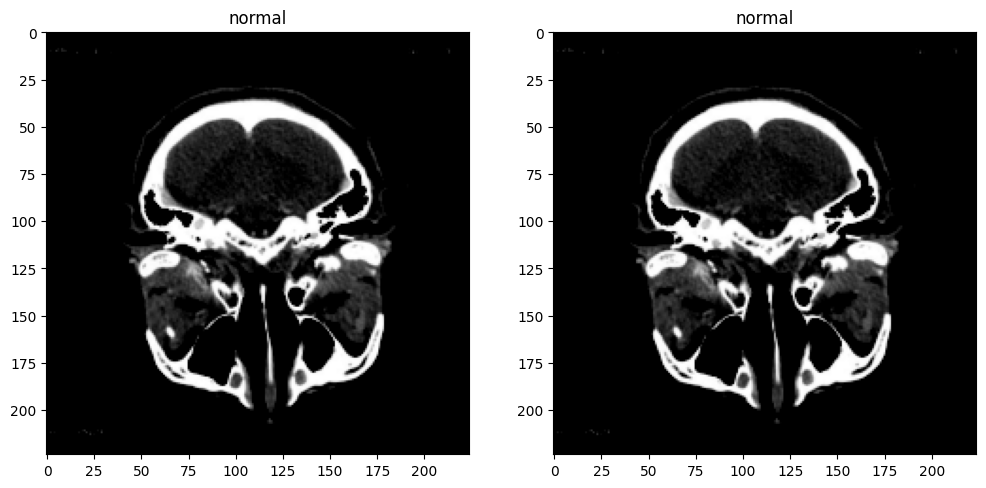

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


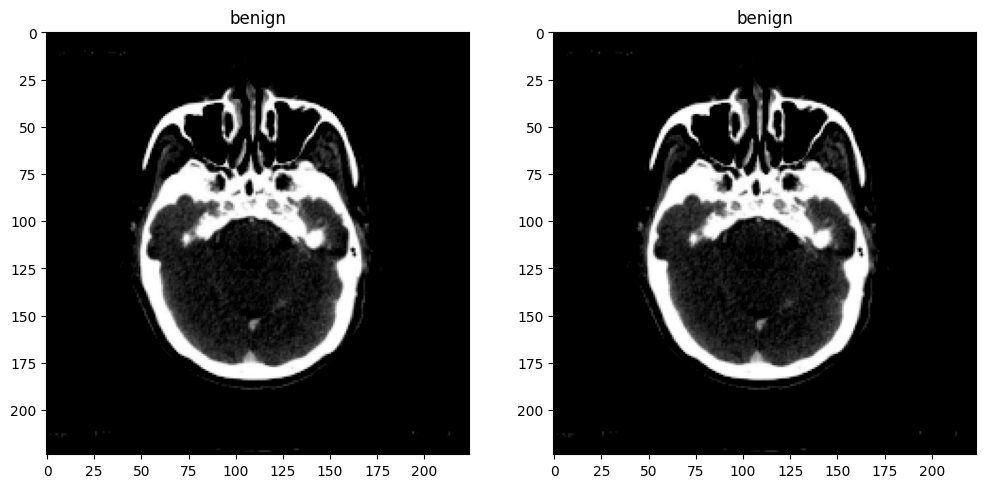

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


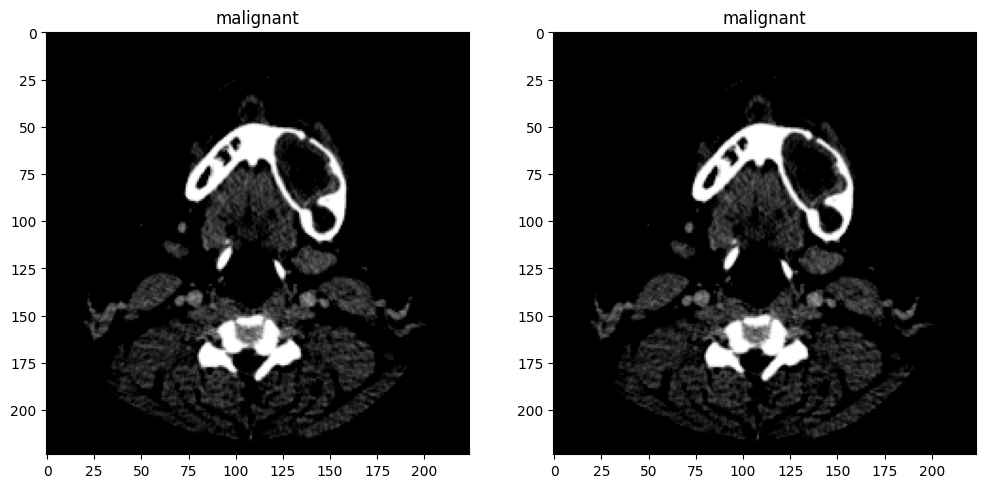

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


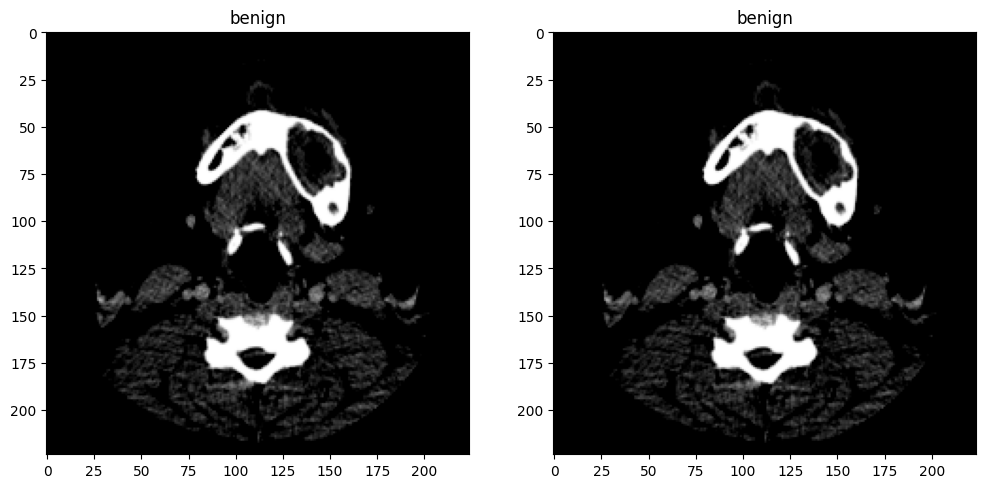

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


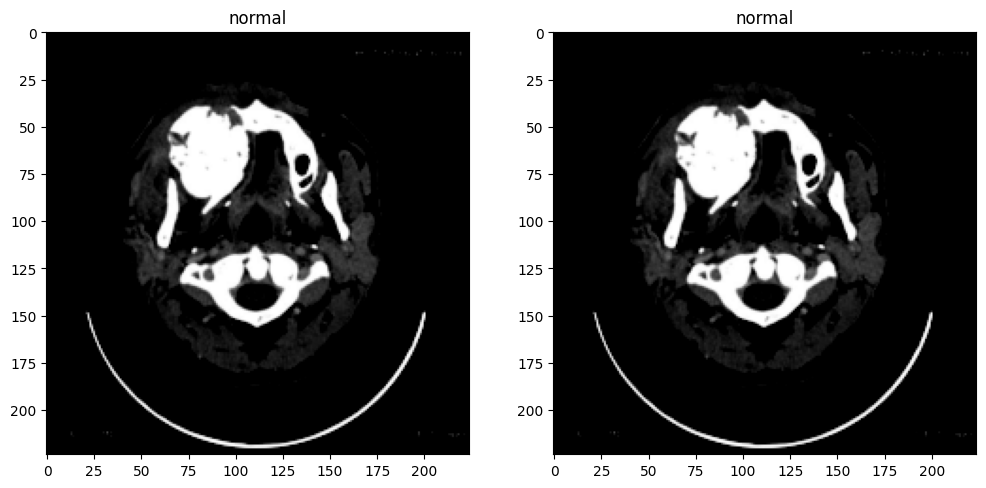

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


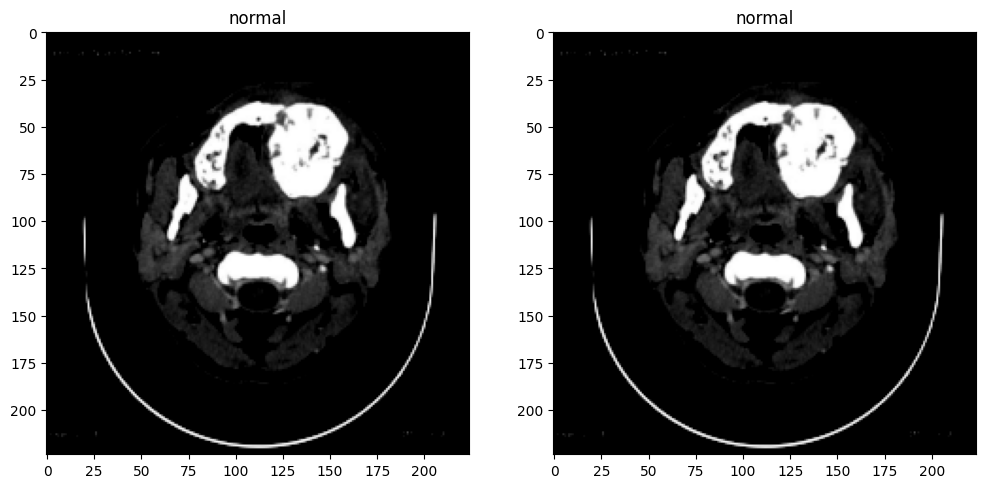

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


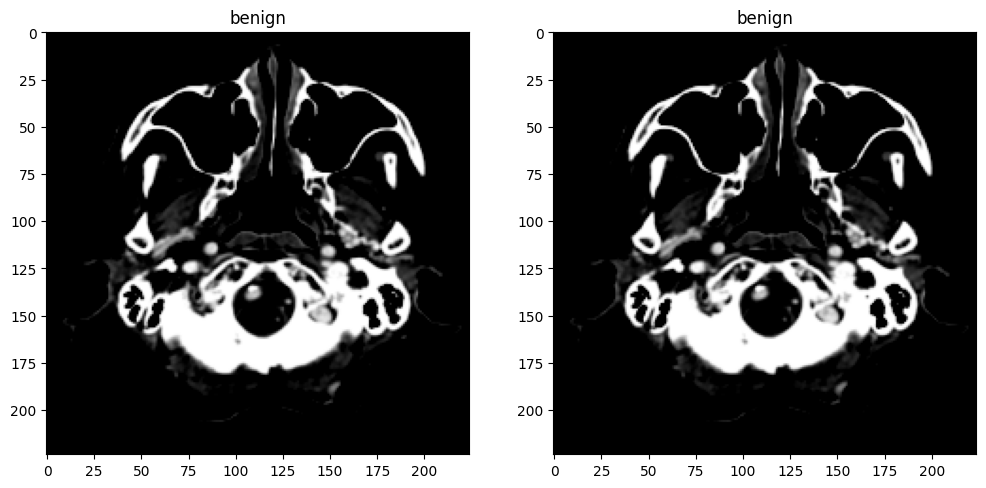

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


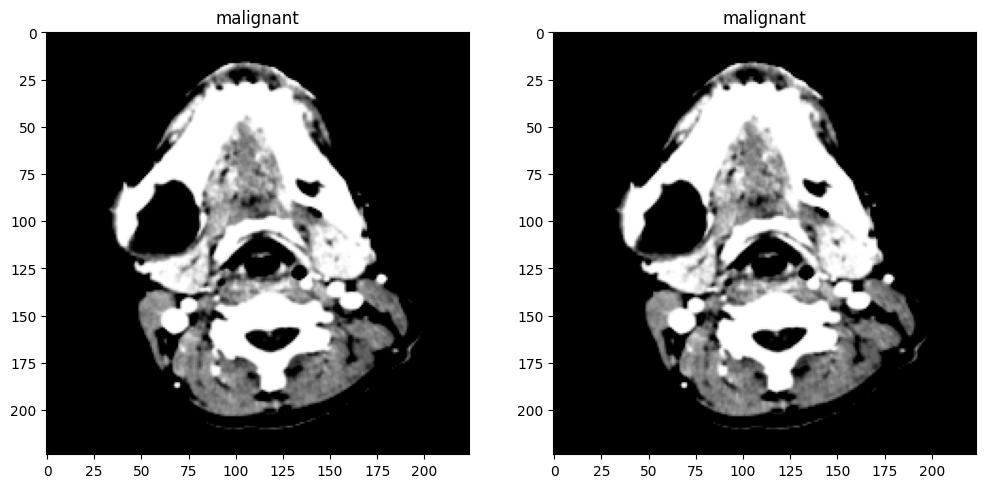

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


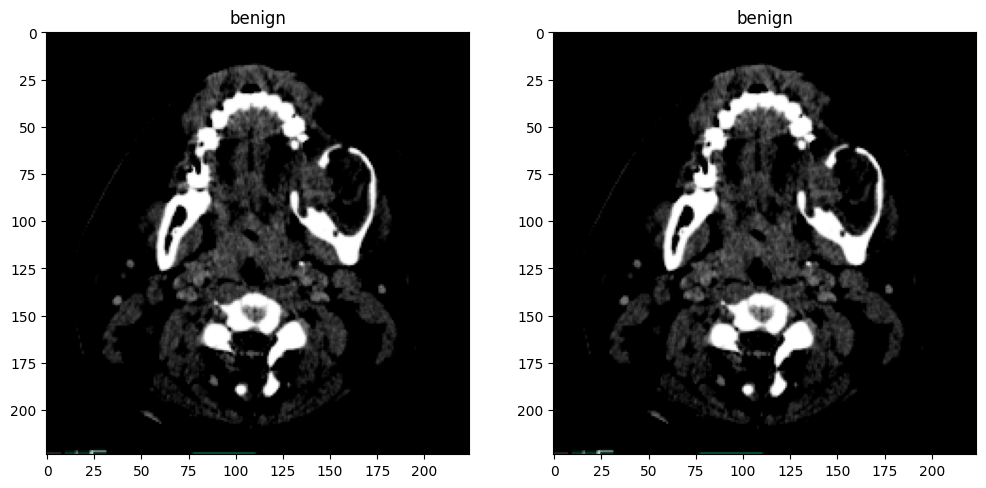

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


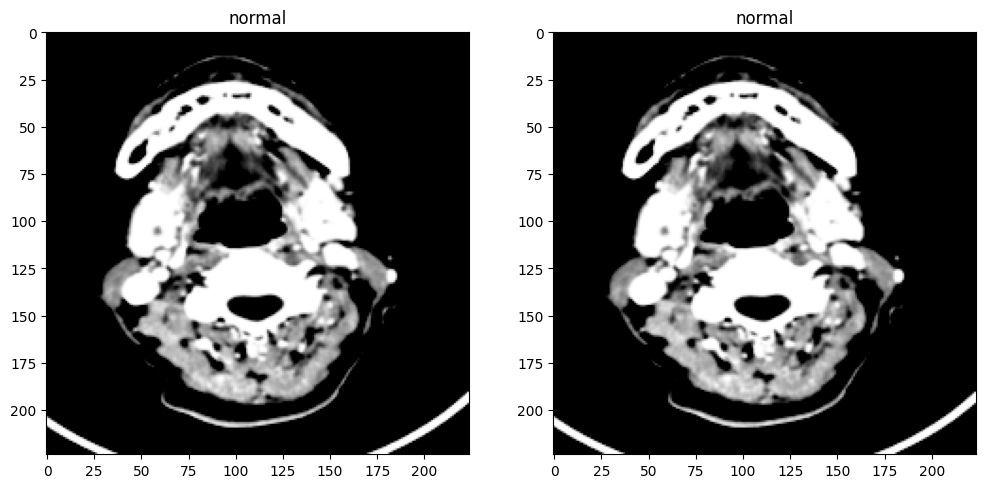

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


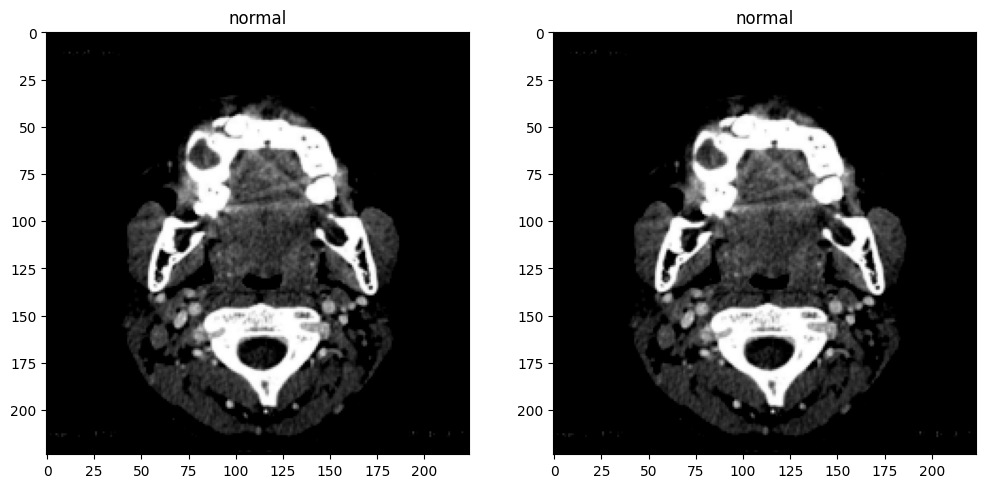

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


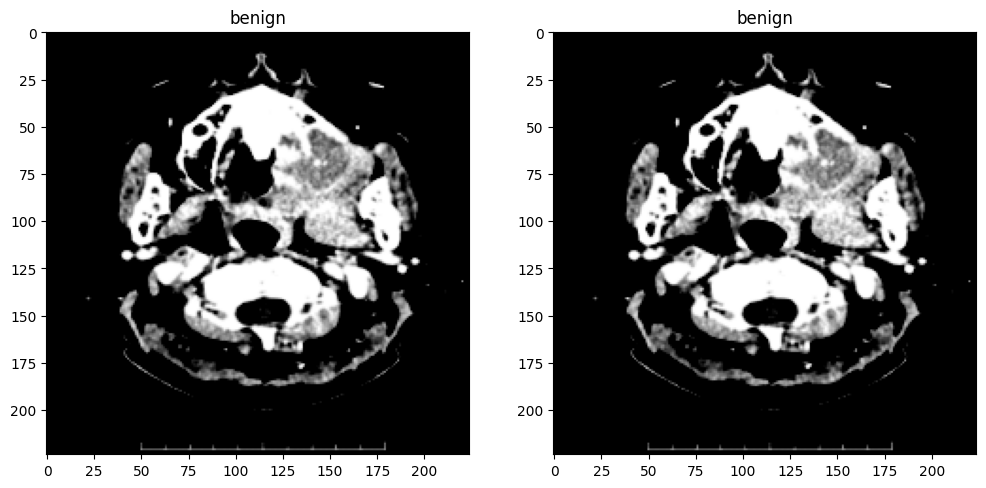

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


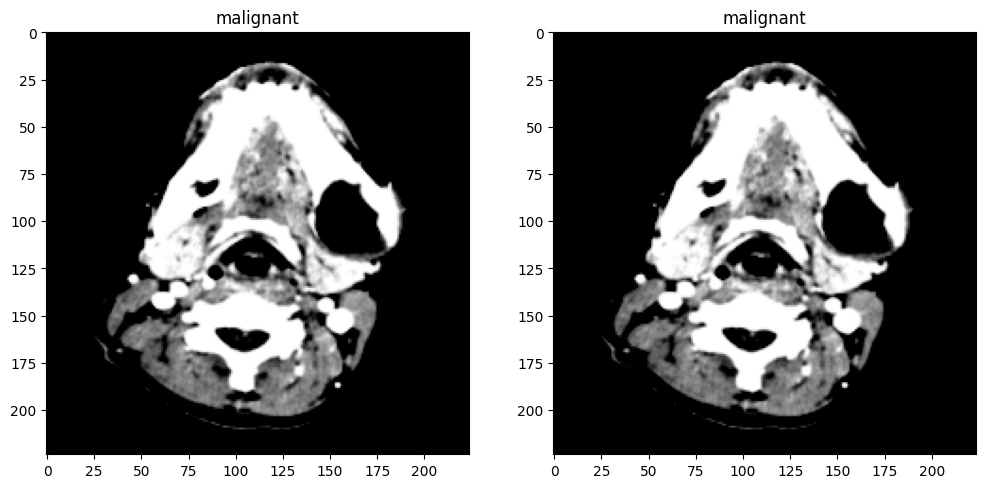

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


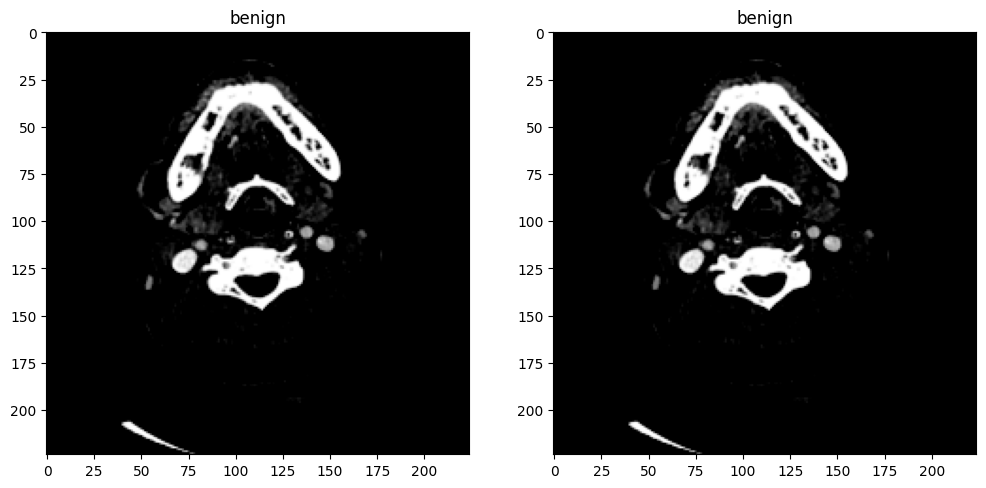

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


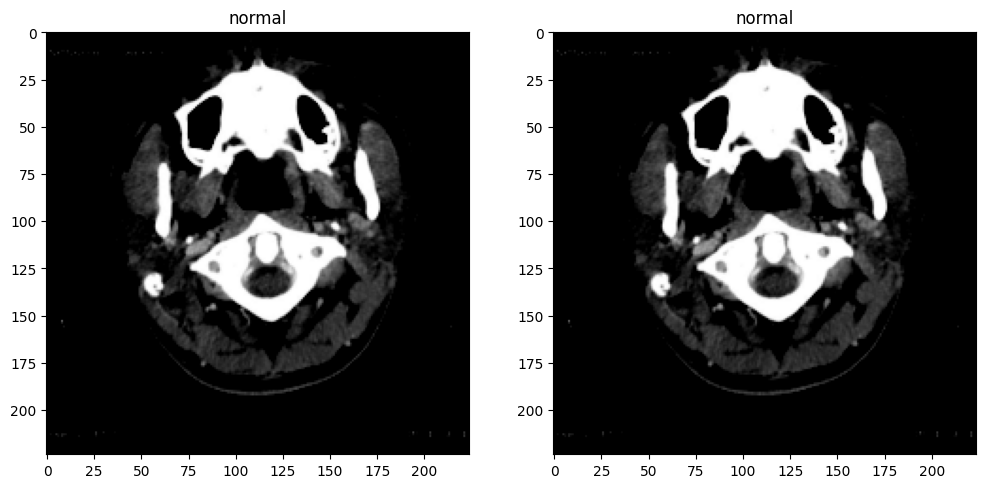

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


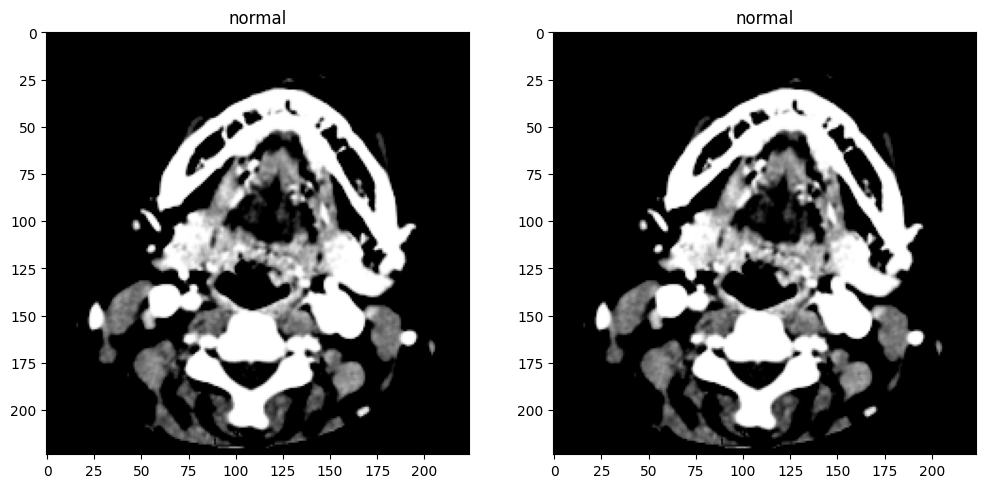

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


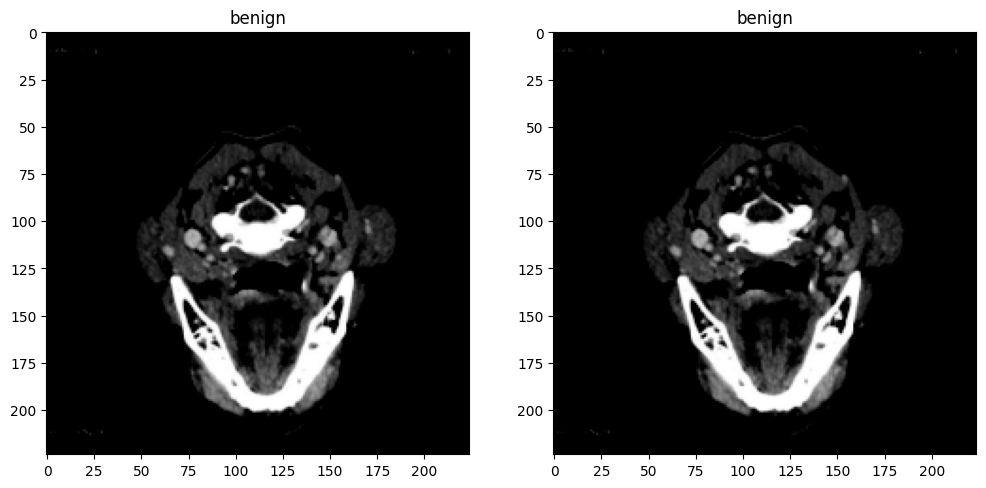

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


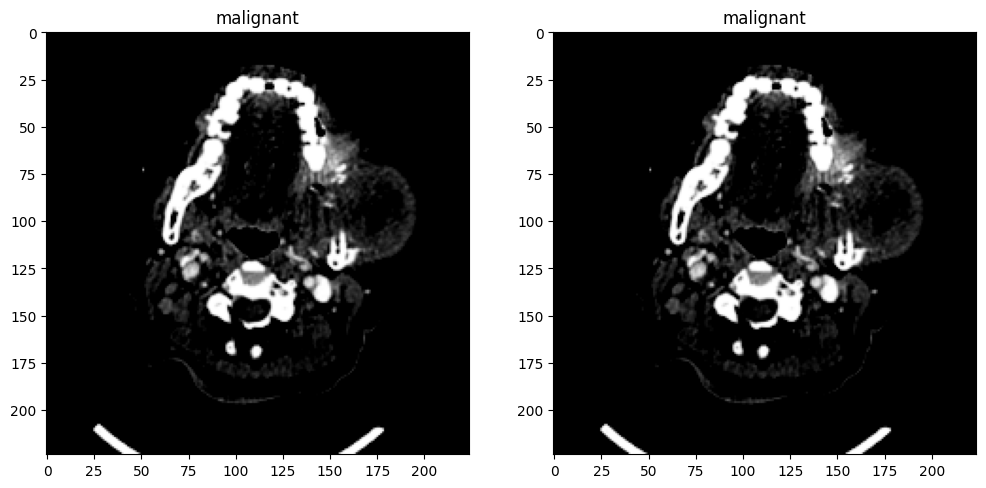

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


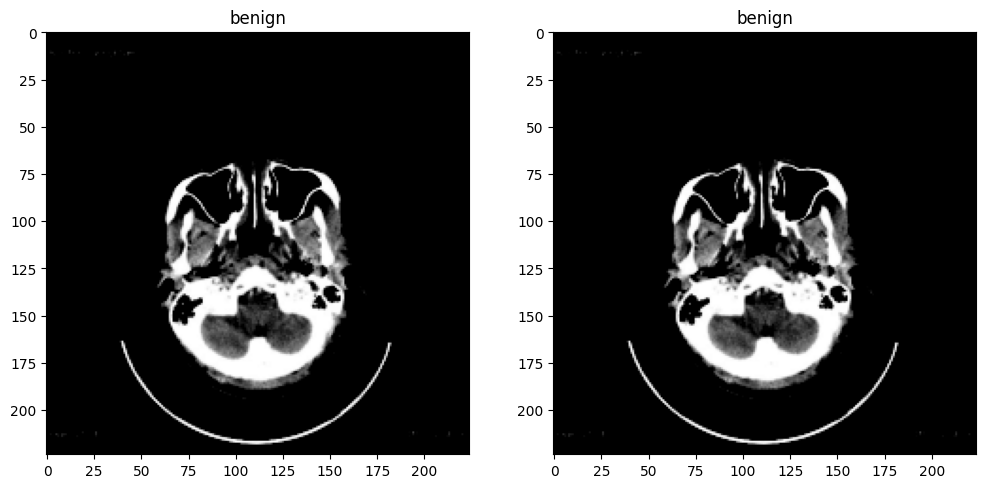

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


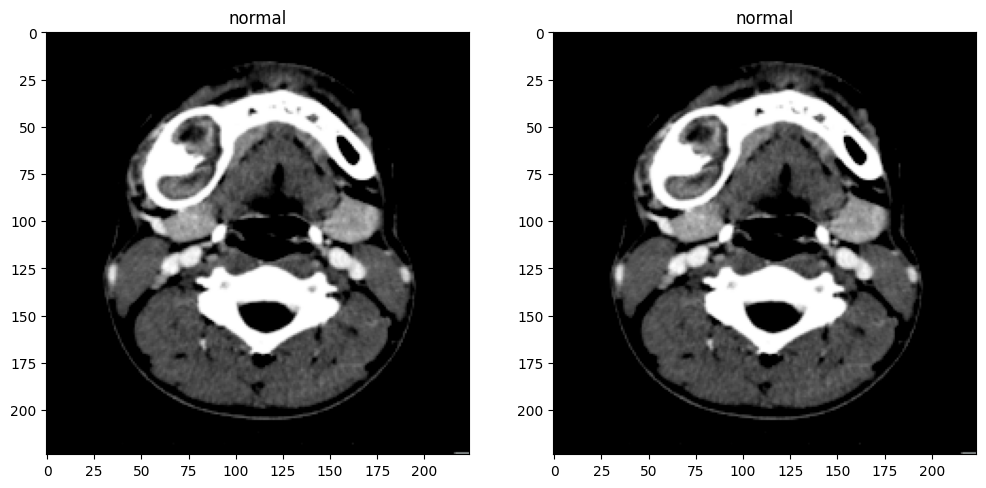

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


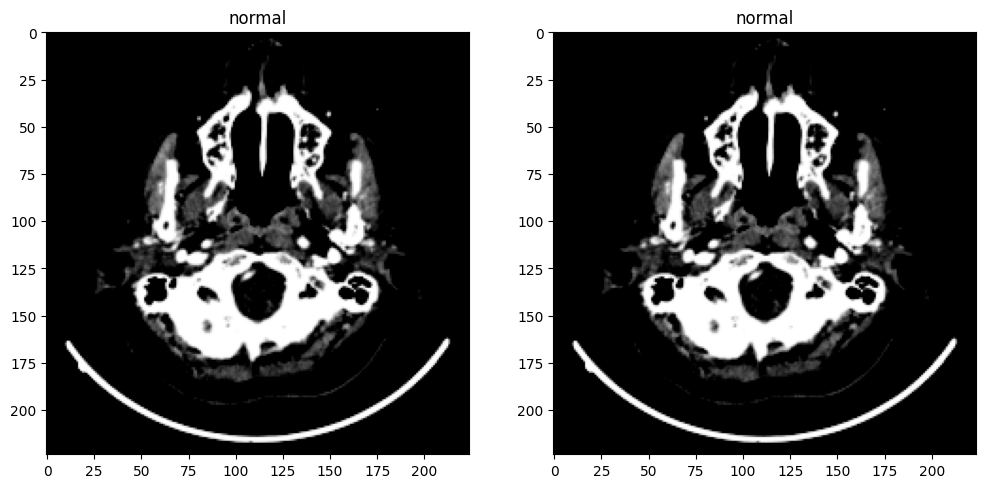

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


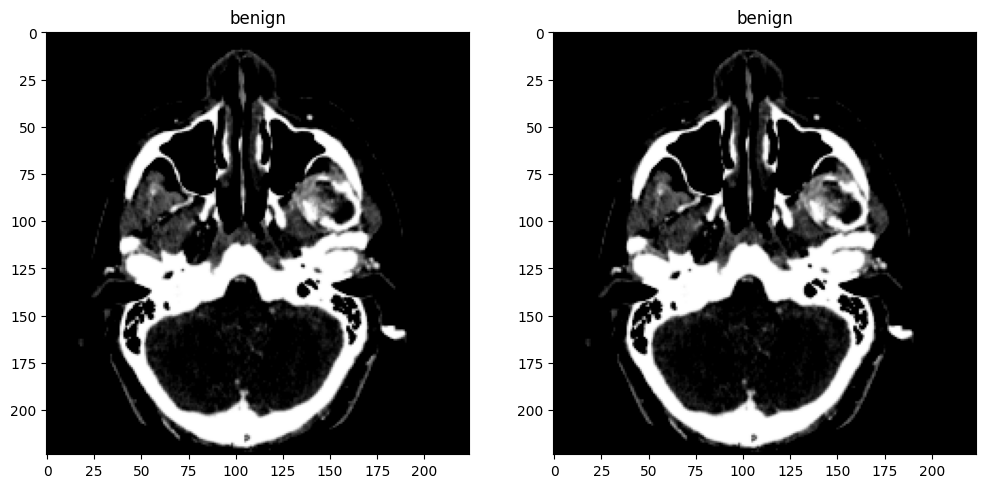

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


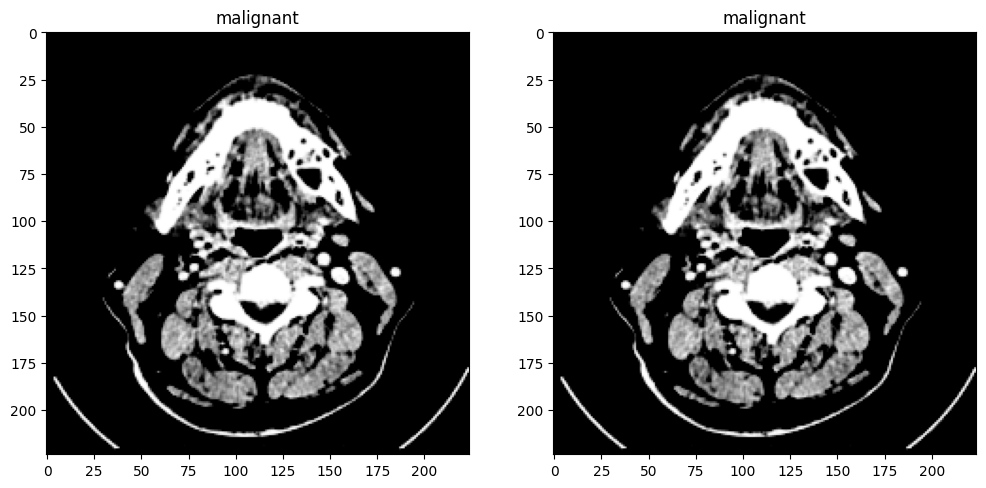

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


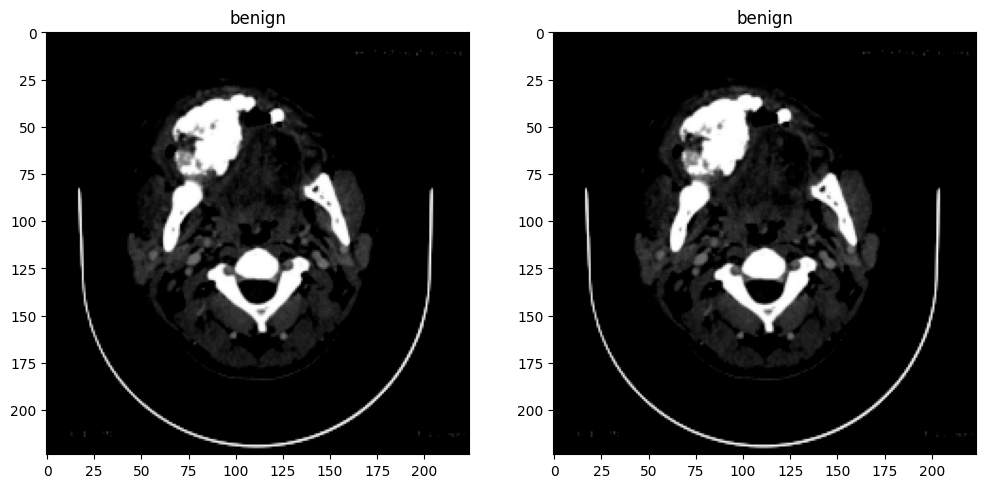

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


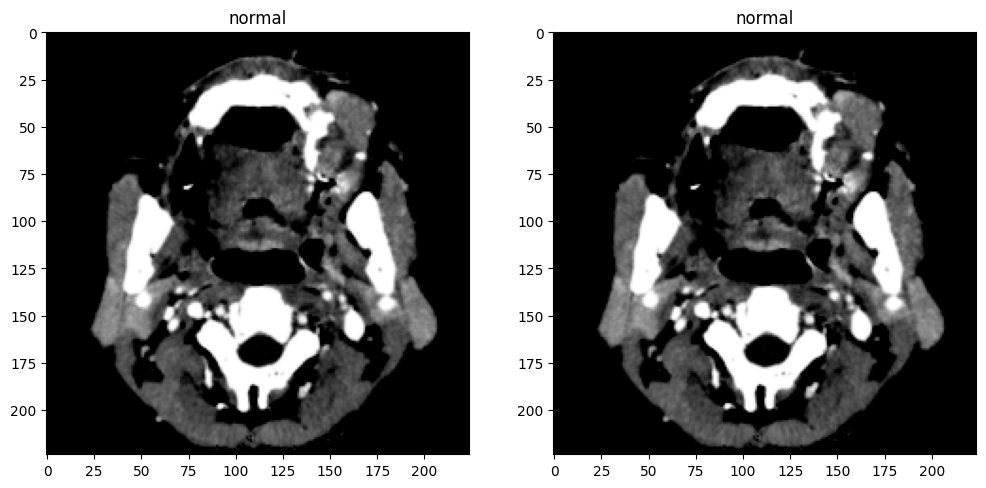

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


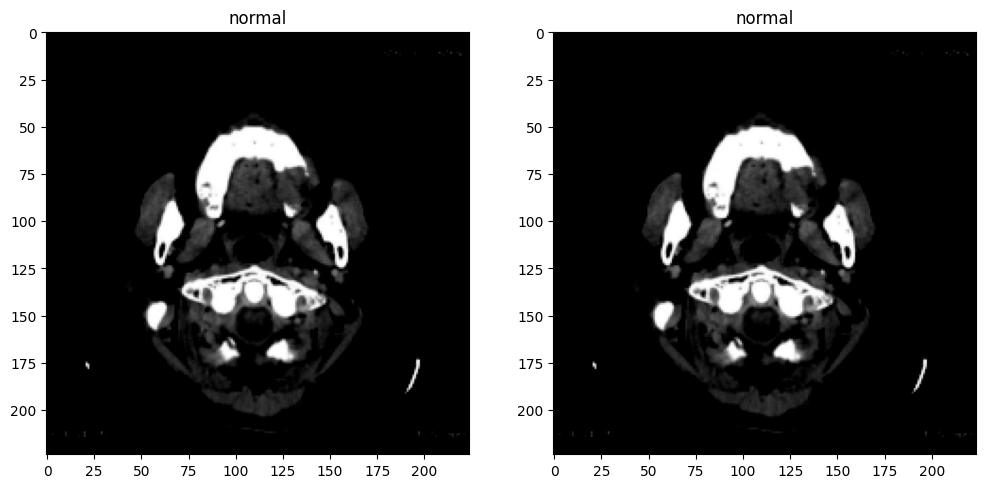

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


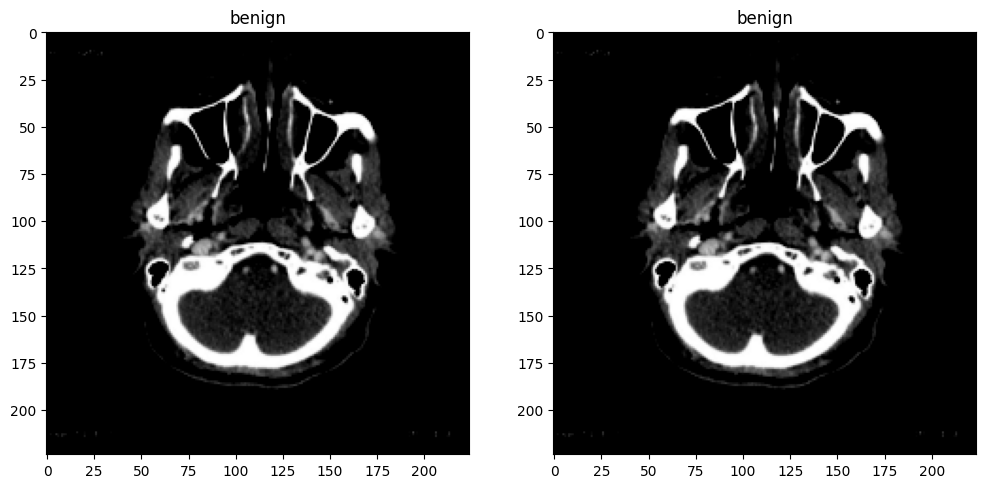

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


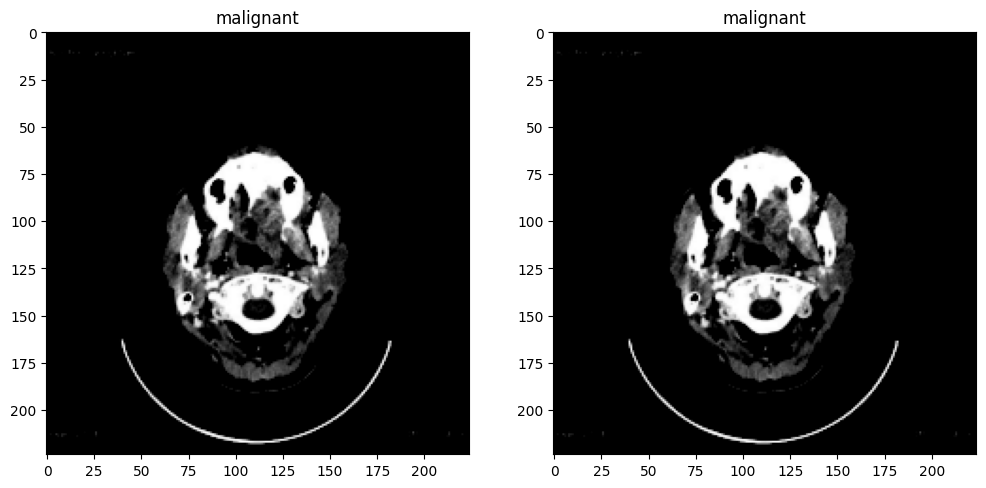

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


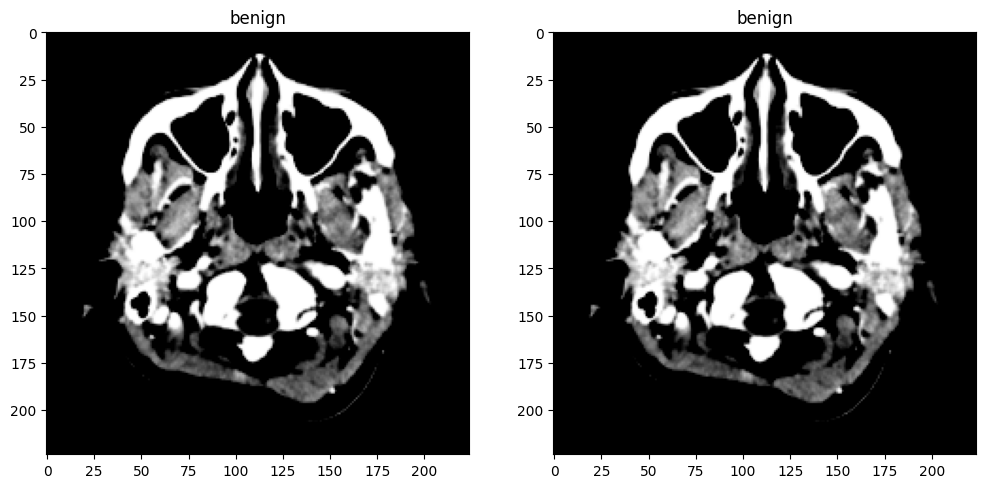

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


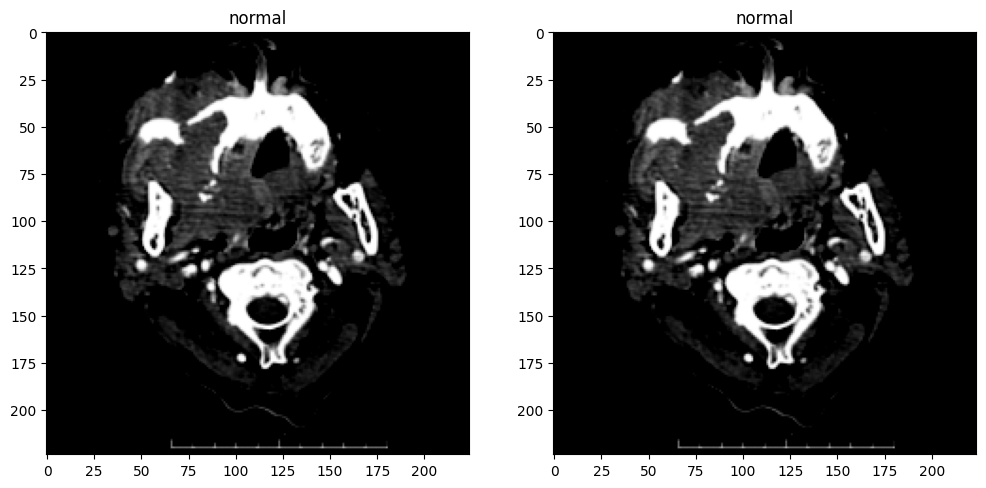

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


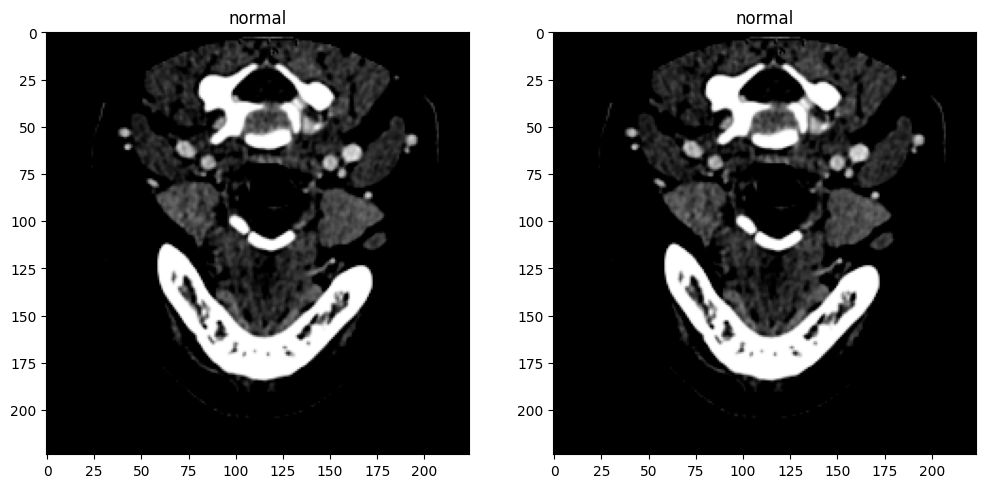

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


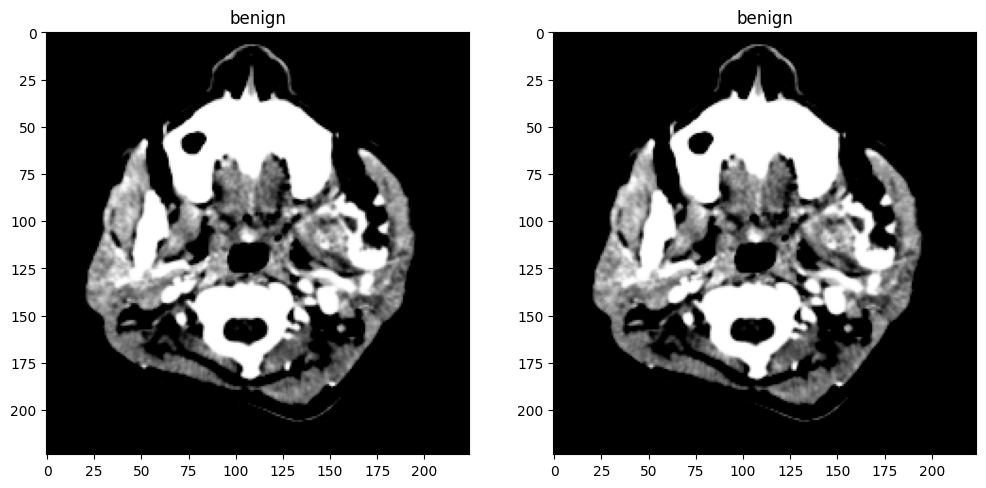

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


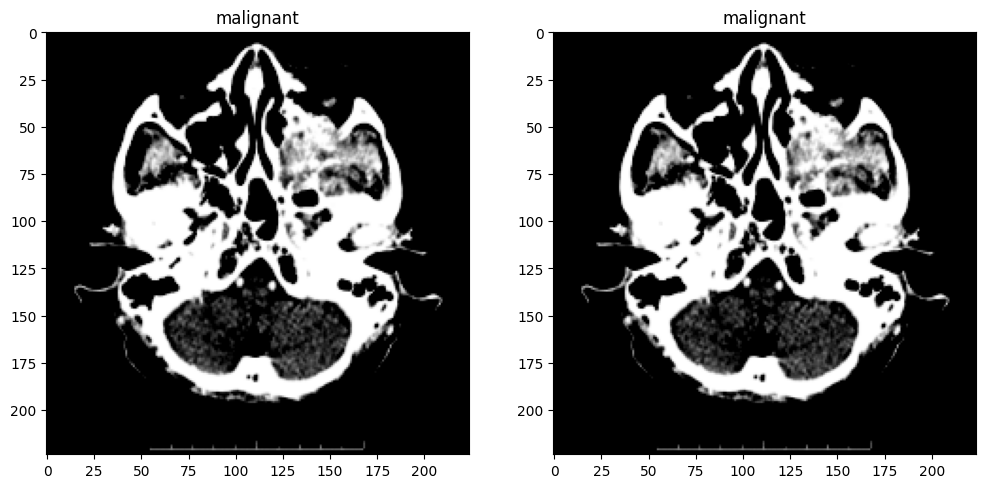

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


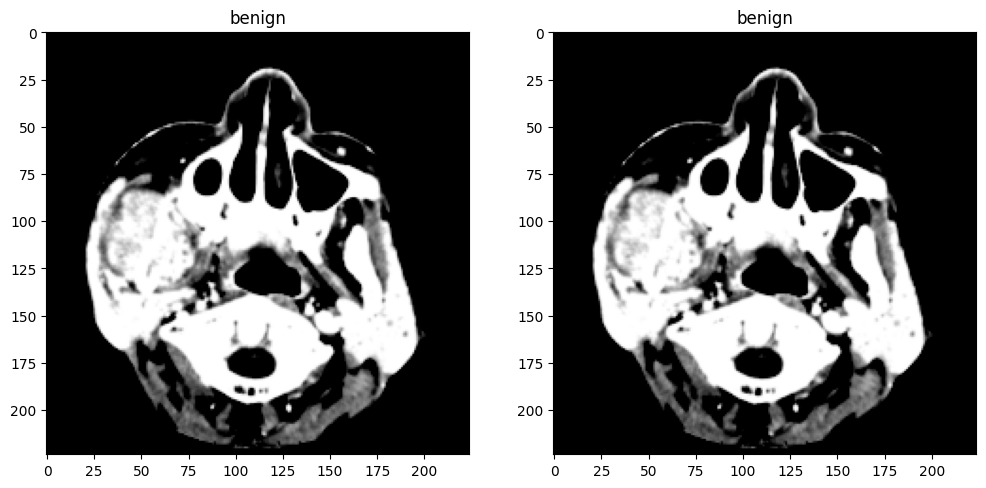

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


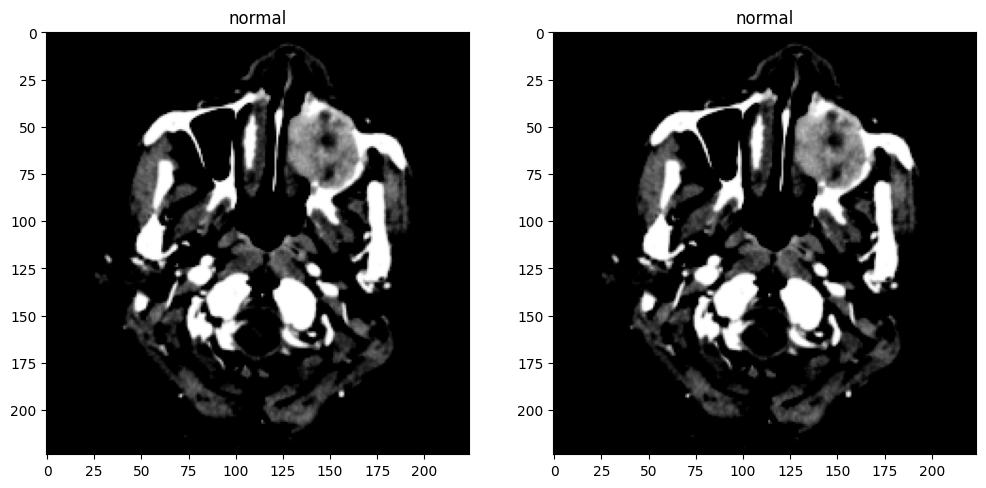

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


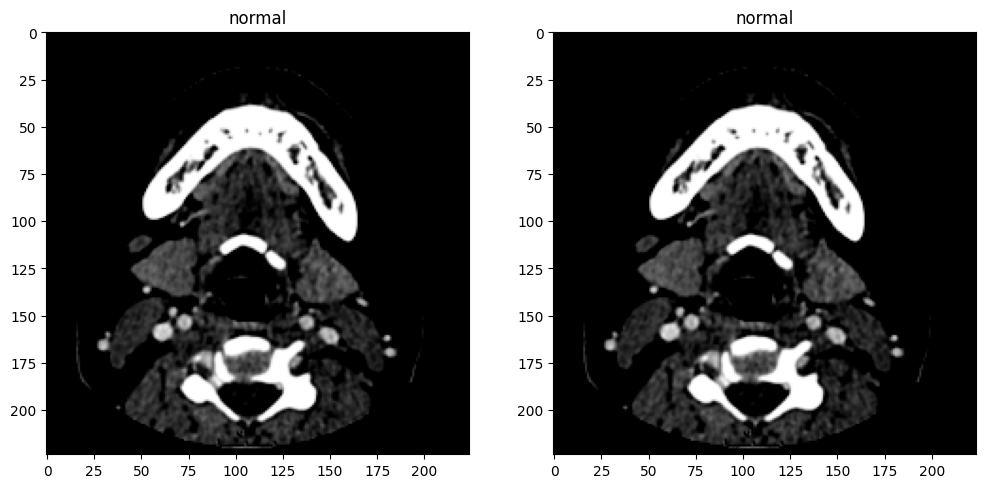

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


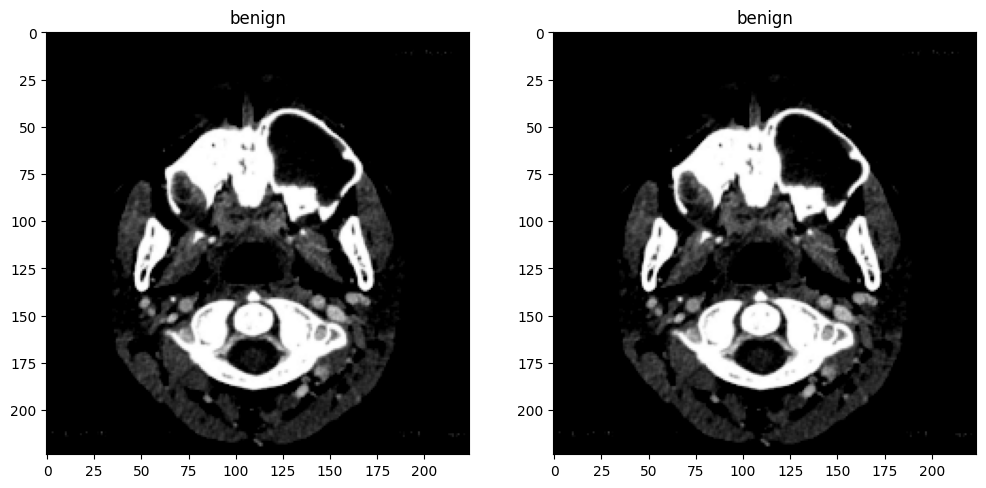

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


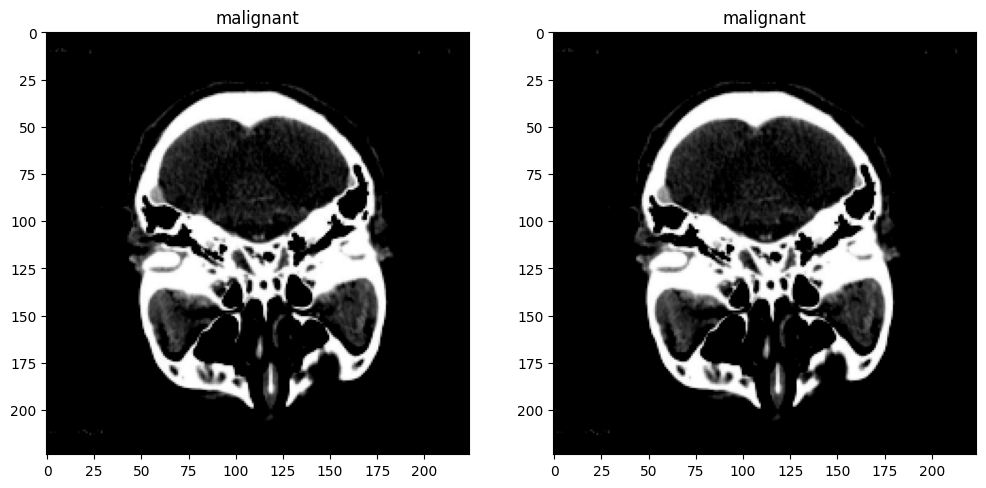

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


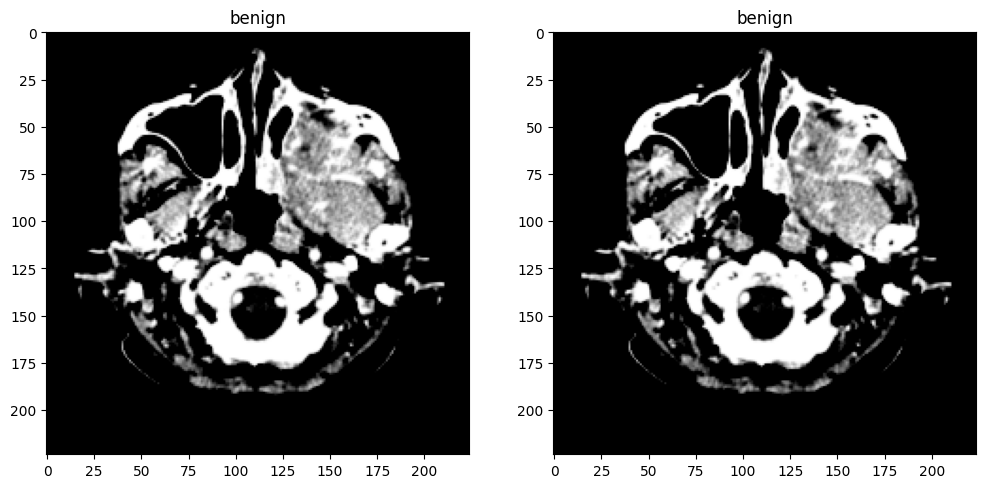

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


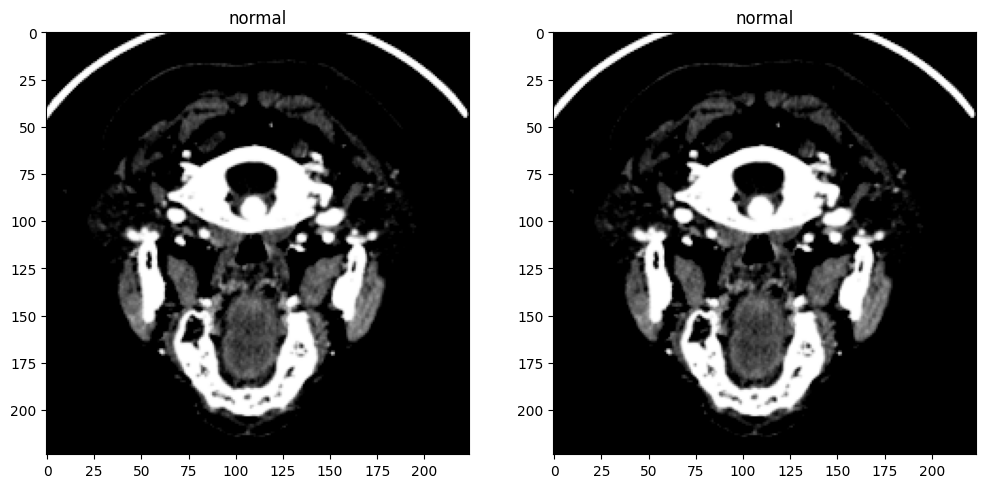

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


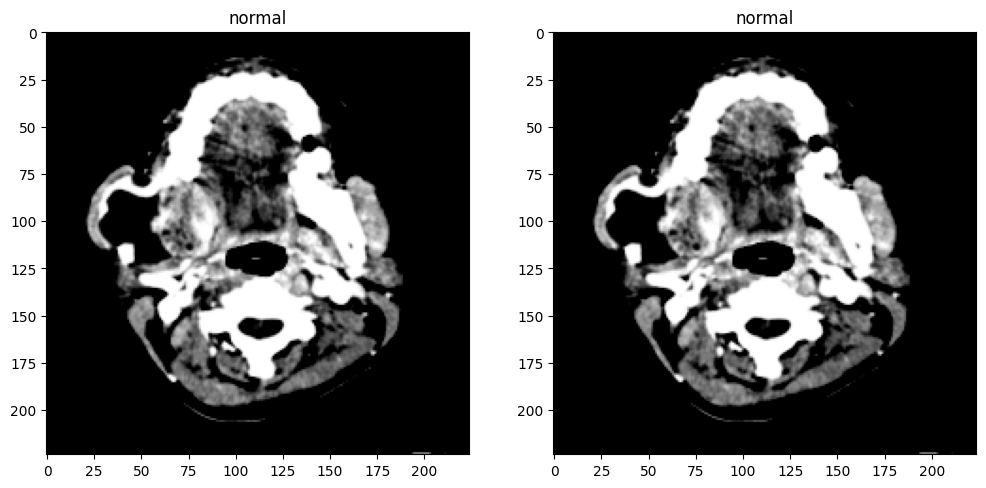

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


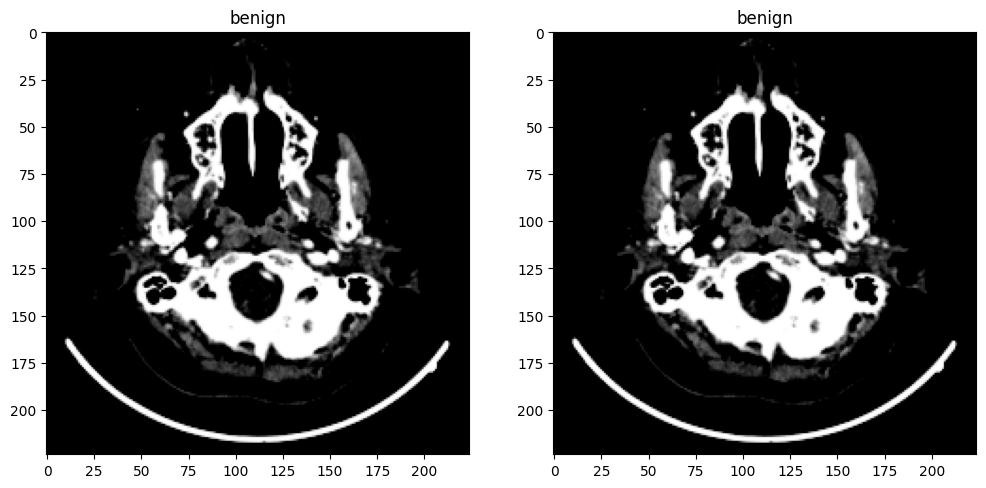

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


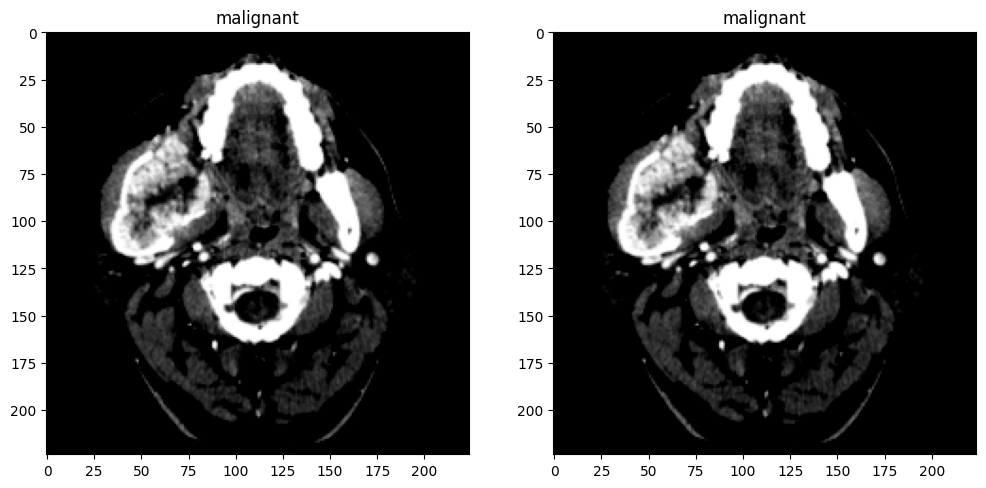

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


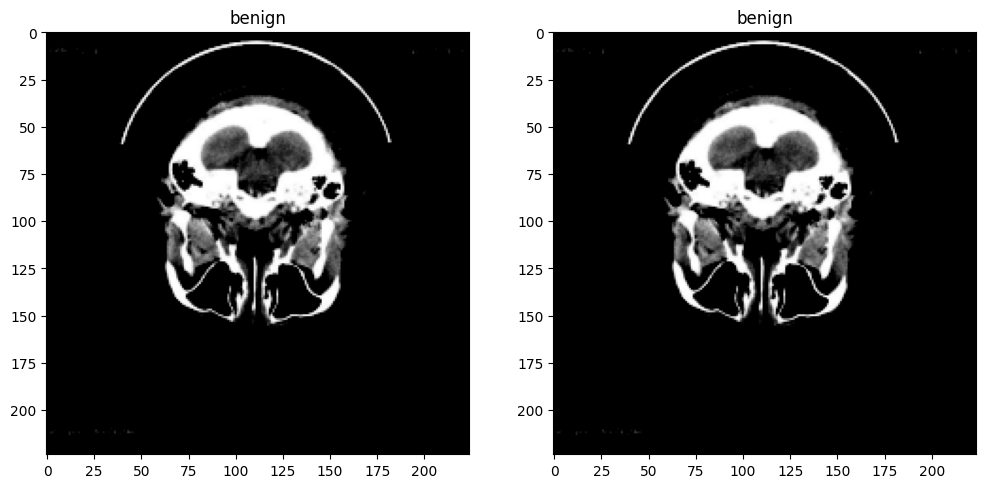

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


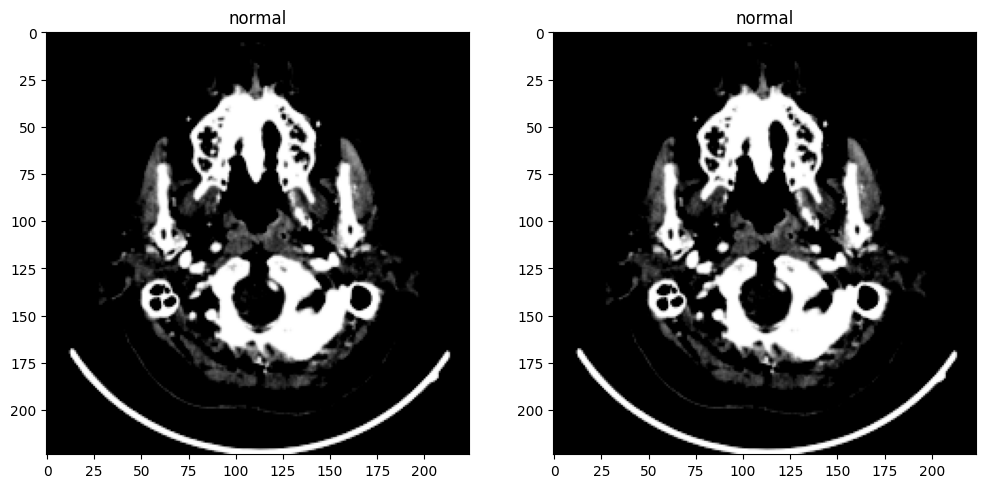

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


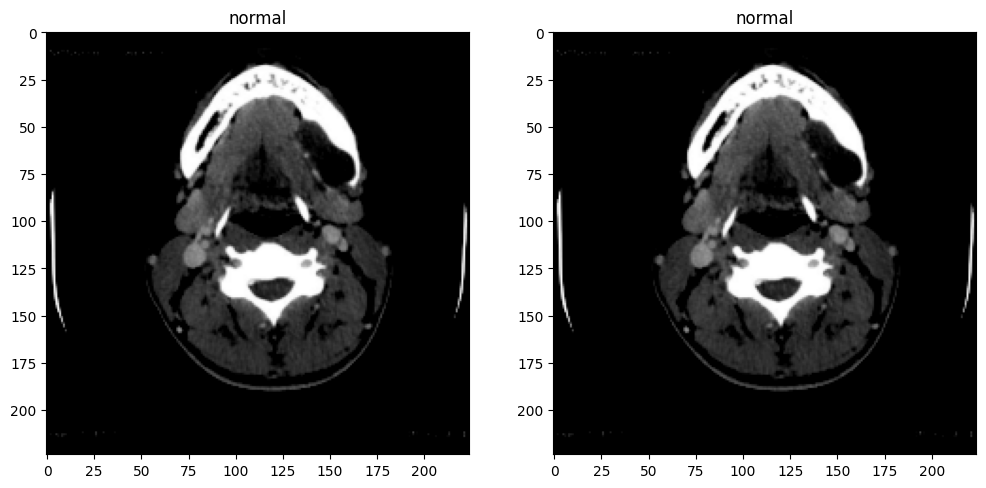

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


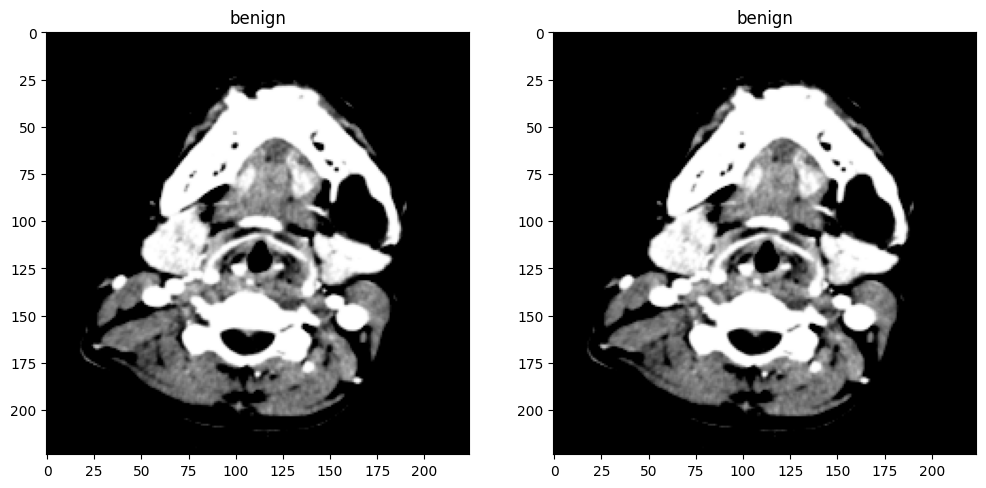

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


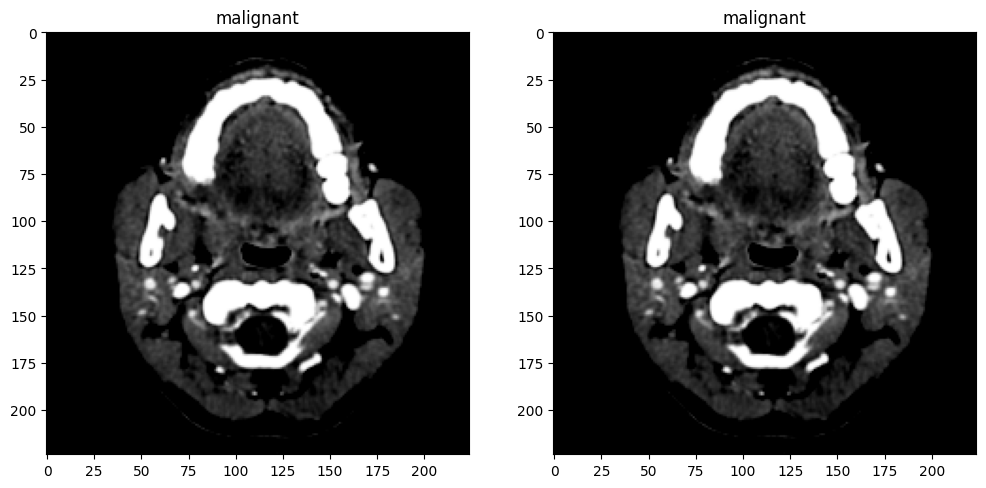

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


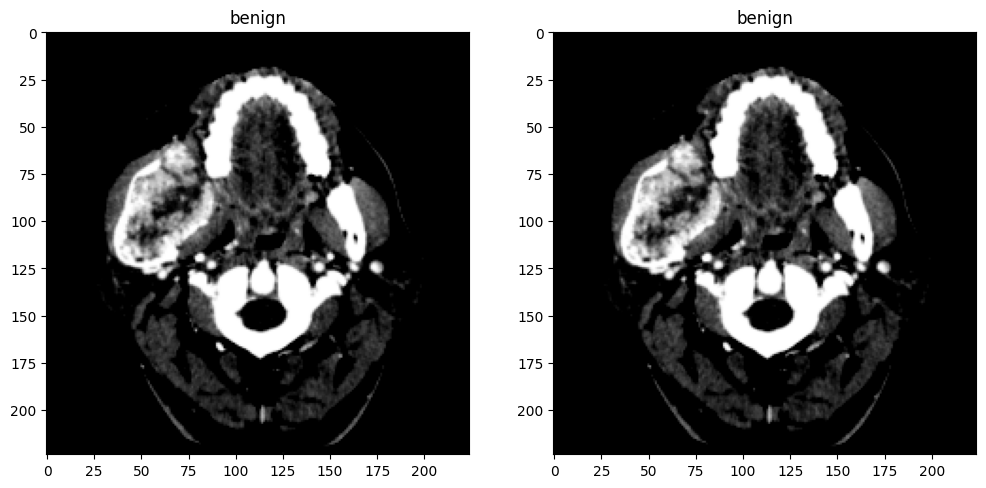

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


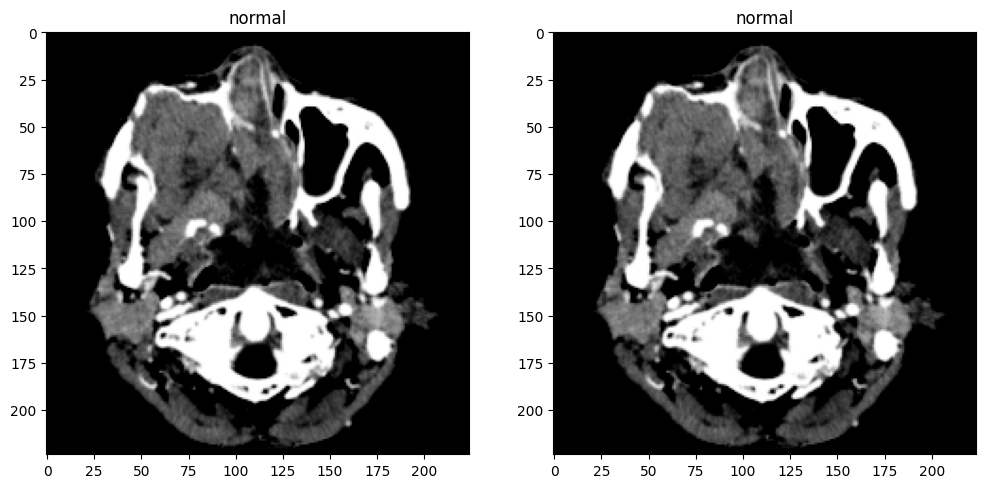

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


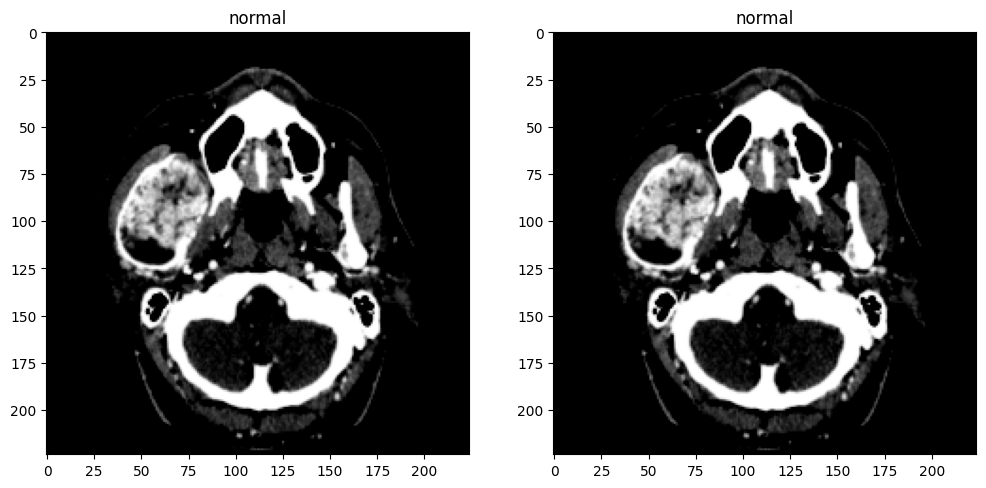

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


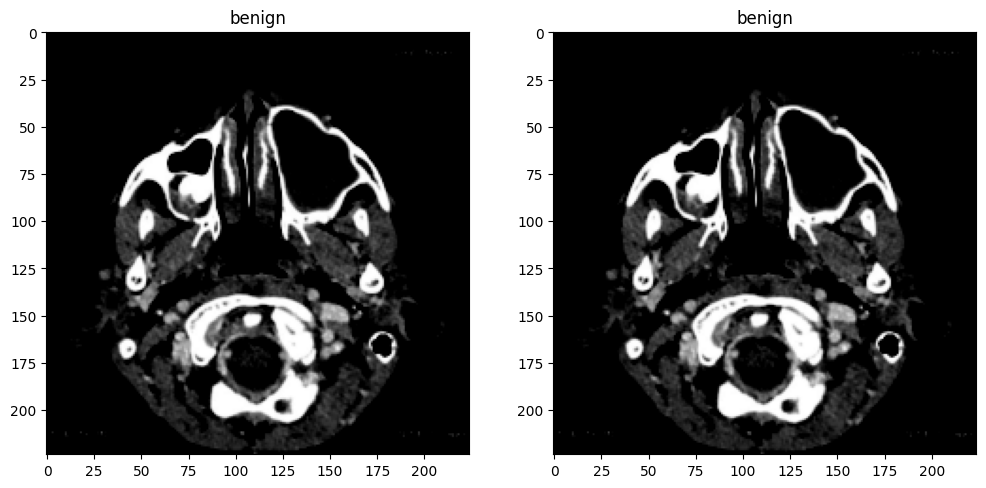

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


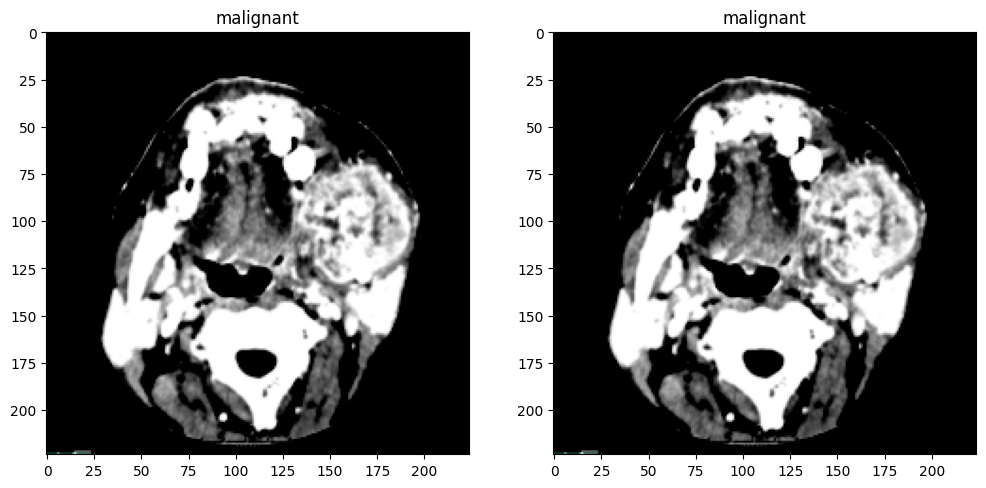

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


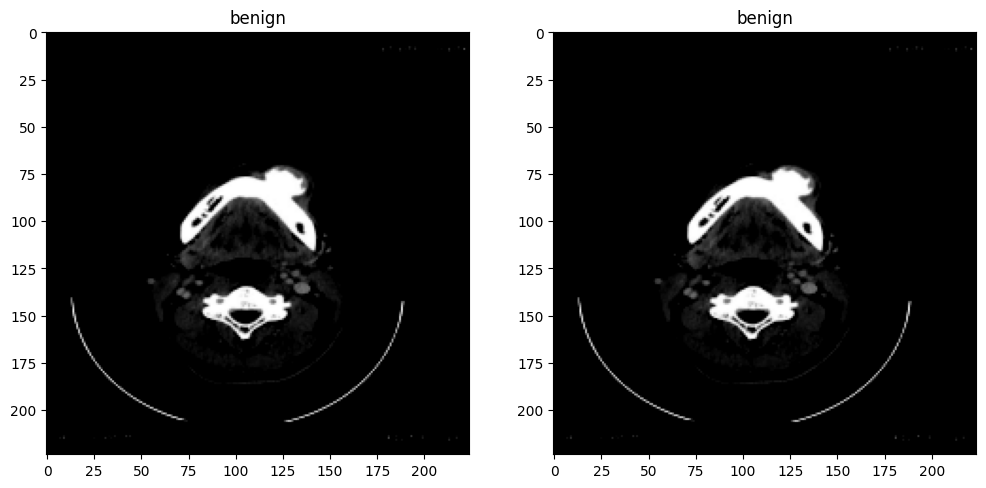

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


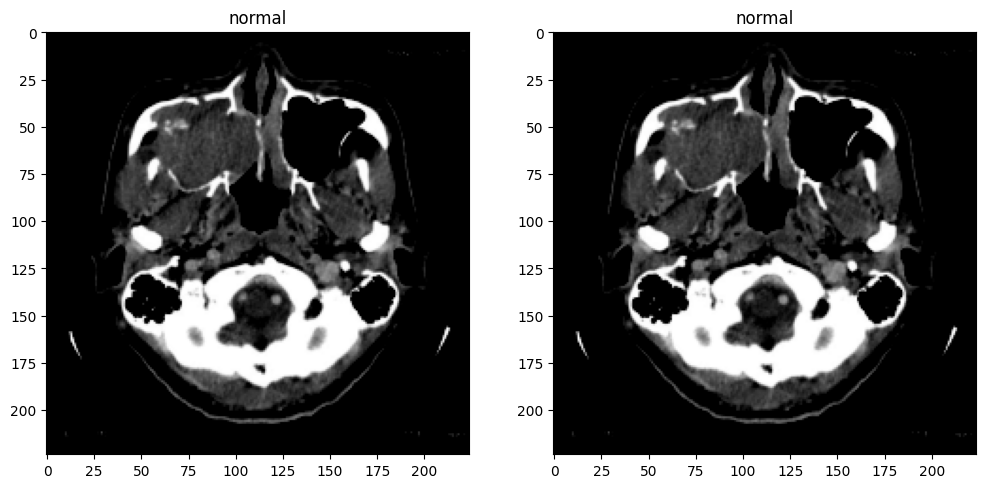

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


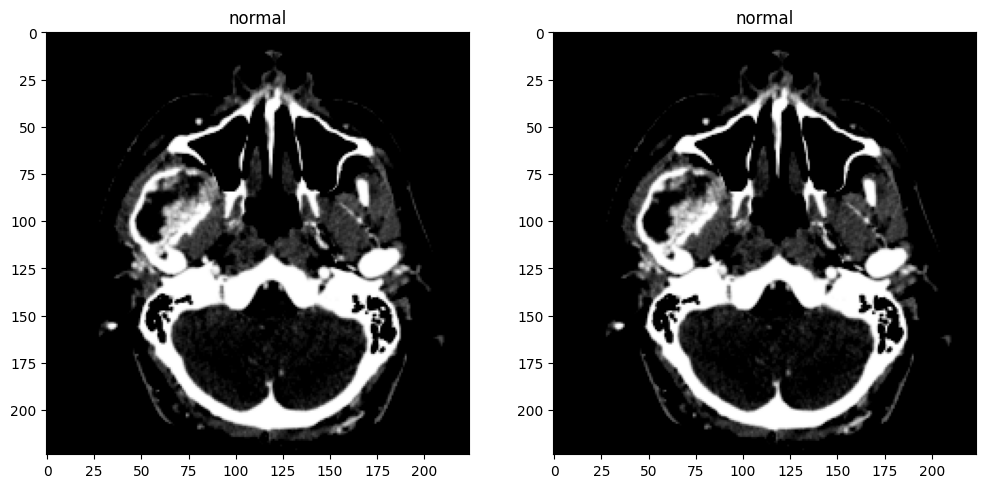

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


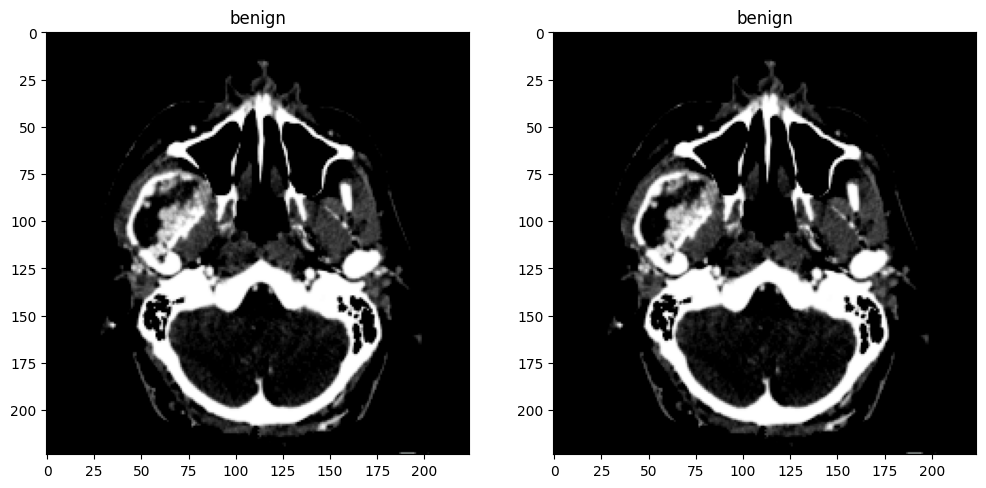

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


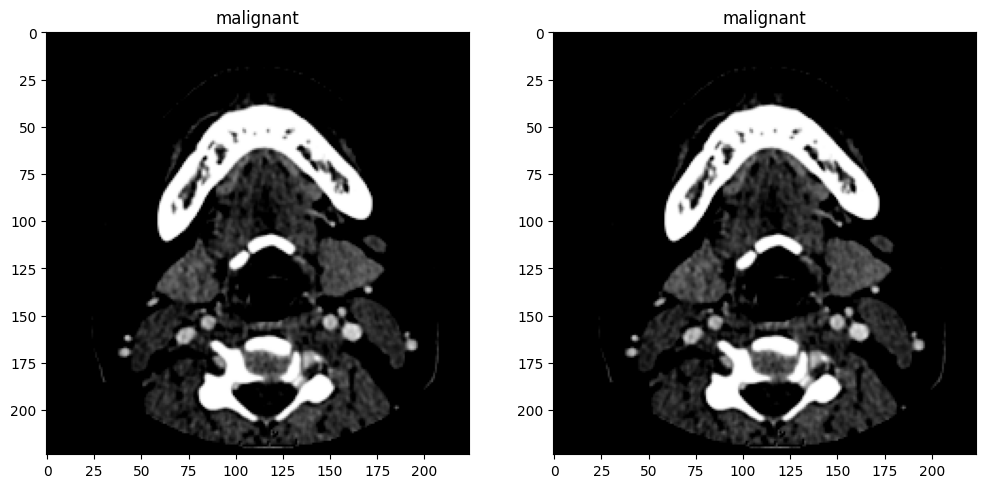

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


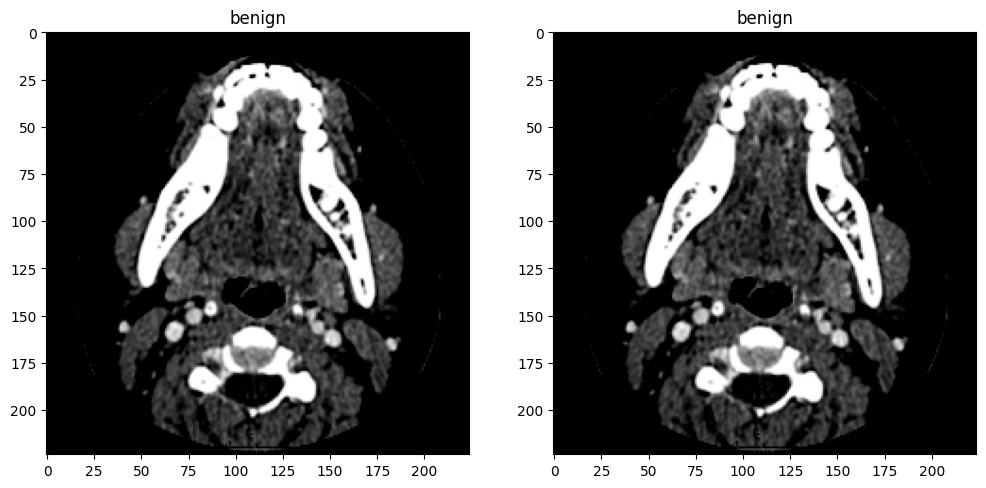

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


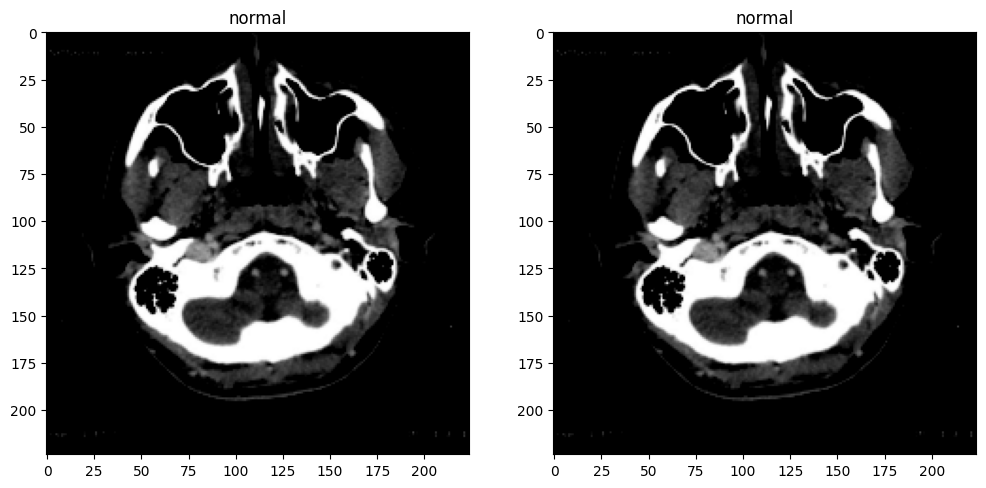

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


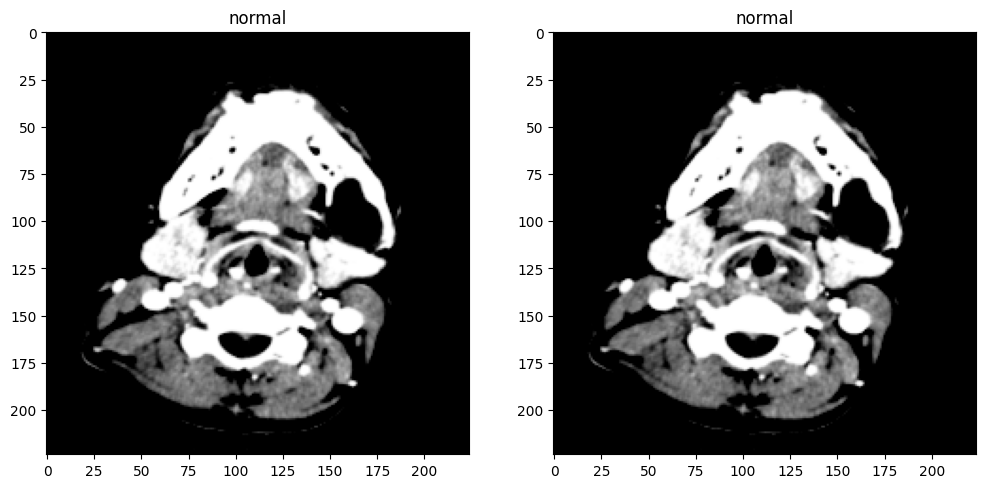

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


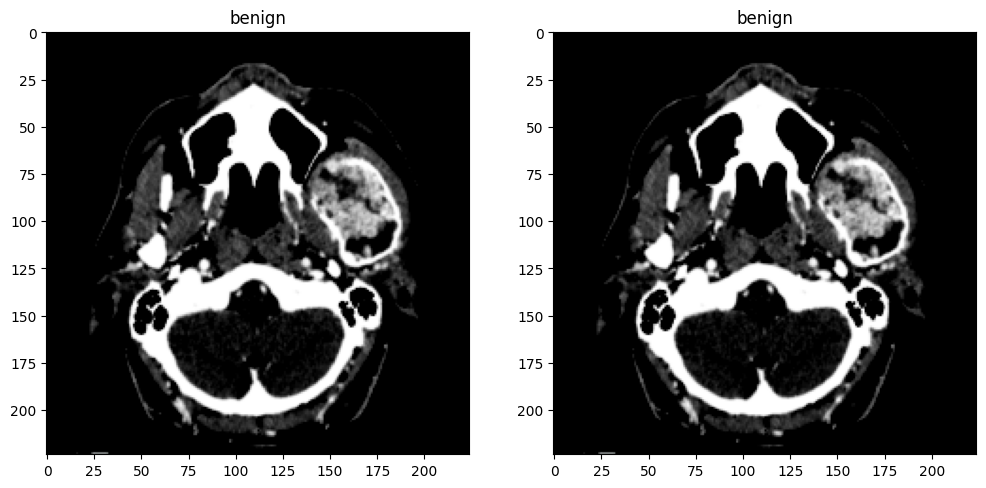

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


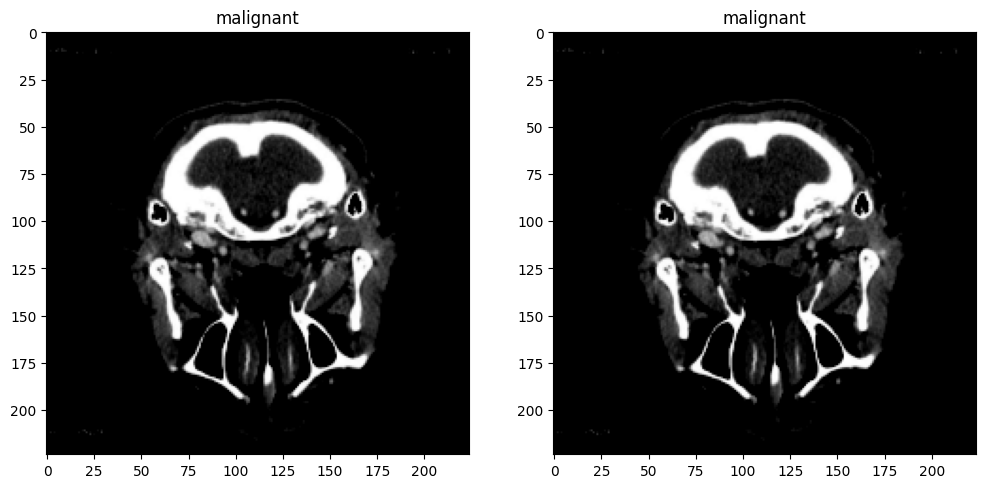

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


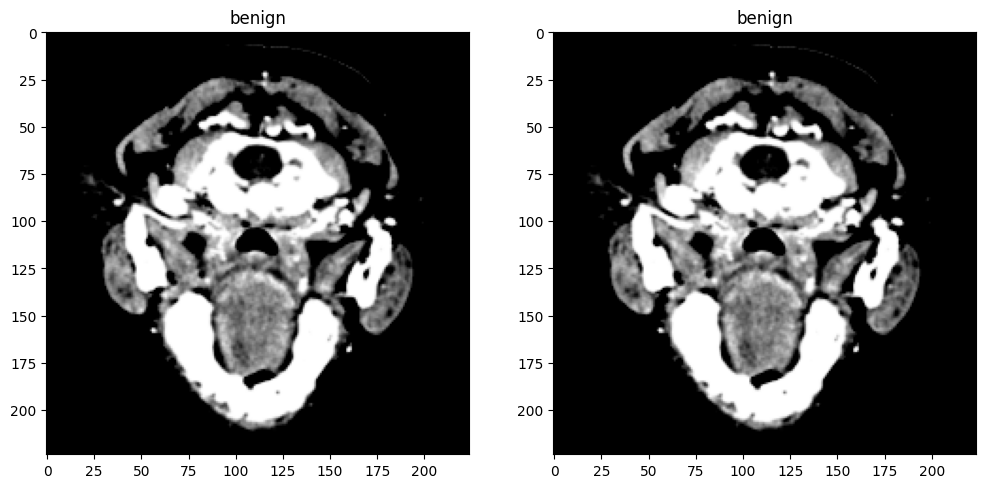

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


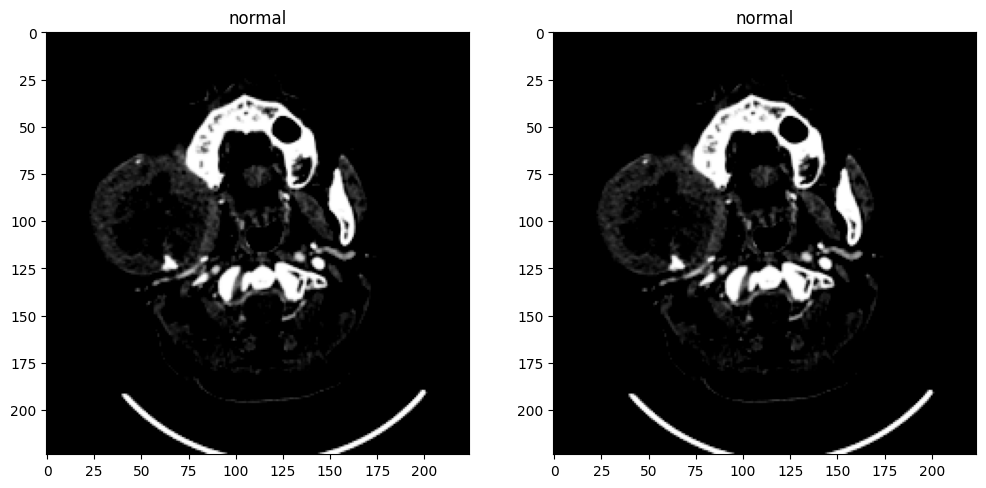

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


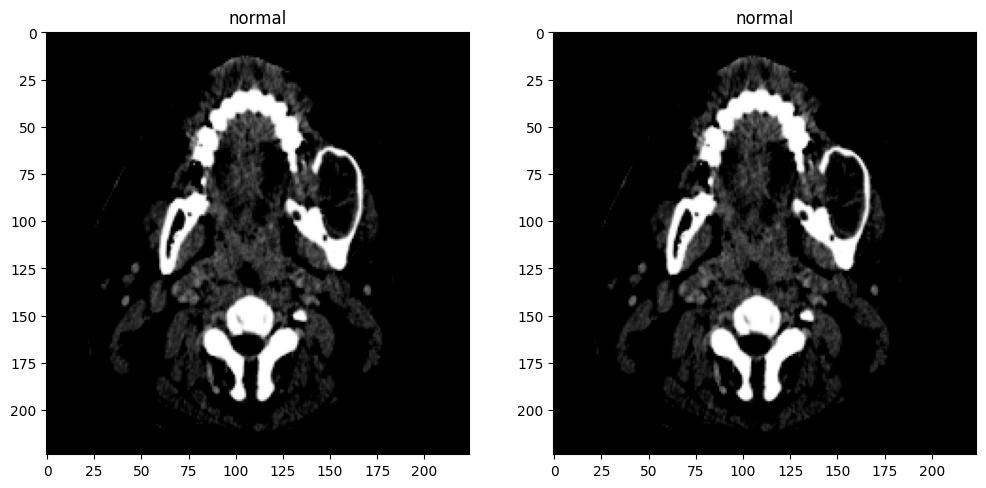

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

KeyboardInterrupt



In [227]:
class_map = {1:'benign', 2:'malignant', 0:'normal'}

for img,label in test_loader:
    
    for i in range(0, 5):
        
        plt.figure(figsize=(12, 10))   
        
        plt.subplot(1, 2, 1)
        plt.title('Predict')
        plt.imshow(img[i].to('cpu').permute(1, 2, 0))
        plt.title(classes[y_pred[i]])
                   
        plt.subplot(1, 2, 2)
        plt.title('Actual')
        plt.imshow(img[i].to('cpu').permute(1, 2, 0))        
        plt.title(classes[y_true[i].item()])
    
        plt.show()
        
break